## DS5001: Exploratory Text Analytics Final Project
### University of Virginia
### MSDS, Summer 2020
#### Travis Vitello (tjv9qh@virginia.edu)

# <h1 align="center">Cav Them Jewels Fast:</h1>
## <h2 align="center">A Lyrical Study of Run the Jewels</h2>

## Introduction

For this project, we'll consider as our corpus the lyrics available for the <a href="https://runthejewels.com/"> Run the Jewels</a> discography per <a href="https://genius.com/artists/Run-the-jewels">Genius.com</a>

Note that we only consider the albums *Run the Jewels*, *Run the Jewels 2*, *Run the Jewels 3*, and *RTJ4*.  We will also include the *Meow the Jewels* remix album in our corpus; however, no extraneous EPs or singles will be included.  Collaborations by El-P or Killer Mike with other artists are also not considered in this study.

It is recognized that *Meow the Jewels* should strongly resemble the *Run the Jewels 2* album, which we will anticipate seeing in the results of our analysis.

<b>NOTE:</b> <a href="https://en.wikipedia.org/wiki/Run_the_Jewels">Run the Jewels</a> is a modern American hip-hop duo.  The subject matter of their lyrics and language used is considered mature.  Significant effort is included to censor lyrics and song-titles whenever displayed, however analysis will be performed on the uncensored language.

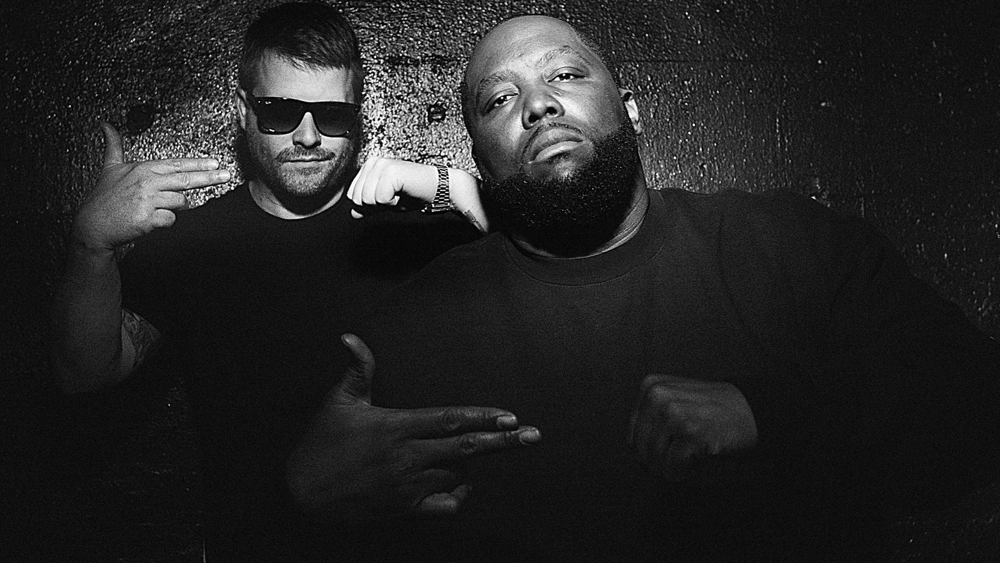

In [4]:
import os
from PIL import Image
from os import path, getcwd
d = os.getcwd()
Image.open(path.join(d, "rtj_elp_km.jpg"))

Image per https://www.npr.org/sections/microphonecheck/2014/11/11/363125142/run-the-jewels-im-taking-this-life

In [5]:
# Load libraries

from bs4 import BeautifulSoup
import requests
from IPython.core.display import HTML 
import time
import re
import pandas as pd
import numpy as np
import random
import seaborn as sns
import plotly_express as px
import nltk
from nltk import word_tokenize, pos_tag, pos_tag_sents
from numpy.linalg import norm
from scipy.spatial.distance import pdist
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from scipy.linalg import eigh as eig
from wordcloud import WordCloud, ImageColorGenerator
import urllib.request
from IPython.core.display import display, HTML
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from IPython.display import IFrame

sns.set()
%matplotlib inline

In [6]:
# define some useful functions

def findnth(string, substring, n):
    parts = string.split(substring, n + 1)
    if len(parts) <= n + 1:
        return -1
    return len(string) - len(parts[-1]) - len(substring)

# Adapted from code available:
# https://www.tutorialspoint.com/How-to-find-the-nth-occurrence-of-substring-in-a-string-in-Python

In [7]:
def df_clean(df):
    dummy = [censor_list_alt(x) for x in df["Token"].str.split()]
    df["Token"] = [" ".join(x) for x in dummy]
    
    df["POS_Tagged"] = "[("+ df["Token"] +", "+ df["POS"] +")]"
    
    return df

In [8]:
def get_title(string):
    return string[0:string.find("Lyrics")-1]

In [9]:
def get_ngrams(n_gram, n=2):
    
    dummy = [censor_list_alt(x) for x in n_gram['token_str'].str.split()]
    n_gram['token_str'] = [" ".join(x) for x in dummy]
    
    global OHCO_3
    
    # Create list to store copies of tokens table
    X = []
    
    # Convert the index to cols in order to change the value of token_num
    X.append(n_gram['token_str'].reset_index())
        
    # Create copies of token table for each level of ngram, offset by 1, and 
    # merge with previous 
    for i in range(1, n):
        X.append(X[0].copy())
        X[i]['Token_num'] = X[i]['Token_num'] + i
        X[i] = X[i].merge(X[i-1], on=OHCO_3, how='left', sort=True).fillna('<s>')
    
        
    # Compress tables to unique ngrams with counts
    for i in range(0, n):
        X[i] = X[i].drop(OHCO_3, 1)
        cols = X[i].columns.tolist()
        X[i]['n'] = 0
        X[i] = X[i].groupby(cols).n.apply(lambda x: x.count()).to_frame()
        X[i].index.names = ['w{}'.format(j) for j in range(i+1)]
            
    # Return just the ngram tables
    return X

In [10]:
def generate_text():
    n = 200
    start_word = VOCAB["term_str"][random.randint(0,len(VOCAB))]
    words = [start_word]
    for i in range(n):
        if len(words) == 1:
            try:
                w = m2m.loc[start_word]
                next_word = m2m.loc[start_word].sample(weights=w).index.values[0]
            except KeyError:
                w = m2m.loc["cat"]
                next_word = m2m.loc["cat"].sample(weights=w).index.values[0]
        elif len(words) > 1:
            bg = tuple(words[-2:])
            try:
                w = m3m.loc[bg]
                next_word = m3m.loc[bg].sample(weights=w).index.values[0]
            except KeyError:
                ug = bg[1]
                if ug == '<s>':
                    next_word = m1.sample(weights=m1.p).index[0]
                else:
                    w = m2m.loc[ug]
                    next_word = m2m.loc[ug].sample(weights=w).index.values[0]
        words.append(next_word)
    text = ' '.join(words)
    text = text.replace(' <s> <s>', '\n')
    text = text.replace('<s>', '')
    print(text)

In [11]:
def remove_blanks(string):
    lines = string.split("\n")
    string = [line for line in lines if line.strip() != ""]
    string_no_blanks = ""
    for line in string:
        string_no_blanks += line + "\n"
    return string_no_blanks

In [12]:
def censor_list_alt(word_list):  ### Censors our words after converting them to a list
        
    word_list_censored = [x[0] + x[1] + "*"*(len(x)-3) + x[len(x)-1] if \
                        " " + x + " " in text_cens and len(x) > 3
                                                 
                          else x[0] + "*" + x[2] if \
                          " " + x + " " in text_cens and len(x) < 4 \
                          
                          else x[0] + x[1] + "*"*(len(x)-3) + x[len(x)-1] if \
                          
                          x[2:5]  == "gga"
                          
                          else x[0] + x[1] + "*" + x[3:] if \
                          
                          x[6:14]  == "upalooza"
                          
                          else x[0] + x[1] + "*" + x[3:] if \
                          
                          x[3:]  == "knuts"
                          
                          else x[0] + x[1] + x[2] + "*" + x[4:] if \
                          
                          x[0:3]  == "mcf"
                          
                          else x[0:4] + "*" + x[5:] if \
                          
                          x[0:4]  == "muhf"
                        
                          else x[0:2] + "*" + x[3:] if \
                          
                          x[3:7]  == "kboy"
                          
                          else x[0:2] + "*" + x[3:] if \
                          
                          x[2:]  == "ckery"
                          
                          else x[0:2] + "*" + x[3:] if \
                          
                          x[1:]  == "hitll"
                          
                          else x[0:2] + "*"*(len(x)-3) + x[len(x)-1] if \
                          
                          x[2:7]  == "otyho"
                          
                          else x[0:2] + "*"*(len(x)-3) + x[len(x)-1] if \
                          
                          x[5:]  == "otstop"
                          
                          else x[0:2] + "*"*(len(x)-3) + x[len(x)-1] if \
                          
                          x[2:7]  == "thafu"
                          
                          else x[0:2] + "*"*(len(x)-3) + x[len(x)-1] if \
                          
                          x[0:3]  == "dic" and x[len(x)-1] == "s"
                          
                          else x[0:2] + "*"*(len(x)-3) + x[len(x)-1] if \
                          
                          x[1:6]  == "ullsh"
                          
                          else x[0:1] + "*" + x[len(x)-1] if \
                          
                          x[0:4]  == "aaas"
                          
                          else "nann" if \
                          
                          x  == "'nan'"        
                          
                          else x[0:2] + "*"*(len(x)-3) + x[len(x)-1] if \
                          
                          x[0:4] == "seme"
                          
                          else x[0:2] + "*"*(len(x)-3) + x[len(x)-1] if \
                          
                          x[1:] == "itty"
                          
                          else x[0:2] + "*"*(len(x)-3) + x[len(x)-1] if \
                          
                          x[1:5] == "hitt"
                          
                          else x[0:2] + "*"*(len(x)-3) + x[len(x)-1] if \
                          
                          x[1:6] == "ullsh"   
                          
                          else x[0:2] + "*"*(len(x)-3) + x[len(x)-1] if \
                          
                          x[1:6] == "atshi"    
                          
                          else x[0:2] + "*"*(len(x)-3) + x[len(x)-1] if \
                          
                          x[2:6] == "uche" and x[0] == "d"
                                                
                          else x\
                          
                          for x in word_list] 
    
    return word_list_censored

In [13]:
def opinion_score(word):  ### Scores word as positive or negative or neutral using Bing Liu opinion list
    
    if str(" " + word + " ") in text_pos:
        word_scored = 1
    elif str(" " + word + " ") in text_neg:
        word_scored = -1
    else:
        word_scored = 0
        
    return word_scored

In [14]:
def opinion_score_df(df):

    for x in range(len(df)):
        if opinion_score(df.Token[x]) == 1:
            df.negative[x] = 0
            df.positive[x] = 1
        elif opinion_score(df.Token[x]) == -1:
            df.negative[x] = -1
            df.positive[x] = 0
        else:
            df.negative[x] = 0
            df.positive[x] = 0

    return df    

In [15]:
def fix_word(word):  # Words needing manual adjustment partially due to how the lyrics appear on the genius.com site
# This list is probably not complete, but is a best-effort based on observed results from previous runs of this code
    
    return word.replace("hiiiiigh", "high").replace("rrun","run").replace("dieieieie","die")\
.replace("meowmeowmeowmeow", "meow meow meow meow").replace("eyeeyeeyeeyeeyes","eyes")\
.replace("nnever","never").replace("runrun","run run").replace("lilililililive","live")\
.replace("lllllights","lights").replace("gogogogo","go go go go").replace("’","'").replace("whowho","who who")\
.replace("heyhey"," hey hey").replace("rururun","run run run").replace("lililive","live").replace("tounge","tongue")\
.replace("heycheck", "hey check").replace("inwithana","in with an a").replace("outoutoutout","out out out out")\
.replace("gogogo", "go go go").replace("gogo", "go go").replace("yeahyeah", "yeah yeah").replace("forone", "for one")\
.replace("jamie","jaime").replace("uhuh","uh huh").replace("nenever", "never").replace("nnever","never")

In [16]:
def sample_lyrics(df):
    rows = []
    for idx in df.sample(10).index:
        valence = round(df.loc[idx, emo],4)     
        t = 0
        if valence > t: color = '#ccffcc'
        elif valence < t: color = '#ffcccc'
        else: color = '#f2f2f2'
        z=0
        rows.append("""<tr style="background-color:{0};padding:.5rem 1rem;font-size:110%;">
        <td>{1}</td><td>{3}</td><td width="400" style="text-align:left;">{2}</td>
        </tr>""".format(color, valence, df.loc[idx, 'html_str'], idx))

    display(HTML('<style>#sample1 td{font-size:120%;vertical-align:top;} .sent-1{color:red;font-weight:bold;} .sent1{color:green;font-weight:bold;}</style>'))
    display(HTML('<table id="sample1"><tr><th>Sentiment</th><th>ID</th><th width="600">Lyric</th></tr>'+''.join(rows)+'</table>'))

In [17]:
def plot_sentiments(df, emo='polarity'):
    FIG = dict(figsize=(25, 5), legend=True, fontsize=14, rot=45)
    df[emo].plot(**FIG)

In [18]:
def plot_sentiments_bing(df, emo='bing_polarity'):
    FIG = dict(figsize=(25, 5), legend=True, fontsize=14, rot=45)
    df[emo].plot(**FIG)

In [19]:
def predict_lyrics(lyr_str):
    tokens = pd.DataFrame(lyr_str.lower().split(),columns=['term_str'])
    tokens['term_str'] = tokens['term_str'].str.replace(r'[\W_]', '')
    tokens = tokens.merge(VOCAB, on = 'term_str', how='left')
    tokens.loc[tokens['p'].isna(),['p','log_p']] = [smooth, np.log2(smooth)]
    p = tokens['p'].product()
    log_p = tokens['log_p'].sum()
    print('-'*50)
    print("p('{}') = {}; log2: {}".format(lyr_str,p,log_p))
    print('-'*50)
    print(tokens[['term_str','n','p','log_p']])
    print('-'*50)

In [20]:
def vis_pcs(M, a, b, prefix='PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b), 
                        color='artist', 
                        hover_name='label', marginal_x='box')
    fig.show()

In [21]:
def vis_pcs_s(M, a, b, prefix='PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b), 
                        color='label', 
                        hover_name='title', marginal_x='box')
    fig.show()

In [22]:
# Build string of censored words

url_cens = requests.get("https://github.com/RobertJGabriel/Google-profanity-words/blob/master/list.txt").text
# This is amazingly not a complete list of words, but it's mostly OK for use here (obviously some 
# additional strings were needed to be captured, since the use of language by RTJ is inventive, to say the least!)


soup_cens = BeautifulSoup(url_cens, 'html.parser')
text_cens = soup_cens.get_text()
text_cens = text_cens[(findnth(text_cens,"Blame",0))+len("Blame"):text_cens.find("Copy lines",0)]
# https://kite.com/python/answers/how-to-remove-empty-lines-from-a-string-in-python#:~:text=strip()%20!%3D,to%20the%20empty%20string%20str1%20.
lines = text_cens.split("\n")
non_empty_lines = [line for line in lines if line.strip() != ""]

string_without_empty_lines = ""
for line in non_empty_lines:
      string_without_empty_lines += line + "\n"

text_cens = string_without_empty_lines.replace("\n", "   ").replace(" ","-").replace("---"," ").replace(" -"," ")

text_cens = " " + text_cens

In [23]:
# Build string of postive words
url_pos = requests.get("https://github.com/xxiang13/InsideOut_Movie_Script_Text_Analytics/blob/master/opinion-lexicon-English/positive-words.txt").text
soup_pos = BeautifulSoup(url_pos, 'html.parser')
text_pos = soup_pos.get_text()
text_pos = text_pos[(findnth(text_pos,";;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;"\
                            ,1))+len(";;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;"):\
                   text_pos.find("Copy lines",0)]
lines = text_pos.split("\n")
non_empty_lines = [line for line in lines if line.strip() != ""]
string_without_empty_lines = ""
for line in non_empty_lines:
      string_without_empty_lines += line + "\n"

text_pos = string_without_empty_lines.replace("\n", "   ").replace(" ","-").replace("---"," ").replace(" -"," ")

text_pos = " " + text_pos

#text_pos = text_pos[0:len(text_pos)-1]

In [24]:
# Build string of negative words
url_neg = requests.get("https://github.com/xxiang13/InsideOut_Movie_Script_Text_Analytics/blob/master/opinion-lexicon-English/negative-words.txt").text
soup_neg = BeautifulSoup(url_neg, 'html.parser')
text_neg = soup_neg.get_text()
text_neg = text_neg[(findnth(text_neg,";;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;"\
                            ,1))+len(";;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;")+3:\
                   text_neg.find("Copy lines",0)]
lines = text_neg.split("\n")
non_empty_lines = [line for line in lines if line.strip() != ""]
string_without_empty_lines = ""
for line in non_empty_lines:
      string_without_empty_lines += line + "\n"

text_neg = string_without_empty_lines.replace("\n", "   ").replace(" ","-").replace("---"," ").replace(" -"," ")     

text_neg = " " + text_neg

#text_neg = text_neg[0:len(text_neg)-1]

# Data Acquisition and Clean-up

In the following section, our corpus is constructed through the scraping of Run the Jewels lyrics across their four major albums.  Data will be scraped using BeautifulSoup's HTML parser.

It is noted that lyrics will be cleaned by removing extraneous characters from the webscraping, followed by cleaning actions including the elimination of blank lines within the lyrics, elimination of punctuation marks, and setting all text to lower-case for uniformity.  Additionally, lyric notes contained within square brackets will be removed.

We recognized that each scraped song is unique, however we bound our text by the song's title and a constant phrase found on each genius.com lyrics page (specifically the phase "More on Genius").  As such, it is unimportant which character position begins or ends the lyrics within each scraping.

We will also extract the song's title (which we know in advance, but can also extract from the scrapings directly).  We print the song titles for reference to ensure performance of the code as intended.

Get *Run the Jewels* (2013) lyrics:

In [25]:
rtj_urls = []

with open("rtj_url.txt") as f:
    for line in f:
        rtj_urls.append(line.replace('\n',''))

In [26]:
URL_a1t1 = requests.get(rtj_urls[0]).text
URL_a1t2 = requests.get(rtj_urls[1]).text
URL_a1t3 = requests.get(rtj_urls[2]).text
URL_a1t4 = requests.get(rtj_urls[3]).text
URL_a1t5 = requests.get(rtj_urls[4]).text
URL_a1t6 = requests.get(rtj_urls[5]).text
URL_a1t7 = requests.get(rtj_urls[6]).text
URL_a1t8 = requests.get(rtj_urls[7]).text
URL_a1t9 = requests.get(rtj_urls[8]).text
URL_a1t10 = requests.get(rtj_urls[9]).text
URL_a1t11 = requests.get(rtj_urls[10]).text

In [27]:
soup_a1t1 = BeautifulSoup(URL_a1t1, 'html.parser')
text_a1t1 = soup_a1t1.get_text()  #soup.pre
text_a1t1 = text_a1t1[(findnth(text_a1t1,"Run the Jewels Lyrics",1)):text_a1t1.rfind("More on Genius")]
time.sleep(2)

In [28]:
title_a1t1 = get_title(text_a1t1)
text_a1t1 = remove_blanks(re.sub('\[.*?\]',"",text_a1t1)[text_a1t1.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))

In [29]:
soup_a1t2 = BeautifulSoup(URL_a1t2, 'html.parser')
text_a1t2 = soup_a1t2.get_text()  #soup.pre
text_a1t2 = text_a1t2[(findnth(text_a1t2,"Banana Clipper Lyrics",1)):text_a1t2.find("More on Genius")]
time.sleep(2)

In [30]:
title_a1t2 = get_title(text_a1t2)

text_a1t2 = remove_blanks(re.sub('\[.*?\]',"",text_a1t2)[text_a1t2.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))

In [31]:
soup_a1t3 = BeautifulSoup(URL_a1t3, 'html.parser')
text_a1t3 = soup_a1t3.get_text()  
text_a1t3 = text_a1t3[(findnth(text_a1t3,'36" Chain Lyrics',1)):text_a1t3.find("More on Genius")]
time.sleep(2)

In [32]:
title_a1t3 = get_title(text_a1t3)

text_a1t3 = remove_blanks(re.sub('\[.*?\]',"",text_a1t3)[text_a1t3.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))

In [33]:
soup_a1t4 = BeautifulSoup(URL_a1t4, 'html.parser')
text_a1t4 = soup_a1t4.get_text()
text_a1t4 = text_a1t4[(findnth(text_a1t4,"DDFH Lyrics",1)):text_a1t4.find("More on Genius")]
time.sleep(2)

In [34]:
title_a1t4 = get_title(text_a1t4)

text_a1t4 = remove_blanks(re.sub('\[.*?\]',"",text_a1t4)[text_a1t4.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))

In [35]:
soup_a1t5 = BeautifulSoup(URL_a1t5, 'html.parser')
text_a1t5 = soup_a1t5.get_text()  #soup.pre
text_a1t5 = text_a1t5[(findnth(text_a1t5,"Sea Legs Lyrics",1)):text_a1t5.find("More on Genius")]
time.sleep(2)


In [36]:
title_a1t5 = get_title(text_a1t5)

text_a1t5 = remove_blanks(re.sub('\[.*?\]',"",text_a1t5)[text_a1t5.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))

In [37]:
soup_a1t6 = BeautifulSoup(URL_a1t6, 'html.parser')
text_a1t6 = soup_a1t6.get_text()  #soup.pre
text_a1t6 = text_a1t6[(findnth(text_a1t6,"Job Well Done Lyrics",1)):text_a1t6.find("More on Genius")]
time.sleep(2)
#print(text_a1t6)

In [38]:
title_a1t6 = get_title(text_a1t6)

text_a1t6 = remove_blanks(re.sub('\[.*?\]',"",text_a1t6)[text_a1t6.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))

In [39]:
soup_a1t7 = BeautifulSoup(URL_a1t7, 'html.parser')
text_a1t7 = soup_a1t7.get_text()  #soup.pre
text_a1t7 = text_a1t7[(findnth(text_a1t7,"No Come Down Lyrics",1)):text_a1t7.find("More on Genius")]
time.sleep(2)
#print(text_a1t7)

In [40]:
title_a1t7 = get_title(text_a1t7)

text_a1t7 = remove_blanks(re.sub('\[.*?\]',"",text_a1t7)[text_a1t7.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))

In [41]:
soup_a1t8 = BeautifulSoup(URL_a1t8, 'html.parser')
text_a1t8 = soup_a1t8.get_text()  
text_a1t8 = text_a1t8[(findnth(text_a1t8,"Get It Lyrics",1)):text_a1t8.find("More on Genius")]
time.sleep(2)


In [42]:
title_a1t8 = get_title(text_a1t8)

text_a1t8 = remove_blanks(re.sub('\[.*?\]',"",text_a1t8)[text_a1t8.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))

In [43]:
soup_a1t9 = BeautifulSoup(URL_a1t9, 'html.parser')
text_a1t9 = soup_a1t9.get_text() 
text_a1t9 = text_a1t9[(findnth(text_a1t9,"Twin Hype Back Lyrics",1)):text_a1t9.find("More on Genius")]
time.sleep(2)

In [44]:
title_a1t9 = get_title(text_a1t9)

text_a1t9 = remove_blanks(re.sub('\[.*?\]',"",text_a1t9)[text_a1t9.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))

In [45]:
soup_a1t10 = BeautifulSoup(URL_a1t10, 'html.parser')
text_a1t10 = soup_a1t10.get_text() 

In [46]:
text_a1t10 = text_a1t10[(findnth(text_a1t10,"king Miracle Lyrics",1))-15:text_a1t10.find("More on Genius")]
time.sleep(2)

In [47]:
title_a1t10 = get_title(text_a1t10)
text_a1t10 = remove_blanks(re.sub('\[.*?\]',"",text_a1t10)[text_a1t10.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))

In [48]:
title_a1t10=title_a1t10.replace("ucking","u****g")

In [49]:
soup_a1t11 = BeautifulSoup(URL_a1t11, 'html.parser')
text_a1t11 = soup_a1t11.get_text()  #soup.pre
text_a1t11 = text_a1t11[(findnth(text_a1t11,"Pew Pew Pew Lyrics",1)):text_a1t11.find("More on Genius")]
time.sleep(2)

In [50]:
title_a1t11 = get_title(text_a1t11)
#print(title_a1t11)

text_a1t11 = remove_blanks(re.sub('\[.*?\]',"",text_a1t11)[text_a1t11.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))

Get *Run the Jewels 2* (2014) lyrics:

In [51]:
URL_a2t1 = requests.get(rtj_urls[11]).text
URL_a2t2 = requests.get(rtj_urls[12]).text
URL_a2t3 = requests.get(rtj_urls[13]).text
URL_a2t4 = requests.get(rtj_urls[14]).text
URL_a2t5 = requests.get(rtj_urls[15]).text
URL_a2t6 = requests.get(rtj_urls[16]).text
URL_a2t7 = requests.get(rtj_urls[17]).text
URL_a2t8 = requests.get(rtj_urls[18]).text
URL_a2t9 = requests.get(rtj_urls[19]).text
URL_a2t10 = requests.get(rtj_urls[20]).text
URL_a2t11 = requests.get(rtj_urls[21]).text
URL_a2t12 = requests.get(rtj_urls[22]).text

In [52]:
soup_a2t1 = BeautifulSoup(URL_a2t1, 'html.parser')
text_a2t1 = soup_a2t1.get_text()  #soup.pre
text_a2t1 = text_a2t1[(findnth(text_a2t1,"Jeopardy Lyrics",1)):text_a2t1.find("More on Genius")]
time.sleep(2)
#print(text_a2t1)

In [53]:
title_a2t1 = get_title(text_a2t1)
#print(title_a2t1)


text_a2t1 = remove_blanks(re.sub('\[.*?\]',"",text_a2t1)[text_a2t1.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [54]:
soup_a2t2 = BeautifulSoup(URL_a2t2, 'html.parser')
text_a2t2 = soup_a2t2.get_text()  #soup.pre
text_a2t2 = text_a2t2[(findnth(text_a2t2,"Oh My Darling Don’t Cry",1)):text_a2t2.find("More on Genius")]
time.sleep(2)
#print(text_a2t2)

In [55]:
title_a2t2 = get_title(text_a2t2)
title_a2t2 = title_a2t2.replace("’","'")
#print(title_a2t2)


text_a2t2 = remove_blanks(re.sub('\[.*?\]',"",text_a2t2)[text_a2t2.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [56]:
soup_a2t3 = BeautifulSoup(URL_a2t3, 'html.parser')
text_a2t3 = soup_a2t3.get_text()  #soup.pre
text_a2t3 = text_a2t3[(findnth(text_a2t3,"Blockbuster Night, Pt. 1 Lyrics",1)):text_a2t3.find("More on Genius")]
time.sleep(2)
#print(text_a2t3)

In [57]:
title_a2t3 = get_title(text_a2t3)
#print(title_a2t3)


text_a2t3 = remove_blanks(re.sub('\[.*?\]',"",text_a2t3)[text_a2t3.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [58]:
soup_a2t4 = BeautifulSoup(URL_a2t4, 'html.parser')
text_a2t4 = soup_a2t4.get_text()  #soup.pre

In [59]:
text_a2t4 = text_a2t4[(findnth(text_a2t4,"ck) Lyrics",1))-32:text_a2t4.find("More on Genius")]
time.sleep(2)
#print(text_a2t4)

In [60]:
title_a2t4 = get_title(text_a2t4)

text_a2t4 = remove_blanks(re.sub('\[.*?\]',"",text_a2t4)[text_a2t4.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))

In [61]:
title_a2t4=title_a2t4.replace("uck","u*k")
#print(title_a2t4)

In [62]:
soup_a2t5 = BeautifulSoup(URL_a2t5, 'html.parser')
text_a2t5 = soup_a2t5.get_text()  #soup.pre
text_a2t5 = text_a2t5[(findnth(text_a2t5,"All My Life Lyrics",1)):text_a2t5.find("More on Genius")]
time.sleep(2)
#print(text_a2t5)

In [63]:
title_a2t5 = get_title(text_a2t5)
#print(title_a2t5)


text_a2t5 = remove_blanks(re.sub('\[.*?\]',"",text_a2t5)[text_a2t5.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [64]:
soup_a2t6 = BeautifulSoup(URL_a2t6, 'html.parser')
text_a2t6 = soup_a2t6.get_text()  #soup.pre
text_a2t6 = text_a2t6[(findnth(text_a2t6,"Lie, Cheat, Steal Lyrics",1)):text_a2t6.find("More on Genius")]
time.sleep(2)
#print(text_a2t6)

In [65]:
title_a2t6 = get_title(text_a2t6)
#print(title_a2t6)


text_a2t6 = remove_blanks(re.sub('\[.*?\]',"",text_a2t6)[text_a2t6.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [66]:
soup_a2t7 = BeautifulSoup(URL_a2t7, 'html.parser')
text_a2t7 = soup_a2t7.get_text()  #soup.pre
text_a2t7 = text_a2t7[(findnth(text_a2t7,"Early Lyrics",1)):text_a2t7.find("More on Genius")]
time.sleep(2)
#print(text_a2t7)

In [67]:
title_a2t7 = get_title(text_a2t7)
#print(title_a2t7)


text_a2t7 = remove_blanks(re.sub('\[.*?\]',"",text_a2t7)[text_a2t7.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [68]:
soup_a2t8 = BeautifulSoup(URL_a2t8, 'html.parser')
text_a2t8 = soup_a2t8.get_text()  #soup.pre
text_a2t8 = text_a2t8[(findnth(text_a2t8,"All Due Respect Lyrics",1)):text_a2t8.find("More on Genius")]
time.sleep(2)
#print(text_a2t8)

In [69]:
title_a2t8 = get_title(text_a2t8)
#print(title_a2t8)


text_a2t8 = remove_blanks(re.sub('\[.*?\]',"",text_a2t8)[text_a2t8.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [70]:
soup_a2t9 = BeautifulSoup(URL_a2t9, 'html.parser')
text_a2t9 = soup_a2t9.get_text()  #soup.pre
text_a2t9 = text_a2t9[(findnth(text_a2t9,"Love Again (Akinyele Back) Lyrics",1)):text_a2t9.find("More on Genius")]
time.sleep(2)
#print(text_a2t9)

In [71]:
title_a2t9 = get_title(text_a2t9)
#print(title_a2t9)


text_a2t9 = remove_blanks(re.sub('\[.*?\]',"",text_a2t9)[text_a2t9.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [72]:
soup_a2t10 = BeautifulSoup(URL_a2t10, 'html.parser')
text_a2t10 = soup_a2t10.get_text()  #soup.pre
text_a2t10 = text_a2t10[(findnth(text_a2t10,"Crown Lyrics",1)):text_a2t10.find("More on Genius")]
time.sleep(2)
#print(text_a2t10)

In [73]:
title_a2t10 = get_title(text_a2t10)
#print(title_a2t10)


text_a2t10 = remove_blanks(re.sub('\[.*?\]',"",text_a2t10)[text_a2t10.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [74]:
soup_a2t11 = BeautifulSoup(URL_a2t11, 'html.parser')
text_a2t11 = soup_a2t11.get_text()  #soup.pre
text_a2t11 = text_a2t11[(findnth(text_a2t11, "Angel Duster Lyrics",1)):text_a2t11.find("More on Genius")]
time.sleep(2)
#print(text_a2t11)

In [75]:
title_a2t11 = get_title(text_a2t11)
#print(title_a2t11)


text_a2t11 = remove_blanks(re.sub('\[.*?\]',"",text_a2t11)[text_a2t11.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [76]:
soup_a2t12 = BeautifulSoup(URL_a2t12, 'html.parser')
text_a2t12 = soup_a2t12.get_text()  #soup.pre
text_a2t12 = text_a2t12[(findnth(text_a2t12, "Blockbuster Night, Pt. 2 Lyrics",1)):text_a2t12.find("More on Genius")]
time.sleep(2)
#print(text_a2t12)

In [77]:
title_a2t12 = get_title(text_a2t12)
#print(title_a2t12)


text_a2t12 = remove_blanks(re.sub('\[.*?\]',"",text_a2t12)[text_a2t12.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


Get *Run the Jewels 3* (2016) lyrics:

In [78]:
URL_a3t1 = requests.get(rtj_urls[23]).text
URL_a3t2 = requests.get(rtj_urls[24]).text
URL_a3t3 = requests.get(rtj_urls[25]).text
URL_a3t4 = requests.get(rtj_urls[26]).text
URL_a3t5 = requests.get(rtj_urls[27]).text
URL_a3t6 = requests.get(rtj_urls[28]).text
URL_a3t7 = requests.get(rtj_urls[29]).text
URL_a3t8 = requests.get(rtj_urls[30]).text
URL_a3t9 = requests.get(rtj_urls[31]).text
URL_a3t10 = requests.get(rtj_urls[32]).text
URL_a3t11 = requests.get(rtj_urls[33]).text
URL_a3t12 = requests.get(rtj_urls[34]).text
URL_a3t13 = requests.get(rtj_urls[35]).text
URL_a3t14 = requests.get(rtj_urls[36]).text

In [79]:
soup_a3t1 = BeautifulSoup(URL_a3t1, 'html.parser')
text_a3t1 = soup_a3t1.get_text()  #soup.pre
text_a3t1 = text_a3t1[(findnth(text_a3t1, "Down Lyrics",1)):text_a3t1.find("More on Genius")]
time.sleep(2)
#print(text_a3t1)

In [80]:
title_a3t1 = get_title(text_a3t1)
#print(title_a3t1)


text_a3t1 = remove_blanks(re.sub('\[.*?\]',"",text_a3t1)[text_a3t1.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [81]:
soup_a3t2 = BeautifulSoup(URL_a3t2, 'html.parser')
text_a3t2 = soup_a3t2.get_text()  #soup.pre
text_a3t2 = text_a3t2[(findnth(text_a3t2, "Talk to Me Lyrics",1)):text_a3t2.find("More on Genius")]
time.sleep(2)
#print(text_a3t2)

In [82]:
title_a3t2 = get_title(text_a3t2)
#print(title_a3t2)


text_a3t2 = remove_blanks(re.sub('\[.*?\]',"",text_a3t2)[text_a3t2.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [83]:
soup_a3t3 = BeautifulSoup(URL_a3t3, 'html.parser')
text_a3t3 = soup_a3t3.get_text()  #soup.pre
text_a3t3 = text_a3t3[(findnth(text_a3t3, "Legend Has It Lyrics",1)):text_a3t3.find("More on Genius")]
time.sleep(2)
#print(text_a3t3)

In [84]:
title_a3t3 = get_title(text_a3t3)
#print(title_a3t3)


text_a3t3 = remove_blanks(re.sub('\[.*?\]',"",text_a3t3)[text_a3t3.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [85]:
soup_a3t4 = BeautifulSoup(URL_a3t4, 'html.parser')
text_a3t4 = soup_a3t4.get_text()  #soup.pre
text_a3t4 = text_a3t4[(findnth(text_a3t4, "Call Ticketron Lyrics",1)):text_a3t4.find("More on Genius")]
time.sleep(2)
#print(text_a3t4)

In [86]:
title_a3t4 = get_title(text_a3t4)
#print(title_a3t4)


text_a3t4 = remove_blanks(re.sub('\[.*?\]',"",text_a3t4)[text_a3t4.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [87]:
soup_a3t5 = BeautifulSoup(URL_a3t5, 'html.parser')
text_a3t5 = soup_a3t5.get_text()  #soup.pre
text_a3t5 = text_a3t5[(findnth(text_a3t5, "Hey Kids (Bumaye) Lyrics",1)):text_a3t5.find("More on Genius")]
time.sleep(2)
#print(text_a3t5)

In [88]:
title_a3t5 = get_title(text_a3t5)
#print(title_a3t5)


text_a3t5 = remove_blanks(re.sub('\[.*?\]',"",text_a3t5)[text_a3t5.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [89]:
soup_a3t6 = BeautifulSoup(URL_a3t6, 'html.parser')
text_a3t6 = soup_a3t6.get_text()  #soup.pre
text_a3t6 = text_a3t6[(findnth(text_a3t6, "Stay Gold Lyrics",1)):text_a3t6.find("More on Genius")]
time.sleep(2)
#print(text_a3t6)

In [90]:
title_a3t6 = get_title(text_a3t6)
#print(title_a3t6)


text_a3t6 = remove_blanks(re.sub('\[.*?\]',"",text_a3t6)[text_a3t6.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [91]:
soup_a3t7 = BeautifulSoup(URL_a3t7, 'html.parser')
text_a3t7 = soup_a3t7.get_text()  #soup.pre
text_a3t7 = text_a3t7[(findnth(text_a3t7, "Don’t Get Captured Lyrics",0)):text_a3t7.find("More on Genius")]
time.sleep(2)   # This song's title is an anomaly due to this particular apostrophe character
#print(text_a3t7)

In [92]:
title_a3t7 = get_title(text_a3t7)
title_a3t7 = title_a3t7.replace("’","'")
#print(title_a3t7)


text_a3t7 = remove_blanks(re.sub('\[.*?\]',"",text_a3t7)[text_a3t7.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [93]:
soup_a3t8 = BeautifulSoup(URL_a3t8, 'html.parser')
text_a3t8 = soup_a3t8.get_text()  #soup.pre
text_a3t8 = text_a3t8[(findnth(text_a3t8, "Thieves! (Screamed the Ghost) Lyrics",1)):text_a3t8.find("More on Genius")]
time.sleep(2)
#print(text_a3t8)

In [94]:
title_a3t8 = get_title(text_a3t8)
#print(title_a3t8)


text_a3t8 = remove_blanks(re.sub('\[.*?\]',"",text_a3t8)[text_a3t8.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [95]:
soup_a3t9 = BeautifulSoup(URL_a3t9, 'html.parser')
text_a3t9 = soup_a3t9.get_text()  #soup.pre
text_a3t9 = text_a3t9[(findnth(text_a3t9, "2100 Lyrics",1)):text_a3t9.find("More on Genius")]
time.sleep(2)
#print(text_a3t9)

In [96]:
title_a3t9 = get_title(text_a3t9)
#print(title_a3t9)


text_a3t9 = remove_blanks(re.sub('\[.*?\]',"",text_a3t9)[text_a3t9.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [97]:
soup_a3t10 = BeautifulSoup(URL_a3t10, 'html.parser')
text_a3t10 = soup_a3t10.get_text()  #soup.pre
text_a3t10 = text_a3t10[(findnth(text_a3t10, "Panther Like a Panther (Miracle Mix) Lyrics",1)):text_a3t10.find("More on Genius")]
time.sleep(2)
#print(text_a3t10)

In [98]:
title_a3t10 = get_title(text_a3t10)
#print(title_a3t10)


text_a3t10 = remove_blanks(re.sub('\[.*?\]',"",text_a3t10)[text_a3t10.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [99]:
soup_a3t11= BeautifulSoup(URL_a3t11, 'html.parser')
text_a3t11 = soup_a3t11.get_text()  #soup.pre
text_a3t11 = text_a3t11[(findnth(text_a3t11, "Everybody Stay Calm Lyrics",1)):text_a3t11.find("More on Genius")]
time.sleep(2)
#print(text_a3t11)

In [100]:
title_a3t11 = get_title(text_a3t11)
#print(title_a3t11)


text_a3t11 = remove_blanks(re.sub('\[.*?\]',"",text_a3t11)[text_a3t11.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [101]:
soup_a3t12 = BeautifulSoup(URL_a3t12, 'html.parser')
text_a3t12 = soup_a3t12.get_text()  #soup.pre
text_a3t12 = text_a3t12[(findnth(text_a3t12, "Oh Mama Lyrics",1)):text_a3t12.find("More on Genius")]
time.sleep(2)
#print(text_a3t12)

In [102]:
title_a3t12 = get_title(text_a3t12)
#print(title_a3t12)


text_a3t12 = remove_blanks(re.sub('\[.*?\]',"",text_a3t12)[text_a3t12.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [103]:
soup_a3t13 = BeautifulSoup(URL_a3t13, 'html.parser')
text_a3t13 = soup_a3t13.get_text()  #soup.pre
text_a3t13 = text_a3t13[(findnth(text_a3t13, "Thursday in the Danger Room Lyrics",1)):text_a3t13.find("More on Genius")]
time.sleep(2)
#print(text_a3t13)

In [104]:
title_a3t13 = get_title(text_a3t13)
#print(title_a3t13)


text_a3t13 = remove_blanks(re.sub('\[.*?\]',"",text_a3t13)[text_a3t13.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [105]:
soup_a3t14 = BeautifulSoup(URL_a3t14, 'html.parser')
text_a3t14 = soup_a3t14.get_text()  #soup.pre
text_a3t14 = text_a3t14[(findnth(text_a3t14, "A Report to the Shareholders / Kill Your Masters Lyrics",1)):text_a3t14.find("More on Genius")]
time.sleep(2)
#print(text_a3t14)

In [106]:
title_a3t14 = get_title(text_a3t14)
#print(title_a3t14)


text_a3t14 = remove_blanks(re.sub('\[.*?\]',"",text_a3t14)[text_a3t14.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


Get *RTJ4* (2020) lyrics:

In [107]:
URL_a4t1 = requests.get(rtj_urls[37]).text
URL_a4t2 = requests.get(rtj_urls[38]).text
URL_a4t3 = requests.get(rtj_urls[39]).text
URL_a4t4 = requests.get(rtj_urls[40]).text
URL_a4t5 = requests.get(rtj_urls[41]).text
URL_a4t6 = requests.get(rtj_urls[42]).text
URL_a4t7 = requests.get(rtj_urls[43]).text
URL_a4t8 = requests.get(rtj_urls[44]).text
URL_a4t9 = requests.get(rtj_urls[45]).text
URL_a4t10 = requests.get(rtj_urls[46]).text
URL_a4t11 = requests.get(rtj_urls[47]).text

In [108]:
soup_a4t1 = BeautifulSoup(URL_a4t1, 'html.parser')
text_a4t1 = soup_a4t1.get_text()  #soup.pre
text_a4t1 = text_a4t1[(findnth(text_a4t1, "yankee and the brave (ep. 4) Lyrics",1)):text_a4t1.find("More on Genius")]
time.sleep(2)
#print(text_a4t1)

In [109]:
title_a4t1 = get_title(text_a4t1)
#print(title_a4t1)


text_a4t1 = remove_blanks(re.sub('\[.*?\]',"",text_a4t1)[text_a4t1.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [110]:
soup_a4t2 = BeautifulSoup(URL_a4t2, 'html.parser')
text_a4t2 = soup_a4t2.get_text()  #soup.pre
text_a4t2 = text_a4t2[(findnth(text_a4t2, "ooh la la Lyrics",1)):text_a4t2.find("More on Genius")]
time.sleep(2)
#print(text_a4t2)

In [111]:
title_a4t2 = get_title(text_a4t2)
#print(title_a4t2)


text_a4t2 = remove_blanks(re.sub('\[.*?\]',"",text_a4t2)[text_a4t2.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [112]:
soup_a4t3 = BeautifulSoup(URL_a4t3, 'html.parser')
text_a4t3 = soup_a4t3.get_text()  #soup.pre
text_a4t3 = text_a4t3[(findnth(text_a4t3, "out of sight Lyrics",1)):text_a4t3.find("More on Genius")]
time.sleep(2)
#print(text_a4t3)

In [113]:
title_a4t3 = get_title(text_a4t3)
#print(title_a4t3)


text_a4t3 = remove_blanks(re.sub('\[.*?\]',"",text_a4t3)[text_a4t3.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [114]:
soup_a4t4 = BeautifulSoup(URL_a4t4, 'html.parser')
text_a4t4 = soup_a4t4.get_text()  #soup.pre

In [115]:
text_a4t4 = text_a4t4[(findnth(text_a4t4, "ck Lyrics",1))-13:text_a4t4.find("More on Genius")]

In [116]:
title_a4t4 = get_title(text_a4t4)

text_a4t4 = remove_blanks(re.sub('\[.*?\]',"",text_a4t4)[text_a4t4.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))
#print(text_a4t4)

In [117]:
title_a4t4=title_a4t4.replace("uck","u*k")
#print(title_a4t4)

In [118]:
soup_a4t5 = BeautifulSoup(URL_a4t5, 'html.parser')
text_a4t5 = soup_a4t5.get_text()  #soup.pre
text_a4t5 = text_a4t5[(findnth(text_a4t5, "goonies vs. E.T. Lyrics",1)):text_a4t5.find("More on Genius")]
time.sleep(2)
#print(text_a4t5)

In [119]:
title_a4t5 = get_title(text_a4t5)
#print(title_a4t5)


text_a4t5 = remove_blanks(re.sub('\[.*?\]',"",text_a4t5)[text_a4t5.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [120]:
soup_a4t6 = BeautifulSoup(URL_a4t6, 'html.parser')
text_a4t6 = soup_a4t6.get_text()  #soup.pre
text_a4t6 = text_a4t6[(findnth(text_a4t6, "walking in the snow Lyrics",1)):text_a4t6.find("More on Genius")]
time.sleep(2)
#print(text_a4t6)

In [121]:
title_a4t6 = get_title(text_a4t6)
#print(title_a4t6)


text_a4t6 = remove_blanks(re.sub('\[.*?\]',"",text_a4t6)[text_a4t6.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [122]:
soup_a4t7 = BeautifulSoup(URL_a4t7, 'html.parser')
text_a4t7 = soup_a4t7.get_text()  #soup.pre
text_a4t7 = text_a4t7[(findnth(text_a4t7, "JU$T Lyrics",1)):text_a4t7.find("More on Genius")]
time.sleep(2)
#print(text_a4t7)

In [123]:
title_a4t7 = get_title(text_a4t7)
#print(title_a4t7)


text_a4t7 = remove_blanks(re.sub('\[.*?\]',"",text_a4t7)[text_a4t7.find("Lyrics")+7:]\
.replace('(',"").replace(')',""))


In [124]:
soup_a4t8 = BeautifulSoup(URL_a4t8, 'html.parser')
text_a4t8 = soup_a4t8.get_text()  #soup.pre
text_a4t8 = text_a4t8[(findnth(text_a4t8, "never look back Lyrics",1)):text_a4t8.find("More on Genius")]
time.sleep(2)
#print(text_a4t8)

In [125]:
title_a4t8 = get_title(text_a4t8)
#print(title_a4t8)


text_a4t8 = remove_blanks(re.sub('\[.*?\]',"",text_a4t8)[text_a4t8.find("Lyrics")+8:]\
.replace('(',"").replace(')',""))


In [126]:
soup_a4t9 = BeautifulSoup(URL_a4t9, 'html.parser')
text_a4t9 = soup_a4t9.get_text()  #soup.pre
text_a4t9 = text_a4t9[(findnth(text_a4t9, "the ground below Lyrics",1)):text_a4t9.find("More on Genius")]
time.sleep(2)
#print(text_a4t9)

In [127]:
title_a4t9 = get_title(text_a4t9)
#print(title_a4t9)


text_a4t9 = remove_blanks(re.sub('\[.*?\]',"",text_a4t9)[text_a4t9.find("Lyrics")+9:]\
.replace('(',"").replace(')',""))


In [128]:
soup_a4t10 = BeautifulSoup(URL_a4t10, 'html.parser')
text_a4t10 = soup_a4t10.get_text()  #soup.pre
text_a4t10 = text_a4t10[(findnth(text_a4t10, "pulling the pin Lyrics",1)):text_a4t10.find("More on Genius")]
time.sleep(2)
#print(text_a4t10)

In [129]:
title_a4t10 = get_title(text_a4t10)
#print(title_a4t10)


text_a4t10 = remove_blanks(re.sub('\[.*?\]',"",text_a4t10)[text_a4t10.find("Lyrics")+10:]\
.replace('(',"").replace(')',""))


In [130]:
soup_a4t11 = BeautifulSoup(URL_a4t11, 'html.parser')
text_a4t11 = soup_a4t11.get_text()  #soup.pre
text_a4t11 = text_a4t11[(findnth(text_a4t11, "a few words for the firing squad (radiation) Lyrics",1)):text_a4t11.find("More on Genius")]
time.sleep(2)
#print(text_a4t11)

In [131]:
title_a4t11 = get_title(text_a4t11)
#print(title_a4t11)


text_a4t11 = remove_blanks(re.sub('\[.*?\]',"",text_a4t11)[text_a4t11.find("Lyrics")+11:]\
.replace('(',"").replace(')',""))


Get *Meow the Jewels* (2005):

In [132]:
URL_a5t1 = requests.get(rtj_urls[48]).text
URL_a5t2 = requests.get(rtj_urls[49]).text
URL_a5t3 = requests.get(rtj_urls[50]).text
URL_a5t4 = requests.get(rtj_urls[51]).text
URL_a5t5 = requests.get(rtj_urls[52]).text
URL_a5t6 = requests.get(rtj_urls[53]).text
URL_a5t7 = requests.get(rtj_urls[54]).text
URL_a5t8 = requests.get(rtj_urls[55]).text
URL_a5t9 = requests.get(rtj_urls[56]).text

In [133]:
soup_a5t1 = BeautifulSoup(URL_a5t1, 'html.parser')
text_a5t1 = soup_a5t1.get_text()  #soup.pre
text_a5t1 = text_a5t1[(findnth(text_a5t1, "Meowpurrdy Lyrics",1)):text_a5t1.find("More on Genius")]
time.sleep(2)
#print(text_a5t1)


In [134]:
title_a5t1 = get_title(text_a5t1)
#print(title_a5t1)

text_a5t1 = remove_blanks(re.sub('\[.*?\]',"",text_a5t1)[text_a5t1.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [135]:
soup_a5t2 = BeautifulSoup(URL_a5t2, 'html.parser')
text_a5t2 = soup_a5t2.get_text()  #soup.pre
text_a5t2 = text_a5t2[(findnth(text_a5t2, "Oh My Darling Don’t Meow Lyrics",0)):text_a5t2.find("More on Genius")]
time.sleep(2)
#print(text_a5t2)

In [136]:
title_a5t2 = get_title(text_a5t2)
title_a5t2 = title_a5t2.replace("’","'")
#print(title_a5t2)

text_a5t2 = remove_blanks(re.sub('\[.*?\]',"",text_a5t2)[text_a5t2.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [137]:
soup_a5t3 = BeautifulSoup(URL_a5t3, 'html.parser')
text_a5t3 = soup_a5t3.get_text()  #soup.pre
text_a5t3 = text_a5t3[(findnth(text_a5t3, "Pawfluffer Night Lyrics",1)):text_a5t3.find("More on Genius")]
time.sleep(2)
#print(text_a5t3)

In [138]:
title_a5t3 = get_title(text_a5t3)
#print(title_a5t3)

text_a5t3 = remove_blanks(re.sub('\[.*?\]',"",text_a5t3)[text_a5t3.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))

In [139]:
soup_a5t4 = BeautifulSoup(URL_a5t4, 'html.parser')
text_a5t4 = soup_a5t4.get_text()  #soup.pre
text_a5t4 = text_a5t4[(findnth(text_a5t4, "Close Your Eyes and Meow to Fluff Lyrics",1)):text_a5t4.find("More on Genius")]
time.sleep(2)
#print(text_a5t4)

In [140]:
title_a5t4 = get_title(text_a5t4)
#print(title_a5t4)

text_a5t4 = remove_blanks(re.sub('\[.*?\]',"",text_a5t4)[text_a5t4.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [141]:
soup_a5t5 = BeautifulSoup(URL_a5t5, 'html.parser')
text_a5t5 = soup_a5t5.get_text()  #soup.pre
text_a5t5 = text_a5t5[(findnth(text_a5t5, "All Meow Life Lyrics",1)):text_a5t5.find("More on Genius")]
time.sleep(2)
#print(text_a5t5)

In [142]:
title_a5t5 = get_title(text_a5t5)
#print(title_a5t5)

text_a5t5 = remove_blanks(re.sub('\[.*?\]',"",text_a5t5)[text_a5t5.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [143]:
soup_a5t6 = BeautifulSoup(URL_a5t6, 'html.parser')
text_a5t6 = soup_a5t6.get_text()  #soup.pre
text_a5t6 = text_a5t6[(findnth(text_a5t6, "Lie, Cheat, Meow Lyrics",1)):text_a5t6.find("More on Genius")]
time.sleep(2)
#print(text_a5t6)

In [144]:
title_a5t6 = get_title(text_a5t6)
#print(title_a5t6)

text_a5t6 = remove_blanks(re.sub('\[.*?\]',"",text_a5t6)[text_a5t6.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [145]:
soup_a5t7 = BeautifulSoup(URL_a5t7, 'html.parser')
text_a5t7 = soup_a5t7.get_text()  #soup.pre
text_a5t7 = text_a5t7[(findnth(text_a5t7, "Meowrly Lyrics",1)):text_a5t7.find("More on Genius")]
time.sleep(2)
#print(text_a5t7)

In [146]:
title_a5t7 = get_title(text_a5t7)
#print(title_a5t7)

text_a5t7 = remove_blanks(re.sub('\[.*?\]',"",text_a5t7)[text_a5t7.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [147]:
soup_a5t8 = BeautifulSoup(URL_a5t8, 'html.parser')
text_a5t8 = soup_a5t8.get_text()  #soup.pre
text_a5t8 = text_a5t8[(findnth(text_a5t8, "Paw Due Respect Lyrics",1)):text_a5t8.find("More on Genius")]
time.sleep(2)
#print(text_a5t8)

In [148]:
title_a5t8 = get_title(text_a5t8)
#print(title_a5t8)

text_a5t8 = remove_blanks(re.sub('\[.*?\]',"",text_a5t8)[text_a5t8.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [149]:
soup_a5t9 = BeautifulSoup(URL_a5t9, 'html.parser')
text_a5t9 = soup_a5t9.get_text()  #soup.pre
text_a5t9 = text_a5t9[(findnth(text_a5t9, "Snug Again Lyrics",1)):text_a5t9.find("More on Genius")]
time.sleep(2)
#print(text_a5t9)

In [150]:
title_a5t9 = get_title(text_a5t9)
#print(title_a5t9)

text_a5t9 = remove_blanks(re.sub('\[.*?\]',"",text_a5t9)[text_a5t9.find("Lyrics")+6:]\
.replace('(',"").replace(')',""))


In [151]:
# !!!!! RESTART POINT

# Convert the Collected Data

The lyrics which have been scraped our now ready to be loaded into a pandas dataframe.  We first define a hierarchical structure based on album name and song title.  We know in adance the titles of the four Run the Jewels albums comprising their major discography as of the writing of this code, however we could have extracted this from our scraped data prior to cleaning.

In [152]:
OHCO_1 =  ['Album','Title']  # We define our OHCO structure

OHCO_1a = ['Album_num','Track_num','Lyric_num']

In [153]:
album_1 = ["Run the Jewels"]
album_2 = ["Run the Jewels 2"]
album_3 = ["Run the Jewels 3"]
album_4 = ["RTJ4"]
album_5 = ["Meow the Jewels"]

We establish lists for each album as comprised of the song titles as well as the lyrics to those songs.  We knew in advance which songs are part of which album, and observe that *Run the Jewels* has 11 songs, *Run the Jewels 2* has 12 songs, *Run the Jewels 3* has 14 songs, and the latest album *RTJ4* has 11 songs.

In [154]:
song_titles_1 = [title_a1t1,title_a1t2,title_a1t3,title_a1t4,title_a1t5,title_a1t6,title_a1t7,\
                title_a1t8,title_a1t9,title_a1t10,title_a1t11]
song_titles_2 = [title_a2t1,title_a2t2,title_a2t3,title_a2t4,title_a2t5,title_a2t6,title_a2t7,\
                title_a2t8,title_a2t9,title_a2t10,title_a2t11,title_a2t12]
song_titles_3 = [title_a3t1,title_a3t2,title_a3t3,title_a3t4,title_a3t5,title_a3t6,title_a3t7,\
                title_a3t8,title_a3t9,title_a3t10,title_a3t11,title_a3t12,title_a3t13,title_a3t14]
song_titles_4 = [title_a4t1,title_a4t2,title_a4t3,title_a4t4,title_a4t5,title_a4t6,title_a4t7,\
                title_a4t8,title_a4t9,title_a4t10,title_a4t11]
song_titles_5 = [title_a5t1,title_a5t2,title_a5t3,title_a5t4,title_a5t5,title_a5t6,title_a5t7,\
                title_a5t8,title_a5t9]

In [155]:
song_lyrics_1 = [text_a1t1,text_a1t2,text_a1t3,text_a1t4,text_a1t5,text_a1t6,text_a1t7,\
                text_a1t8,text_a1t9,text_a1t10,text_a1t11]
song_lyrics_2 = [text_a2t1,text_a2t2,text_a2t3,text_a2t4,text_a2t5,text_a2t6,text_a2t7,\
                text_a2t8,text_a2t9,text_a2t10,text_a2t11,text_a2t12]
song_lyrics_3 = [text_a3t1,text_a3t2,text_a3t3,text_a3t4,text_a3t5,text_a3t6,text_a3t7,\
                text_a3t8,text_a3t9,text_a3t10,text_a3t11,text_a3t12,text_a3t13,text_a3t14]
song_lyrics_4 = [text_a4t1,text_a4t2,text_a4t3,text_a4t4,text_a4t5,text_a4t6,text_a4t7,\
                text_a4t8,text_a4t9,text_a4t10,text_a4t11]
song_lyrics_5 = [text_a5t1,text_a5t2,text_a5t3,text_a5t4,text_a5t5,text_a5t6,text_a5t7,\
                text_a5t8,text_a5t9]

Dataframes are constructed for each album and its respective songs and their titles.  To overcome null values due to dissimilar table sizes, the front fill method is applied.  This will fill in the null values that would otherwise occur in the "Album" column.

In [156]:
df_1 = pd.DataFrame({'Album': pd.Series(album_1), 'Album_num': 1,'Title': pd.Series(song_titles_1), \
                     'Track_num': pd.Series(range(len(song_lyrics_1))),'Lyrics' :\
                    pd.Series(song_lyrics_1).str.lower().str.replace('[^\w\s]','')\
                    .str.replace('\r'," ").str.split("\n").explode()}).fillna(method='ffill')
df_1["Track_num"] = df_1["Track_num"].astype(int)
# 7/1/2020 --- added the Lyrics: split + explode on \n 

In [157]:
df_2 = pd.DataFrame({'Album': pd.Series(album_2), 'Album_num': 2,'Title': pd.Series(song_titles_2), \
                     'Track_num': pd.Series(range(len(song_lyrics_2))),'Lyrics' :\
                    pd.Series(song_lyrics_2).str.lower().str.replace('[^\w\s]','')\
                    .str.replace('\r'," ").str.split("\n").explode()}).fillna(method='ffill')
df_2["Track_num"] = df_2["Track_num"].astype(int)

In [158]:
df_3 = pd.DataFrame({'Album': pd.Series(album_3), 'Album_num': 3,'Title': pd.Series(song_titles_3), \
                     'Track_num': pd.Series(range(len(song_lyrics_3))),'Lyrics' :\
                    pd.Series(song_lyrics_3).str.lower().str.replace('[^\w\s]','')\
                    .str.replace('\r'," ").str.split("\n").explode()}).fillna(method='ffill')
df_3["Track_num"] = df_3["Track_num"].astype(int)

In [159]:
df_4 = pd.DataFrame({'Album': pd.Series(album_4), 'Album_num': 4,'Title': pd.Series(song_titles_4), \
                     'Track_num': pd.Series(range(len(song_lyrics_4))),'Lyrics' :\
                    pd.Series(song_lyrics_4).str.lower().str.replace('[^\w\s]','')\
                    .str.replace('\r'," ").str.split("\n").explode()}).fillna(method='ffill')
df_4["Track_num"] = df_4["Track_num"].astype(int)

In [160]:
df_5 = pd.DataFrame({'Album': pd.Series(album_5), 'Album_num': 5,'Title': pd.Series(song_titles_5), \
                     'Track_num': pd.Series(range(len(song_lyrics_5))),'Lyrics' :\
                    pd.Series(song_lyrics_5).str.lower().str.replace('[^\w\s]','')\
                    .str.replace('\r'," ").str.split("\n").explode()}).fillna(method='ffill')
df_5["Track_num"] = df_5["Track_num"].astype(int)

In [161]:
frames = [df_1,df_2,df_3,df_4,df_5]

In [162]:
frames = pd.concat(frames) # Our Metadata for the source files
frames["Lyrics"] = [fix_word(x) for x in frames["Lyrics"] ]
frames = frames[frames.Lyrics != ""]

In [163]:
#https://stackoverflow.com/questions/37997668/pandas-number-rows-within-group-in-increasing-order

In [164]:
frames['Lyric_num'] = frames.groupby(['Album_num','Track_num']).cumcount()+1; frames
frames.head(2)

,Album,Album_num,Title,Track_num,Lyrics,Lyric_num
0,Run the Jewels,1,Run the Jewels,0,run run run run run,1
0,Run the Jewels,1,Run the Jewels,0,ay ay ay ay ay ay ay,2


We define a dataframe called "frames" consisting of each of the above frames, mutually concatenated.  We will go on to save this as <b>LIBRARY_Proj.csv</b>.

In [165]:
frames["Lyrics"] = [fix_word(x) for x in frames["Lyrics"] ]
frames = frames[frames.Lyrics != ""]
library = frames.copy()

# Tokenize and Build (and Censor) a Vocabulary

Next, a token table will be constructed from the above dataframes.  Using the <b>nltk</b> method, each song will be broken down to individual lyrics.  This will form the atomic level of the corpus which will be used in downstream analysis.

Note that included is a method for censoring the vocabulary that's displayed on-screen.

In [166]:
RTJ = frames.copy()  # DEFINE RTJ

In [167]:
RTJ['Tokenized_Lyrics'] = RTJ.apply(lambda row: nltk.word_tokenize(row['Lyrics']), axis=1)

In [168]:
RTJ_cens = RTJ.copy() # Create dissociated copy (deep???) of the original dataframe!

In [169]:
dummy = [censor_list_alt(x) for x in RTJ_cens["Lyrics"].str.split()]
RTJ_cens["Lyrics"] = [" ".join(x) for x in dummy]

In [170]:
dummy = [censor_list_alt(x) for x in RTJ_cens["Title"].str.split()]
RTJ_cens["Title"] = [" ".join(x) for x in dummy]

In [171]:
RTJ_cens["Tokenized_Lyrics"] = [censor_list_alt(x) for x in RTJ_cens["Tokenized_Lyrics"] ]

In [172]:
RTJ_cens.sample(32)

,Album,Album_num,Title,Track_num,Lyrics,Lyric_num,Tokenized_Lyrics
8,Run the Jewels 3,3,2100,8,and now that i made it cant fake it,74,"[and, now, that, i, made, it, cant, fake, it]"
3,RTJ4,4,holy calamafu*k,3,the glass bottom tank i drive is all fueled,49,"[the, glass, bottom, tank, i, drive, is, all, ..."
0,Run the Jewels,1,Run the Jewels,0,hot water from the roof to the basement,41,"[hot, water, from, the, roof, to, the, basement]"
5,Run the Jewels 3,3,Stay Gold,5,golden teeth from greenbriar in ninetynine,53,"[golden, teeth, from, greenbriar, in, ninetynine]"
5,Run the Jewels 3,3,Stay Gold,5,cause your money aint really worth sh*t,65,"[cause, your, money, aint, really, worth, sh*t]"
7,Run the Jewels 2,2,All Due Respect,7,we the go****n reason for ritalin,16,"[we, the, go****n, reason, for, ritalin]"
2,Run the Jewels 3,3,Legend Has It,2,i dont play chicken you pr**k im a fox,52,"[i, dont, play, chicken, you, pr**k, im, a, fox]"
11,Run the Jewels 3,3,Oh Mama,11,fu*k with us,11,"[fu*k, with, us]"
10,Run the Jewels 3,3,Everybody Stay Calm,10,i done read books by suntzu,48,"[i, done, read, books, by, suntzu]"
4,RTJ4,4,goonies vs. E.T.,4,rulers of the world will slice it up like a di...,48,"[rulers, of, the, world, will, slice, it, up, ..."


To overcome the tokens existing in a single row within a list, the <b>explode</b> method is used to break these tokens out to individual rows of our dataframe.

In [173]:
RTJ = RTJ.explode('Tokenized_Lyrics')

In [174]:
RTJ_cens = RTJ.copy()

dummy = [censor_list_alt(x) for x in RTJ_cens["Lyrics"].str.split()]
RTJ_cens["Lyrics"] = [" ".join(x) for x in dummy]


dummy = [censor_list_alt(x) for x in RTJ_cens["Title"].str.split()]
RTJ_cens["Title"] = [" ".join(x) for x in dummy]


In [175]:
dummy = [censor_list_alt(x) for x in RTJ_cens["Tokenized_Lyrics"].str.split()]
RTJ_cens["Tokenized_Lyrics"] = [" ".join(x) for x in dummy] 

In [176]:
RTJ_cens.sample(10)

,Album,Album_num,Title,Track_num,Lyrics,Lyric_num,Tokenized_Lyrics
2,Run the Jewels 3,3,Legend Has It,2,if i die today and its he*l i should pay,47,pay
7,Run the Jewels,1,Get It,7,im chin checking chill stressing on your butto...,24,stressing
9,Run the Jewels 3,3,Panther Like a Panther (Miracle Mix),9,i went to school in the eighties taking the tr...,54,to
2,Meow the Jewels,5,Pawfluffer Night,2,the fellows at the top are likely rapists,29,top
2,RTJ4,4,out of sight,2,i know you just about mcf*ckin had it our sh*t...,41,sh*t
9,Run the Jewels 3,3,Panther Like a Panther (Miracle Mix),9,im a pervert a poet i aint a saint and i know it,63,poet
1,Meow the Jewels,5,Oh My Darling Don't Meow,1,after a long night of drinking and partying wi...,1,goes
10,Run the Jewels 3,3,Everybody Stay Calm,10,we talk too loud wont remain in our places,28,places
0,Run the Jewels 3,3,Down,0,gimme two meals and the lights on,47,the
3,Meow the Jewels,5,Close Your Eyes and Meow to Fluff,3,we killin them for freedom cause they tortured...,16,we


Next, we find the part of speech ("pos") for each of these words using the nltk library.  To do this, we'll take our column of tokenized lyrics and convert it to a list.  As a list, we can then apply <b>pos_tag_sents</b> to build tuples of the token and its corresponding part of speech according to nltk.

In [177]:
tokens = RTJ['Tokenized_Lyrics'].tolist()

In [178]:
map(word_tokenize, tokens)

In [179]:
RTJ["POS_Tagged"] = pos_tag_sents( RTJ['Tokenized_Lyrics'].apply(word_tokenize).tolist())  

In [180]:
pos_tags = RTJ["POS_Tagged"].tolist()

In [181]:
RTJ = RTJ.drop(columns =[ "Tokenized_Lyrics"])

In [182]:
RTJ["POS"] = [pos_tags[i][0][1] for i in range(len(RTJ))]

In [183]:
RTJ["Token"] = [pos_tags[i][0][0] for i in range(len(RTJ))]

In [184]:
RTJ = RTJ.reset_index().set_index(OHCO_1a)

With the tokens and their parts of speech established, we add this information back to our dataframe and redefine our index.  It is observed that the "Token_num" column is incorrect, which we'll fix soon.

We've also split our part of speech tuple, isolating the part of speech (POS) and the corresponding token.

In [185]:
RTJ = RTJ.rename(columns={"index":"Token_num"})

In [186]:
RTJ['Token_num'] = RTJ.groupby(['Album','Title','Lyrics']).cumcount() # was w/o 'Lyrics'

In [187]:
RTJ

Token_num            Album           Title  \
Album_num Track_num Lyric_num                                               
1         0         1                  0   Run the Jewels  Run the Jewels   
                    1                  1   Run the Jewels  Run the Jewels   
                    1                  2   Run the Jewels  Run the Jewels   
                    1                  3   Run the Jewels  Run the Jewels   
                    1                  4   Run the Jewels  Run the Jewels   
...                                  ...              ...             ...   
5         8         72                 4  Meow the Jewels      Snug Again   
                    72                 5  Meow the Jewels      Snug Again   
                    72                 6  Meow the Jewels      Snug Again   
                    72                 7  Meow the Jewels      Snug Again   
                    72                 8  Meow the Jewels      Snug Again   

                                                                   Lyrics  \
Album_num Track_num Lyric_num                                               
1         0         1                                 run run run run run   
                    1                                 run run run run run   
                    1                                 run run run run run   
                    1                                 run run run run run   
                    1                                 run run run run run   
...                                                                   ...   
5         8         72         ive got this fool in love again love again   
                    72         ive got this fool in love again love again   
                    72         ive got this fool in love again love again   
                    72         ive got this fool in love again love again   
                    72         ive got this fool in love again love again   

                                  POS_Tagged POS  Token  
Album_num Track_num Lyric_num                            
1         0         1            [(run, VB)]  VB    run  
                    1            [(run, VB)]  VB    run  
                    1            [(run, VB)]  VB    run  
                    1            [(run, VB)]  VB    run  
                    1            [(run, VB)]  VB    run  
...                                      ...  ..    ...  
5         8         72            [(in, IN)]  IN     in  
                    72          [(love, NN)]  NN   love  
                    72         [(again, RB)]  RB  again  
                    72          [(love, NN)]  NN   love  
                    72         [(again, RB)]  RB  again  

[32988 rows x 7 columns]

In [188]:
OHCO_2 =  ['Album_num','Track_num','Lyric_num',"Token_num"]

Below we find our token table, containing Album, (Song) Title, (Song) Lyrics, Token (by word), the Token's Number, the Token's Part of Speech (POS), and finally a tuple of the Token and its Part of Speech.

The Token's Number was built using the <b>group_by</b> method, as based on the Album and (Song) Title indices.  We reset the dataframe's index definition to now include the Token Number.

The resulting table will be exported as <b>TOKEN_Proj.csv<b>.

In [189]:
RTJ_cens = RTJ.copy()

dummy = [censor_list_alt(x) for x in RTJ_cens["Lyrics"].str.split()]
RTJ_cens["Lyrics"] = [" ".join(x) for x in dummy]

dummy = [censor_list_alt(x) for x in RTJ_cens["Token"].str.split()]
RTJ_cens["Token"] = [" ".join(x) for x in dummy]

We next build a vocabulary table.

In [191]:
VOCAB = RTJ.Token.value_counts().to_frame()\
.rename(columns={'index':'term_str', 'Token':'n'})\
    .sort_index().reset_index().rename(columns={'index':'term_str'})
VOCAB.index.name = 'term_id'

In [192]:
VOCAB = VOCAB.dropna()

In [193]:
VOCAB.reset_index().set_index('term_str').term_id

term_str
03            0
1             1
2             2
2020          3
22            4
           ... 
zombies    4834
zone       4835
zoning     4836
zoomin     4837
zulu       4838
Name: term_id, Length: 4839, dtype: int64

In [194]:
RTJ['term_id'] = RTJ.Token.map(VOCAB.reset_index().set_index('term_str').term_id)

In [195]:
RTJ_cens = RTJ.copy()

dummy = [censor_list_alt(x) for x in RTJ_cens["Lyrics"].str.split()]
RTJ_cens["Lyrics"] = [" ".join(x) for x in dummy]

dummy = [censor_list_alt(x) for x in RTJ_cens["Token"].str.split()]
RTJ_cens["Token"] = [" ".join(x) for x in dummy]



RTJ_cens["POS_Tagged"] = "[("+ RTJ_cens["Token"] +", "+ RTJ_cens["POS"] +")]"

In [196]:
RTJ_cens.sample(11)

Token_num             Album              Title  \
Album_num Track_num Lyric_num                                                   
4         7         49                 0              RTJ4    never look back   
1         3         19                 0    Run the Jewels               DDFH   
5         7         5                  1   Meow the Jewels    Paw Due Respect   
4         8         42                 7              RTJ4   the ground below   
2         5         63                22  Run the Jewels 2  Lie, Cheat, Steal   
5         4         32                 3   Meow the Jewels      All Meow Life   
          2         35                 4   Meow the Jewels   Pawfluffer Night   
          6         15                 2   Meow the Jewels            Meowrly   
          7         74                 1   Meow the Jewels    Paw Due Respect   
4         1         42                 9              RTJ4          ooh la la   
2         9         3                  3  Run the Jewels 2              Crown   

                                                                          Lyrics  \
Album_num Track_num Lyric_num                                                      
4         7         49          i dont wear a leash in the least but im beasting   
1         3         19                           hey hey hey hey hey hey hey hey   
5         7         5                          ill beat you to a pulp no fiction   
4         8         42                                your love never meant much   
2         5         63                              lie cheat steal kill win win   
5         4         32                      step armed heavy and he brought mike   
          2         35         thats word to phillip seymour hoffman im pushi...   
          6         15                     cause i respect the badge and the gun   
          7         74                 got left with a gun and a pitbull terrier   
4         1         42         your suffering is scrumptious theyll put your ...   
2         9         3                used to walk traps in the rain with cocaine   

                                    POS_Tagged  POS    Token  term_id  
Album_num Track_num Lyric_num                                          
4         7         49               [(i, NN)]   NN        i     2079  
1         3         19             [(hey, NN)]   NN      hey     1960  
5         7         5             [(beat, NN)]   NN     beat      318  
4         8         42           [(never, RB)]   RB    never     2809  
2         5         63             [(win, NN)]   NN      win     4715  
5         4         32             [(and, CC)]   CC      and      140  
          2         35         [(seymour, NN)]   NN  seymour     3734  
          6         15         [(respect, NN)]   NN  respect     3471  
          7         74            [(left, NN)]   NN     left     2355  
4         1         42             [(the, DT)]   DT      the     4274  
2         9         3           [(traps, NNS)]  NNS    traps     4428

# Annotate (VOCAB)

## Add Stopwords

Stopwords will be constructed from the nltk library.  If needed, we can append to said library additional words as-necessary.  For now, we'll rely on the default list which will be implemented below. 

In [197]:
all_stopwords = nltk.corpus.stopwords.words('english')
all_stopwords.append("im")
all_stopwords.append("dont")
all_stopwords.append("hey")
all_stopwords.append("still")
all_stopwords.append("thats")
all_stopwords.append("cause")
all_stopwords.append("really")
all_stopwords.append("la")
all_stopwords.append("oh")
all_stopwords.append("let")
all_stopwords.append("ay")
all_stopwords.append("youre")
all_stopwords.append("got")
all_stopwords.append("aint")
all_stopwords.append("yall")
all_stopwords.append("didnt")
all_stopwords.append("cant")
all_stopwords.append("uh")
all_stopwords.append("na")
all_stopwords.append("ayy")
all_stopwords.append("ive")
all_stopwords.append("ooh")
all_stopwords.append("put")
all_stopwords.append("gon")   
all_stopwords.append("id")
all_stopwords.append("yeah")
all_stopwords.append("ya")
all_stopwords.append("yo")
all_stopwords.append("hes")
all_stopwords.append("shes")
all_stopwords.append("wont")
all_stopwords.append("ill")
all_stopwords.append("em")
all_stopwords.append("ima")
all_stopwords.append("woo")
all_stopwords.append("til")
all_stopwords.append("er")
all_stopwords.append("err")
all_stopwords.append("errr")
all_stopwords.append("ah")
all_stopwords.append("mo")
all_stopwords.append("itll")
all_stopwords.append("de")
all_stopwords.append("youve")
all_stopwords.append("hah")
all_stopwords.append("oui")
all_stopwords.append("theres")
all_stopwords.append("ta")
all_stopwords.append("youll")
all_stopwords.append("wan")
all_stopwords.append("alright")
all_stopwords.append("whos")
all_stopwords.append("okay")
all_stopwords.append("whats")
all_stopwords.append("lil")
all_stopwords.append("huh")
all_stopwords.append("gim")
all_stopwords.append("thema")
all_stopwords.append("theyre")
all_stopwords.append("isnt")
all_stopwords.append("theyll")
all_stopwords.append("wouldnt")
all_stopwords.append("lot")
all_stopwords.append("mon")
all_stopwords.append("coulda")
all_stopwords.append("el")
all_stopwords.append("please")
all_stopwords.append("aye")
all_stopwords.append("imma")
all_stopwords.append("ol")
all_stopwords.append("nn")
all_stopwords.append("couldnt")
all_stopwords.append("weve")
all_stopwords.append("nann")
all_stopwords.append("bein")
all_stopwords.append("be")
all_stopwords.append("o")

In [198]:
sw = pd.DataFrame(all_stopwords, columns=['term_str'])
sw.drop_duplicates(keep=False,inplace=True)         
sw = sw.reset_index().set_index('term_str')
sw.columns = ['dummy']
sw.dummy = 1

In [199]:
VOCAB['stop'] = VOCAB.term_str.map(sw.dummy)
VOCAB['stop'] = VOCAB['stop'].fillna(0).astype('int')

In [200]:
VOCAB_cens = VOCAB.copy()
VOCAB_cens
VOCAB_cens[VOCAB_cens.stop == 1].sample(15)

,term_str,n,stop
term_id,,,
94,aint,85,1
1362,em,74,1
4824,yourself,13,1
3143,please,23,1
4818,youll,6,1
1959,hes,11,1
2890,oh,37,1
2167,itll,5,1
4496,uh,10,1


## Add Stems

We continue to follow the examples as given in the UVA DS5001 coursework, upon which the above code in this section is based.  Here, we apply the Snowball Stemmer (also known as the Porter2).

For futher study on this topic, the following links may be worth considering:

https://stackoverflow.com/questions/10554052/what-are-the-major-differences-and-benefits-of-porter-and-lancaster-stemming-alg

https://en.wikipedia.org/wiki/Stemming#Algorithms

In [201]:
from nltk.stem import SnowballStemmer

In [202]:
stemmer = SnowballStemmer("english")
VOCAB['p_stem'] = VOCAB.term_str.apply(stemmer.stem)

In [203]:
VOCAB_cens = VOCAB.copy()

dummy = [censor_list_alt(x) for x in VOCAB_cens["term_str"].str.split()]
VOCAB_cens["term_str"] = [" ".join(x) for x in dummy]

dummy = [censor_list_alt(x) for x in VOCAB_cens["p_stem"].str.split()]
VOCAB_cens["p_stem"] = [" ".join(x) for x in dummy]

In [204]:
VOCAB_cens.sample(10)

,term_str,n,stop,p_stem
term_id,,,,
1912,have,54,1,have
3765,sh**s,7,0,sh*t
214,at,112,1,at
1439,fabulous,1,0,fabul
987,cuff,1,0,cuff
1880,hangin,2,0,hangin
3074,personal,1,0,person
2718,mo*********r,13,0,mo*******k
2299,ladies,1,0,ladi


In [205]:
VOCAB['pos_max'] = RTJ.groupby(['term_id','POS']).count().iloc[:,0].unstack().idxmax(1)
#VOCAB['pos_max'] = RTJ.groupby(['term_id', 'pos']).pos.count().unstack().idxmax(1)

We've now formed our Vocab table, which will be saved as <b>VOCAB_Proj.csv</b>.

In [206]:
VOCAB_cens = VOCAB.copy()

dummy = [censor_list_alt(x) for x in VOCAB_cens["term_str"].str.split()]
VOCAB_cens["term_str"] = [" ".join(x) for x in dummy]

dummy = [censor_list_alt(x) for x in VOCAB_cens["p_stem"].str.split()]
VOCAB_cens["p_stem"] = [" ".join(x) for x in dummy]

VOCAB_cens.sample(15)

,term_str,n,stop,p_stem,pos_max
term_id,,,,,
61,address,1,0,address,NN
743,chilling,7,0,chill,VBG
4292,thievin,1,0,thievin,NN
1660,frozen,1,0,frozen,NNS
3055,penalized,1,0,penal,VBN
2938,orphaned,1,0,orphan,VBN
1076,defeated,1,0,defeat,VBN
2784,napkins,1,0,napkin,NNS
1491,fella,3,0,fella,NN


# TFIDF

## Config

Here, we set up the parameters which will be used in the TFIDF studies.

In [207]:
count_method = "n"

tf_method = 'sum'

idf_method = 'standard'

gradient_cmap = 'YlGnBu' 

In [208]:
# We set up two bags, one at the Title level and one at the Album level
bag_1 = ["Title"]
bag_2 = ["Album"]

In [209]:
frames=frames.reset_index().set_index('Album')  ###### 

In [210]:
frames_cens = frames.copy()

dummy = [censor_list_alt(x) for x in frames_cens["Lyrics"].str.split()]
frames_cens["Lyrics"] = [" ".join(x) for x in dummy]

dummy = [censor_list_alt(x) for x in frames_cens["Title"].str.split()]
frames_cens["Title"] = [" ".join(x) for x in dummy]

frames_cens.sample(15)

,index,Album_num,Title,Track_num,Lyrics,Lyric_num
Album,,,,,,
Run the Jewels,5,1,Job Well Done,5,worker ants surround their queen and chew the ...,28
Run the Jewels 3,5,3,Stay Gold,5,i got a good thing with a bad bi**h thats rare...,75
RTJ4,4,4,goonies vs. E.T.,4,running through dead zone hope i dont crash,23
Run the Jewels 3,7,3,Thieves! (Screamed the Ghost),7,you can burn the system and start again,17
Run the Jewels 2,8,2,Love Again (Akinyele Back),8,broke a*s ni***s killing me im about my money ho,62
Run the Jewels 3,5,3,Stay Gold,5,gold gold thats,74
RTJ4,1,4,ooh la la,1,i can hear them from the block see them creepi...,15
RTJ4,2,4,out of sight,2,leave me here to drown in glory youre too good...,18
Run the Jewels 2,2,2,"Blockbuster Night, Pt. 1",2,well pardon me i guess im just insane as you e...,32


In [211]:
LIB = frames # Set frames to LIB

In [212]:
VOCAB.head()

,term_str,n,stop,p_stem,pos_max
term_id,,,,,
0,03,1,0,03,CD
1,1,3,0,1,CD
2,2,3,0,2,CD
3,2020,1,0,2020,CD
4,22,1,0,22,CD


In [213]:
VOCAB = VOCAB[~VOCAB.term_str.isna()]  # Shouldn't apply, but to be safe we include this line!

In [214]:
VOCAB.head()

,term_str,n,stop,p_stem,pos_max
term_id,,,,,
0,03,1,0,03,CD
1,1,3,0,1,CD
2,2,3,0,2,CD
3,2020,1,0,2020,CD
4,22,1,0,22,CD


In [215]:
TOKEN = RTJ[~RTJ.Token.isna()] # Save RTJ as TOKEN

In [216]:
TOKEN_cens = TOKEN.copy()

dummy = [censor_list_alt(x) for x in TOKEN_cens["Lyrics"].str.split()]
TOKEN_cens["Lyrics"] = [" ".join(x) for x in dummy]

dummy = [censor_list_alt(x) for x in TOKEN_cens["Token"].str.split()]
TOKEN_cens["Token"] = [" ".join(x) for x in dummy]

TOKEN_cens["POS_Tagged"] = "[("+ TOKEN_cens["Token"] +", "+ TOKEN_cens["POS"] +")]"
TOKEN_cens.sample(8)

,,,Token_num,Album,Title,Lyrics,POS_Tagged,POS,Token,term_id
Album_num,Track_num,Lyric_num,,,,,,,,
3,12,73,4,Run the Jewels 3,Thursday in the Danger Room,still talk to you like youre around like youre...,"[(like, IN)]",IN,like,2392
2,3,42,3,Run the Jewels 2,Close Your Eyes (And Count to Fu*k),not sh****n you little buddy this fu***n islan...,"[(little, JJ)]",JJ,little,2416
1,7,13,8,Run the Jewels,Get It,thats my list of demands you dont answer them ...,"[(them, PRP)]",PRP,them,4277
3,2,33,2,Run the Jewels 3,Legend Has It,im in a rush to be numb,"[(a, DT)]",DT,a,19
1,7,44,4,Run the Jewels,Get It,they squawk at the run the jewels squad,"[(run, VB)]",VB,run,3591
3,5,44,4,Run the Jewels 3,Stay Gold,pi*s on power golden shower,"[(shower, NN)]",NN,shower,3790
1,10,3,9,Run the Jewels,Pew Pew Pew,man every time i try to like a rapper they tur...,"[(they, PRP)]",PRP,they,4287
2,2,20,7,Run the Jewels 2,"Blockbuster Night, Pt. 1",you punks is pu**y proverbial pansy panty holders,"[(holders, NNS)]",NNS,holders,1993


In [217]:
LIB_cens = LIB.copy()

dummy = [censor_list_alt(x) for x in LIB_cens["Lyrics"].str.split()]
LIB_cens["Lyrics"] = [" ".join(x) for x in dummy]

dummy = [censor_list_alt(x) for x in LIB_cens["Title"].str.split()]
LIB_cens["Title"] = [" ".join(x) for x in dummy]


## Compare POS Stats in TOKEN and VOCAB

In [218]:
POS = TOKEN.POS.value_counts().to_frame().rename(columns={'POS':'n'})
POS.index.name = 'pos_id'

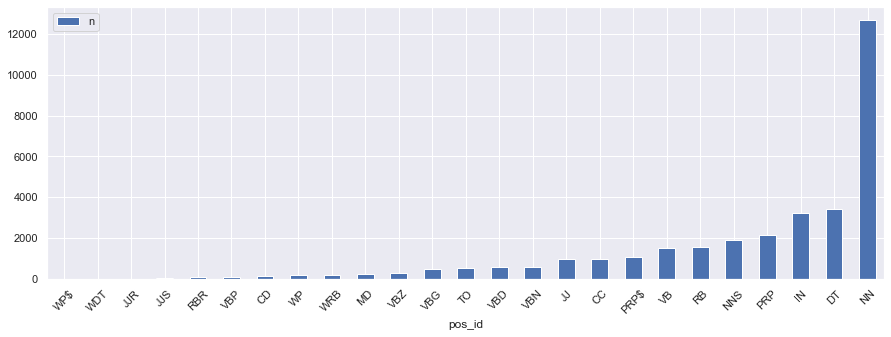

In [219]:
POS.sort_values('n').plot.bar(y='n', figsize=(15,5), rot=45);

## Zipf's Law

Here, we follow Zipf's law, first by adding term rank to our VOCAB dataframe.

In [220]:
if 'term_rank' not in VOCAB.columns:
    VOCAB = VOCAB.sort_values('n', ascending=False).reset_index()
    VOCAB.index.name = 'term_rank'
    VOCAB = VOCAB.reset_index()
    VOCAB = VOCAB.set_index('term_id')
    VOCAB['term_rank'] = VOCAB['term_rank'] + 1

In [221]:
VOCAB_cens = VOCAB.copy()

dummy = [censor_list_alt(x) for x in VOCAB_cens["term_str"].str.split()]
VOCAB_cens["term_str"] = [" ".join(x) for x in dummy]

dummy = [censor_list_alt(x) for x in VOCAB_cens["p_stem"].str.split()]
VOCAB_cens["p_stem"] = [" ".join(x) for x in dummy]

VOCAB_cens.head(10)

,term_rank,term_str,n,stop,p_stem,pos_max
term_id,,,,,,
4274,1,the,1695,1,the,DT
19,2,a,999,1,a,DT
2079,3,i,830,1,i,NN
140,4,and,775,1,and,CC
4815,5,you,669,1,you,PRP
4359,6,to,539,1,to,TO
2113,7,in,473,1,in,IN
2883,8,of,433,1,of,IN
2769,9,my,419,1,my,PRP$


In [222]:
VOCAB['p'] = VOCAB.n / VOCAB.shape[0]

In [223]:
new_rank = VOCAB.n.value_counts()\
    .sort_index(ascending=False).reset_index().reset_index()\
    .rename(columns={'level_0':'term_rank2', 'index':'n', 'n':'nn'})\
    .set_index('n') # If this breaks, drop this section

In [224]:
VOCAB['term_rank2'] = VOCAB.n.map(new_rank.term_rank2) + 1 

## Compute Zipf's K

In [225]:
VOCAB['zipf_k'] = VOCAB.n * VOCAB.term_rank
VOCAB['zipf_k2'] = VOCAB.n * VOCAB.term_rank2 
VOCAB['zipf_k3'] = VOCAB.p * VOCAB.term_rank2

In [226]:
VOCAB.describe().T

,count,mean,std,min,25%,50%,75%,max
term_rank,4839.0,2420.000000,1397.043306,1.000000,1210.500000,2420.000000,3629.500000,4839.000000
n,4839.0,6.817111,41.390889,1.000000,1.000000,2.000000,3.000000,1695.000000
stop,4839.0,0.039471,0.194733,0.000000,0.000000,0.000000,0.000000,1.000000
p,4839.0,0.001409,0.008554,0.000207,0.000207,0.000413,0.000620,0.350279
term_rank2,4839.0,117.221947,12.264867,1.000000,119.000000,120.000000,121.000000,121.000000
zipf_k,4839.0,3785.804918,614.683260,1695.000000,3344.500000,3840.000000,4214.000000,5148.000000
zipf_k2,4839.0,435.399669,734.929566,121.000000,121.000000,240.000000,357.000000,5136.000000
zipf_k3,4839.0,0.089977,0.151876,0.025005,0.025005,0.049597,0.073776,1.061376


In [227]:
VOCAB_cens = VOCAB.copy()

dummy = [censor_list_alt(x) for x in VOCAB_cens["term_str"].str.split()]
VOCAB_cens["term_str"] = [" ".join(x) for x in dummy]

dummy = [censor_list_alt(x) for x in VOCAB_cens["p_stem"].str.split()]
VOCAB_cens["p_stem"] = [" ".join(x) for x in dummy]

### Words with low k

We find that the following are words that, according to Zipf's Law, have a low k value.

In [228]:
VOCAB_cens[VOCAB_cens.zipf_k <= VOCAB_cens.zipf_k.quantile(.8)].sort_values('zipf_k3', ascending=True).head(10)

,term_rank,term_str,n,stop,p_stem,pos_max,p,term_rank2,zipf_k,zipf_k2,zipf_k3
term_id,,,,,,,,,,,
3175,4333,pooper,1,0,pooper,NN,0.000207,121,4333,121,0.025005
3481,3067,revenue,1,0,revenu,NN,0.000207,121,3067,121,0.025005
4443,3068,trigger,1,0,trigger,NN,0.000207,121,3068,121,0.025005
3480,3069,revenge,1,0,reveng,NN,0.000207,121,3069,121,0.025005
3479,3070,reup,1,0,reup,NN,0.000207,121,3070,121,0.025005
3477,3071,retarded,1,0,re***d,VBD,0.000207,121,3071,121,0.025005
3476,3072,retain,1,0,retain,NN,0.000207,121,3072,121,0.025005
3475,3073,resting,1,0,rest,VBG,0.000207,121,3073,121,0.025005
4423,3074,transport,1,0,transport,NN,0.000207,121,3074,121,0.025005


### Words with high k

We find that the following are words that, according to Zipf's Law, have a high k value.

In [229]:
VOCAB_cens[VOCAB_cens.zipf_k >= VOCAB_cens.zipf_k.quantile(.9)].sort_values('zipf_k3', ascending=False).head(10)

,term_rank,term_str,n,stop,p_stem,pos_max,p,term_rank2,zipf_k,zipf_k2,zipf_k3
term_id,,,,,,,,,,,
4307,24,this,214,1,this,DT,0.044224,24,5136,5136,1.061376
1787,22,got,226,1,got,VBD,0.046704,22,4972,4972,1.027485
1720,23,get,215,0,get,VB,0.044431,23,4945,4945,1.021905
3762,31,sh*t,158,0,sh*t,NN,0.032651,31,4898,4898,1.012193
1757,30,go,163,0,go,VB,0.033685,30,4890,4890,1.010539
4287,32,they,152,1,they,PRP,0.031411,32,4864,4864,1.005166
4277,27,them,178,1,them,PRP,0.036784,27,4806,4806,0.993180
2161,21,is,228,1,is,VBZ,0.047117,21,4788,4788,0.989461
4527,28,up,171,1,up,RB,0.035338,28,4788,4788,0.989461


We can visualize the Zipf values per the following:

In [230]:
px.histogram(VOCAB, 'zipf_k', marginal='box')

In [231]:
px.histogram(VOCAB, 'zipf_k2', marginal='box')

In [232]:
px.histogram(VOCAB, 'zipf_k3', marginal='box')

Next, we visualize the distribution of POS per the above Zipf calculation:

In [233]:
VSAMP1 = VOCAB[['n','term_rank','zipf_k','term_str','pos_max']]

In [234]:
dummy = [censor_list_alt(x) for x in VSAMP1["term_str"].str.split()]  ##### ADDED THIS TO CENSOR (!!!!)
VSAMP1["term_str"] = [" ".join(x) for x in dummy]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [235]:
px.scatter((VSAMP1), x='term_rank', y='n', log_y=False, log_x=False, \
           hover_name="term_str", color='pos_max') 
# hover_name=[censor_word(x) for x in VSAMP1["term_str"] ]

In [236]:
px.scatter(VSAMP1, x='term_rank', y='n', log_y=True, log_x=True, \
           hover_name="term_str", color='pos_max')
#  hover_name=[censor_word(x) for x in VSAMP1["term_str"] ]

## Demo Rank Index

In [237]:
rank_index = [1, 2, 3, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000]

In [238]:
demo = VOCAB.loc[VOCAB.term_rank.isin(rank_index), ['term_str', 'term_rank', 'n', 'zipf_k', 'pos_max']]

In [239]:
demo_cens = demo.copy()
dummy = [censor_list_alt(x) for x in demo_cens["term_str"].str.split()]
demo_cens["term_str"] = [" ".join(x) for x in dummy]

demo_cens.style.background_gradient(cmap=gradient_cmap, high=.5)

,term_str,term_rank,n,zipf_k,pos_max
term_id,,,,,
4274,the,1,1695,1695,DT
19,a,2,999,1998,DT
2079,i,3,830,2490,NN
2098,im,10,369,3690,NN
4733,with,20,238,4760,IN
1757,go,30,163,4890,VB
2228,just,40,120,4800,RB
335,been,50,92,4600,VBN
256,back,60,75,4500,RB


# VOCAB Entropy

## Computing the P of VOCAB

In [240]:
VOCAB['p2'] = VOCAB.n / VOCAB.n.sum()

In [241]:
VOCAB['p2']

term_id
4274    0.051382
19      0.030284
2079    0.025161
140     0.023493
4815    0.020280
          ...   
2104    0.000030
2105    0.000030
2106    0.000030
2107    0.000030
2419    0.000030
Name: p2, Length: 4839, dtype: float64

## Computing the Entropy of VOCAB


In [242]:
VOCAB['h'] = VOCAB.p2 * np.log2(1/VOCAB.p2) # Self entropy of each word 
H = VOCAB.h.sum()
N_v = VOCAB.shape[0]
H_max = np.log2(N_v)
R = round(1 - (H/H_max), 2) * 100

In [243]:
print("H \t= {}\nH_max \t= {}\nR \t= {}%".format(H, H_max, int(R)))

H 	= 9.41860948010675
H_max 	= 12.240493223876799
R 	= 23%


# Bag of Words

We'll first approach this by defining our bag at the Song Title level, then we'll look at the Album level.

In [244]:
TOKEN['term_id']

Album_num  Track_num  Lyric_num
1          0          1            3591
                      1            3591
                      1            3591
                      1            3591
                      1            3591
                                   ... 
5          8          72           2113
                      72           2465
                      72             78
                      72           2465
                      72             78
Name: term_id, Length: 32988, dtype: int64

In [245]:
bag_1

['Title']

In [246]:
BOW_1 = TOKEN.groupby(bag_1+['term_id']).term_id.count()\
    .to_frame().rename(columns={'term_id':'n'})

In [247]:
BOW_1['n'] = BOW_1.n#.astype('bool').astype('int')

In [248]:
BOW_1.sample(10)

,,n
Title,term_id,
Jeopardy,2498,1
Sea Legs,4593,2
out of sight,3630,1
Thieves! (Screamed the Ghost),1720,4
Panther Like a Panther (Miracle Mix),1572,1
Job Well Done,507,1
walking in the snow,1609,1
never look back,3982,1
walking in the snow,68,1


In [249]:
bag_2
BOW_2 = TOKEN.groupby(bag_2+['term_id']).term_id.count()\
    .to_frame().rename(columns={'term_id':'n'})
BOW_2['n'] = BOW_2.n#.astype('bool').astype('int')
BOW_2.sample(10)

n
Album            term_id     
Run the Jewels 3 1721       2
Run the Jewels 2 643        1
RTJ4             959        1
Run the Jewels   2885       1
Run the Jewels 2 1546       1
Meow the Jewels  282        3
Run the Jewels 2 3635      16
Run the Jewels 3 1572       1
                 19       278
RTJ4             934        1

# Document-Term Matrix

Here, we'll create a matrix consisting of documents vs. terms, by count.  We'll first do this for the song title bag, then the album title bag.

In [250]:
DTCM_1 = BOW_1[count_method].unstack().fillna(0).astype('int')

In [251]:
DTCM_1.sample(6)

term_id,0,1,2,3,4,5,6,7,8,9,...,4829,4830,4831,4832,4833,4834,4835,4836,4837,4838
Title,,,,,,,,,,,,,,,,,,,,,
"Blockbuster Night, Pt. 2",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Thieves! (Screamed the Ghost),0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Banana Clipper,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
walking in the snow,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
yankee and the brave (ep. 4),0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
goonies vs. E.T.,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [252]:
DTCM_2 = BOW_2[count_method].unstack().fillna(0).astype('int')

In [253]:
DTCM_2

term_id,0,1,2,3,4,5,6,7,8,9,...,4829,4830,4831,4832,4833,4834,4835,4836,4837,4838
Album,,,,,,,,,,,,,,,,,,,,,
Meow the Jewels,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,1
RTJ4,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,1,1,0
Run the Jewels,1,1,0,0,0,0,0,3,2,1,...,1,0,1,1,1,1,0,0,0,0
Run the Jewels 2,0,0,2,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,1
Run the Jewels 3,0,2,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


## Compute TF

We code this for the various TF methods.  The method implemented will be based on the prior user input!

In [254]:
print('TF method:', tf_method)

if tf_method == 'sum':
    TF_1 = DTCM_1.T / DTCM_1.T.sum()
    TF_2 = DTCM_2.T / DTCM_2.T.sum()

elif tf_method == 'max':
    TF_1 = DTCM_1.T / DTCM_1.T.max()
    TF_2 = DTCM_2.T / DTCM_2.T.max()

elif tf_method == 'log':
    TF_1 = np.log10(1 + DTCM_1.T)
    TF_2 = np.log10(1 + DTCM_2.T)
    
elif tf_method == 'raw':
    TF_1 = DTCM_1.T
    TF_2 = DTCM_2.T

elif tf_method == 'double_norm':
    TF_1 = DTCM.T / DTCM.T.max()
    TF_1 = tf_norm_k + (1 - tf_norm_k) * TF_1[TF_1 > 0] # EXPLAIN; may defeat purpose of norming
    TF_2 = DTCM.T / DTCM.T.max()
    TF_2 = tf_norm_k + (1 - tf_norm_k) * TF_2[TF_2 > 0]

elif tf_method == 'binary':
    TF_1 = DTCM_1.T.astype('bool').astype('int')
    TF_2 = DTCM_2.T.astype('bool').astype('int')
    
TF_1 = TF_1.T
TF_2 = TF_2.T

TF method: sum


In [255]:
TF_1.sample(6)

term_id,0,1,2,3,4,5,6,7,8,9,...,4829,4830,4831,4832,4833,4834,4835,4836,4837,4838
Title,,,,,,,,,,,,,,,,,,,,,
Talk to Me,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Pew Pew Pew,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.001754,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
pulling the pin,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Jeopardy,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
All My Life,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
All Due Respect,0.0,0.0,0.0,0.0,0.0,0.0,0.001553,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [256]:
TF_2

term_id,0,1,2,3,4,5,6,7,8,9,...,4829,4830,4831,4832,4833,4834,4835,4836,4837,4838
Album,,,,,,,,,,,,,,,,,,,,,
Meow the Jewels,0.000000,0.000000,0.000191,0.000000,0.000000,0.000000,0.000191,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000191,0.000000,0.000000,0.000000,0.000000,0.000191
RTJ4,0.000000,0.000000,0.000000,0.000149,0.000149,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000149,0.000000,0.000000,0.000000,0.000000,0.000149,0.000149,0.000149,0.000000
Run the Jewels,0.000175,0.000175,0.000000,0.000000,0.000000,0.000000,0.000000,0.000525,0.00035,0.000175,...,0.000175,0.000000,0.000175,0.000175,0.000175,0.000175,0.000000,0.000000,0.000000,0.000000
Run the Jewels 2,0.000000,0.000000,0.000292,0.000000,0.000000,0.000000,0.000146,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000146,0.000000,0.000000,0.000000,0.000000,0.000146
Run the Jewels 3,0.000000,0.000235,0.000000,0.000000,0.000000,0.000118,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000118,0.000000,0.000000,0.000000,0.000000,0.000000


## Compute DF

DF is calculated per the following:

In [257]:
DF_1 = DTCM_1[DTCM_1 > 0].count()
DF_2 = DTCM_2[DTCM_2 > 0].count()

In [258]:
DF_1.head()

term_id
0    1
1    3
2    3
3    1
4    1
dtype: int64

In [259]:
DF_2.head()

term_id
0    1
1    2
2    2
3    1
4    1
dtype: int64

## Compute IDF

In [260]:
N_1 = DTCM_1.shape[0]
N_2 = DTCM_2.shape[0]

In [261]:
print('IDF method:', idf_method)

if idf_method == 'standard':
    IDF_1 = np.log10(N_1 / DF_1)
    IDF_2 = np.log10(N_2 / DF_2)

elif idf_method == 'max':
    IDF_1 = np.log10(DF_1.max() / DF_1) 
    IDF_2 = np.log10(DF_2.max() / DF_2)

elif idf_method == 'smooth':
    IDF_1 = np.log10((1 + N_1) / (1 + DF_1)) + 1
    IDF_2 = np.log10((1 + N_2) / (1 + DF_2)) + 1

IDF method: standard


## Compute TFIDF

Here, we'll calculate TFIDF for both cases per the following.  Upon completion, each TFIDF table will be saved to a .csv file as <b>TFIDF_1.csv</b> and <b>TFIDF_2.csv</b> respectively.

In [262]:
TFIDF_1 = TF_1 * IDF_1
TFIDF_2 = TF_2 * IDF_2

In [263]:
TFIDF_1.sample(6)

term_id,0,1,2,3,4,5,6,7,8,9,...,4829,4830,4831,4832,4833,4834,4835,4836,4837,4838
Title,,,,,,,,,,,,,,,,,,,,,
Angel Duster,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
Oh My Darling Don't Cry,0.0,0.0,0.00203,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.001831,0.0,0.0,0.0,0.0,0.0
A Report to the Shareholders / Kill Your Masters,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
Paw Due Respect,0.0,0.0,0.00000,0.0,0.0,0.0,0.002317,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
Job Well Done,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
never look back,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0


In [264]:
TFIDF_2

term_id,0,1,2,3,4,5,6,7,8,9,...,4829,4830,4831,4832,4833,4834,4835,4836,4837,4838
Album,,,,,,,,,,,,,,,,,,,,,
Meow the Jewels,0.000000,0.000000,0.000076,0.000000,0.000000,0.000000,0.000076,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000018,0.000000,0.000000,0.000000,0.000000,0.000076
RTJ4,0.000000,0.000000,0.000000,0.000104,0.000104,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000104,0.000000,0.000000,0.000000,0.000000,0.000104,0.000104,0.000104,0.000000
Run the Jewels,0.000122,0.000070,0.000000,0.000000,0.000000,0.000000,0.000000,0.000367,0.000245,0.000122,...,0.000122,0.000000,0.000122,0.000122,0.000017,0.000122,0.000000,0.000000,0.000000,0.000000
Run the Jewels 2,0.000000,0.000000,0.000116,0.000000,0.000000,0.000000,0.000058,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000014,0.000000,0.000000,0.000000,0.000000,0.000058
Run the Jewels 3,0.000000,0.000094,0.000000,0.000000,0.000000,0.000082,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000011,0.000000,0.000000,0.000000,0.000000,0.000000


In [265]:
VOCAB['df_1'] = DF_1
VOCAB['idf_1'] = IDF_1

VOCAB['df_2'] = DF_2
VOCAB['idf_2'] = IDF_2

In [266]:
VOCAB.head()

,term_rank,term_str,n,stop,p_stem,pos_max,p,term_rank2,zipf_k,zipf_k2,zipf_k3,p2,h,df_1,idf_1,df_2,idf_2
term_id,,,,,,,,,,,,,,,,,
4274,1,the,1695,1,the,DT,0.350279,1,1695,1695,0.350279,0.051382,0.220049,57,0.0,5,0.0
19,2,a,999,1,a,DT,0.206448,2,1998,1998,0.412895,0.030284,0.152791,57,0.0,5,0.0
2079,3,i,830,1,i,NN,0.171523,3,2490,2490,0.514569,0.025161,0.133671,57,0.0,5,0.0
140,4,and,775,1,and,CC,0.160157,4,3100,3100,0.640628,0.023493,0.127137,57,0.0,5,0.0
4815,5,you,669,1,you,PRP,0.138252,5,3345,3345,0.691259,0.020280,0.114051,57,0.0,5,0.0


In [267]:
BOW_1['tf'] = TF_1.stack()
BOW_1['tfidf'] = TFIDF_1.stack()

In [268]:
BOW_2['tf'] = TF_2.stack()
BOW_2['tfidf'] = TFIDF_2.stack()

In [269]:
BOW_1.head()

n        tf     tfidf
Title term_id                        
2100  19       21  0.033816  0.000000
      33        1  0.001610  0.002827
      94        4  0.006441  0.000724
      95        1  0.001610  0.001217
      106       1  0.001610  0.001702

In [270]:
BOW_2.head()

n        tf     tfidf
Album           term_id                         
Meow the Jewels 2          1  0.000191  0.000076
                6          1  0.000191  0.000076
                11         1  0.000191  0.000076
                19       150  0.028610  0.000000
                25         4  0.000763  0.000000

In [271]:
VOCAB['tfidf_sum_1'] = TFIDF_1.sum()
VOCAB['tfidf_sum_2'] = TFIDF_2.sum()

### Bag → Title Level

In [272]:
VOCAB_cens = VOCAB.copy()

dummy = [censor_list_alt(x) for x in VOCAB_cens["term_str"].str.split()]
VOCAB_cens["term_str"] = [" ".join(x) for x in dummy]

dummy = [censor_list_alt(x) for x in VOCAB_cens["p_stem"].str.split()]
VOCAB_cens["p_stem"] = [" ".join(x) for x in dummy]


VOCAB_cens.sort_values('tfidf_sum_1', ascending=False).head(45).style.background_gradient(cmap=gradient_cmap, high=1)

,term_rank,term_str,n,stop,p_stem,pos_max,p,term_rank2,zipf_k,zipf_k2,zipf_k3,p2,h,df_1,idf_1,df_2,idf_2,tfidf_sum_1,tfidf_sum_2
term_id,,,,,,,,,,,,,,,,,,,
2945,113,oui,44,1,oui,NN,0.009093,80,4972,3520,0.727423,0.001334,0.012738,1,1.755875,1,0.698970,0.150016,0.004598
2295,85,la,57,1,la,NN,0.011779,69,4845,3933,0.812771,0.001728,0.015857,6,0.977724,4,0.096910,0.105216,0.000830
1960,70,hey,66,1,hey,NN,0.013639,61,4620,4026,0.831990,0.002001,0.017937,14,0.609747,5,0.000000,0.095330,0.000000
1773,75,gold,63,0,gold,NN,0.013019,64,4725,4032,0.833230,0.001910,0.017250,5,1.056905,4,0.096910,0.095124,0.000732
4277,27,them,178,1,them,PRP,0.036784,27,4806,4806,0.993180,0.005396,0.040652,27,0.324511,5,0.000000,0.081528,0.000000
2609,175,meow,26,0,meow,NN,0.005373,96,4550,2496,0.515809,0.000788,0.008125,1,1.755875,1,0.698970,0.071556,0.003466
497,116,brave,44,0,brave,NN,0.009093,80,5104,3520,0.727423,0.001334,0.012738,4,1.153815,3,0.221849,0.071316,0.001458
89,164,ah,29,1,ah,NN,0.005993,93,4756,2697,0.557347,0.000879,0.008924,4,1.153815,3,0.221849,0.062806,0.000969
1702,172,garden,26,0,garden,NN,0.005373,96,4472,2496,0.515809,0.000788,0.008125,1,1.755875,1,0.698970,0.062452,0.002139


In [273]:
VOCAB_cens = VOCAB.copy()
dummy = [censor_list_alt(x) for x in VOCAB_cens["term_str"].str.split()]
VOCAB_cens["term_str"] = [" ".join(x) for x in dummy]
VOCAB_cens[['term_rank','term_str','pos_max','tfidf_sum_1']]\
    .sort_values('tfidf_sum_1', ascending=False).head(50)\
    .style.background_gradient(cmap=gradient_cmap, high=1)

,term_rank,term_str,pos_max,tfidf_sum_1
term_id,,,,
2945,113,oui,NN,0.150016
2295,85,la,NN,0.105216
1960,70,hey,NN,0.095330
1773,75,gold,NN,0.095124
4277,27,them,PRP,0.081528
2609,175,meow,NN,0.071556
497,116,brave,NN,0.071316
89,164,ah,NN,0.062806
1702,172,garden,NN,0.062452


In [274]:
VOCAB_cens.loc[VOCAB_cens.pos_max != 'NNP', ['term_rank','term_str','pos_max','tfidf_sum_1']]\
    .sort_values('tfidf_sum_1', ascending=False)\
    .head(50).style.background_gradient(cmap=gradient_cmap, high=1)

,term_rank,term_str,pos_max,tfidf_sum_1
term_id,,,,
2945,113,oui,NN,0.150016
2295,85,la,NN,0.105216
1960,70,hey,NN,0.095330
1773,75,gold,NN,0.095124
4277,27,them,PRP,0.081528
2609,175,meow,NN,0.071556
497,116,brave,NN,0.071316
89,164,ah,NN,0.062806
1702,172,garden,NN,0.062452


In [275]:
BOW_1 = BOW_1.join(VOCAB[['term_str','pos_max']], on='term_id')

In [276]:
print("Count method: " + count_method)
print("TF method: " + tf_method)
print("IDF method:" + idf_method)
print("OHCO level:" + str(bag_1))

Count method: n
TF method: sum
IDF method:standard
OHCO level:['Title']


In [277]:
bow_1 = BOW_1.sort_values('tfidf', ascending=False).head(20)

In [278]:
bow_1_cens = bow_1.copy()

dummy = [censor_list_alt(x) for x in bow_1_cens["term_str"].str.split()]
bow_1_cens["term_str"] = [" ".join(x) for x in dummy]

bow_1_cens.style.background_gradient(cmap=gradient_cmap, high=1)

### Bag → Album Level

In [279]:
VOCAB_cens.sort_values('tfidf_sum_2', ascending=False).head(20).style.background_gradient(cmap=gradient_cmap, high=1)

,term_rank,term_str,n,stop,p_stem,pos_max,p,term_rank2,zipf_k,zipf_k2,zipf_k3,p2,h,df_1,idf_1,df_2,idf_2,tfidf_sum_1,tfidf_sum_2
term_id,,,,,,,,,,,,,,,,,,,
2945,113,oui,44,1,oui,NN,0.009093,80,4972,3520,0.727423,0.001334,0.012738,1,1.755875,1,0.698970,0.150016,0.004598
2609,175,meow,26,0,meow,NN,0.005373,96,4550,2496,0.515809,0.000788,0.008125,1,1.755875,1,0.698970,0.071556,0.003466
250,118,ayy,43,1,ayi,NN,0.008886,81,5074,3483,0.719777,0.001304,0.012492,11,0.714482,2,0.397940,0.052925,0.002568
1702,172,garden,26,0,garden,NN,0.005373,96,4472,2496,0.515809,0.000788,0.008125,1,1.755875,1,0.698970,0.062452,0.002139
2910,145,ooh,34,1,ooh,NN,0.007026,88,4930,2992,0.618310,0.001031,0.010227,6,0.977724,2,0.397940,0.061200,0.001985
246,170,ay,26,1,ay,NN,0.005373,96,4420,2496,0.515809,0.000788,0.008125,3,1.278754,2,0.397940,0.059065,0.001787
497,116,brave,44,0,brave,NN,0.009093,80,5104,3520,0.727423,0.001334,0.012738,4,1.153815,3,0.221849,0.071316,0.001458
1470,144,fast,34,0,fast,NN,0.007026,88,4896,2992,0.618310,0.001031,0.010227,6,0.977724,3,0.221849,0.043777,0.001263
827,197,cold,22,0,cold,NN,0.004546,100,4334,2200,0.454639,0.000667,0.007036,6,0.977724,2,0.397940,0.028984,0.001258


In [280]:
VOCAB_cens[['term_rank','term_str','pos_max','tfidf_sum_2']]\
    .sort_values('tfidf_sum_2', ascending=False).head(50)\
    .style.background_gradient(cmap=gradient_cmap, high=1)

,term_rank,term_str,pos_max,tfidf_sum_2
term_id,,,,
2945,113,oui,NN,0.004598
2609,175,meow,NN,0.003466
250,118,ayy,NN,0.002568
1702,172,garden,NN,0.002139
2910,145,ooh,NN,0.001985
246,170,ay,NN,0.001787
497,116,brave,NN,0.001458
1470,144,fast,NN,0.001263
827,197,cold,NN,0.001258


In [281]:
VOCAB_cens.loc[VOCAB.pos_max != 'NNP', ['term_rank','term_str','pos_max','tfidf_sum_2']]\
    .sort_values('tfidf_sum_2', ascending=False)\
    .head(50).style.background_gradient(cmap=gradient_cmap, high=1)

,term_rank,term_str,pos_max,tfidf_sum_2
term_id,,,,
2945,113,oui,NN,0.004598
2609,175,meow,NN,0.003466
250,118,ayy,NN,0.002568
1702,172,garden,NN,0.002139
2910,145,ooh,NN,0.001985
246,170,ay,NN,0.001787
497,116,brave,NN,0.001458
1470,144,fast,NN,0.001263
827,197,cold,NN,0.001258


In [282]:
BOW_2 = BOW_2.join(VOCAB[['term_str','pos_max']], on='term_id')

In [283]:
print("Count method: " + count_method)
print("TF method: " + tf_method)
print("IDF method:" + idf_method)
print("OHCO level:" + str(bag_2))

Count method: n
TF method: sum
IDF method:standard
OHCO level:['Album']


In [284]:
bow_2 = BOW_2.sort_values('tfidf', ascending=False).head(20)

In [285]:
bow_2_cens = bow_2.copy()

dummy = [censor_list_alt(x) for x in bow_2_cens["term_str"].str.split()]
bow_2_cens["term_str"] = [" ".join(x) for x in dummy]

bow_2_cens.style.background_gradient(cmap=gradient_cmap, high=1)

,,n,tf,tfidf,term_str,pos_max
Album,term_id,,,,,
RTJ4,2945,44,0.006578,0.004598,oui,NN
Meow the Jewels,2609,26,0.004959,0.003466,meow,NN
RTJ4,250,42,0.006279,0.002499,ayy,NN
Run the Jewels 3,1702,26,0.003061,0.002139,garden,NN
RTJ4,2910,31,0.004634,0.001844,ooh,NN
Run the Jewels,246,25,0.004374,0.001740,ay,NN
RTJ4,497,42,0.006279,0.001393,brave,NN
Run the Jewels 3,651,15,0.001766,0.001234,captured,VBN
Run the Jewels,3677,9,0.001575,0.001101,sea,NN


Here, we compare the top 20 words using Title and Album as the respective bags:

In [286]:
bow_1_cens["term_str"]

Title                                             term_id
ooh la la                                         2945            oui
                                                  2295             la
Stay Gold                                         1773           gold
DDFH                                              1960            hey
Meowpurrdy                                        2609           meow
Call Ticketron                                    1702         garden
a few words for the firing squad (radiation)      497           brave
ooh la la                                         89               ah
Don't Get Captured                                651        captured
Run the Jewels                                    246              ay
ooh la la                                         2910            ooh
Crown                                             969           crown
                                                  1994        holding
                                

In [287]:
bow_2_cens["term_str"]

Album             term_id
RTJ4              2945              oui
Meow the Jewels   2609             meow
RTJ4              250               ayy
Run the Jewels 3  1702           garden
RTJ4              2910              ooh
Run the Jewels    246                ay
RTJ4              497             brave
Run the Jewels 3  651          captured
Run the Jewels    3677              sea
                  2361             legs
RTJ4              827              cold
                  4496               uh
                  89                 ah
Run the Jewels 2  969             crown
RTJ4              2295               la
Run the Jewels 3  979            crying
RTJ4              2894               ol
                  709        charlatans
Run the Jewels 3  1773             gold
Meow the Jewels   1470             fast
Name: term_str, dtype: object

We observe some common words in each of these lists, but recognize that these two lists are not identical.  It is expected that this would be the case, as certain lyrics or themes may occur throughout an album more than within a single song (such as "cheat" and "steal").  Likewise, if a lyric occurred excessively frequently as a lyric on a song, given that the song is a subset of the album then such a lyric would also appear excessively frequently on the album as a whole.

This is observed, for example, in the gross repetition of the word "oui" on the *RTJ4* track "ooh la la".  As a result, this word tops both the respective lists seen above.

In [288]:
print("(Song) Title level bag part of speech:  " + bow_1["pos_max"])

Title                                             term_id
ooh la la                                         2945        (Song) Title level bag part of speech:  NN
                                                  2295        (Song) Title level bag part of speech:  NN
Stay Gold                                         1773        (Song) Title level bag part of speech:  NN
DDFH                                              1960        (Song) Title level bag part of speech:  NN
Meowpurrdy                                        2609        (Song) Title level bag part of speech:  NN
Call Ticketron                                    1702        (Song) Title level bag part of speech:  NN
a few words for the firing squad (radiation)      497         (Song) Title level bag part of speech:  NN
ooh la la                                         89          (Song) Title level bag part of speech:  NN
Don't Get Captured                                651        (Song) Title level bag part of speech:  V

In [289]:
print("Album level bag part of speech:  " + bow_2["pos_max"])

Album             term_id
RTJ4              2945        Album level bag part of speech:  NN
Meow the Jewels   2609        Album level bag part of speech:  NN
RTJ4              250         Album level bag part of speech:  NN
Run the Jewels 3  1702        Album level bag part of speech:  NN
RTJ4              2910        Album level bag part of speech:  NN
Run the Jewels    246         Album level bag part of speech:  NN
RTJ4              497         Album level bag part of speech:  NN
Run the Jewels 3  651        Album level bag part of speech:  VBN
Run the Jewels    3677        Album level bag part of speech:  NN
                  2361       Album level bag part of speech:  NNS
RTJ4              827         Album level bag part of speech:  NN
                  4496        Album level bag part of speech:  NN
                  89          Album level bag part of speech:  NN
Run the Jewels 2  969         Album level bag part of speech:  NN
RTJ4              2295        Album level bag part

We observe that the nltk classification for the part of speech that occurs most frequently on both lists is the common noun, NN.

In [290]:
OHCO_1 = ["Title"]
OHCO_2 = ["Album"]

In [291]:
DOC_1 = TFIDF_1.reset_index()[OHCO_1]

In [292]:
DOC_2 = TFIDF_2.reset_index()[OHCO_2]

In [293]:
DOC_1.head(15)

term_id,Title
0,2100
1,"36"" Chain"
2,A Christmas Fu****g Miracle
3,A Report to the Shareholders / Kill Your Masters
4,All Due Respect
5,All Meow Life
6,All My Life
7,Angel Duster
8,Banana Clipper
9,"Blockbuster Night, Pt. 1"


In [294]:
DOC_1["Album"] = ""

In [295]:
for i in range(len(DOC_1)):
    if DOC_1["Title"][i] in song_titles_1:
        DOC_1["Album"][i] = album_1
    elif DOC_1["Title"][i] in song_titles_2:
        DOC_1["Album"][i] = album_2
    elif DOC_1["Title"][i] in song_titles_3:
        DOC_1["Album"][i] = album_3
    elif DOC_1["Title"][i] in song_titles_4:
        DOC_1["Album"][i] = album_4        
    elif DOC_1["Title"][i] == "A Christmas Fu****g Miracle":
        DOC_1["Album"][i] = album_1
    elif DOC_1["Title"][i] == "Close Your Eyes (And Count to F*ck)":
        DOC_1["Album"][i] = album_2
    elif DOC_1["Title"][i] == "holy calamaf*ck":
        DOC_1["Album"][i] = album_4    
    else:
        DOC_1["Album"][i] = album_5

In [296]:
DOC_1['Title_Album'] = DOC_1['Title'] + ' / Album: ' + DOC_1['Album'].astype(str)

In [297]:
DOC_1 = DOC_1.drop(['Album'], axis=1)

In [298]:
DOC_1.index.name = 'doc_id'
DOC_2.index.name = 'doc_id'

## Create Normalized Tables

### Bag → Title

In [299]:
L0_1 = TFIDF_1.astype('bool').astype('int')

In [300]:
L1_1 = TFIDF_1.apply(lambda x: x / x.sum(), 1)

In [301]:
L2_1 = TFIDF_1.apply(lambda x: x / norm(x), 1)

In [302]:
PAIRS_1 = pd.DataFrame(index=pd.MultiIndex.from_product([DOC_1.index.tolist(), DOC_1.index.tolist()])).reset_index()
PAIRS_1 = PAIRS_1[PAIRS_1.level_0 < PAIRS_1.level_1].set_index(['level_0','level_1'])
PAIRS_1.index.names = ['doc_a', 'doc_b']

In [303]:
PAIRS_1

Empty DataFrame
Columns: []
Index: [(0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 9), (0, 10), (0, 11), (0, 12), (0, 13), (0, 14), (0, 15), (0, 16), (0, 17), (0, 18), (0, 19), (0, 20), (0, 21), (0, 22), (0, 23), (0, 24), (0, 25), (0, 26), (0, 27), (0, 28), (0, 29), (0, 30), (0, 31), (0, 32), (0, 33), (0, 34), (0, 35), (0, 36), (0, 37), (0, 38), (0, 39), (0, 40), (0, 41), (0, 42), (0, 43), (0, 44), (0, 45), (0, 46), (0, 47), (0, 48), (0, 49), (0, 50), (0, 51), (0, 52), (0, 53), (0, 54), (0, 55), (0, 56), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (1, 10), (1, 11), (1, 12), (1, 13), (1, 14), (1, 15), (1, 16), (1, 17), (1, 18), (1, 19), (1, 20), (1, 21), (1, 22), (1, 23), (1, 24), (1, 25), (1, 26), (1, 27), (1, 28), (1, 29), (1, 30), (1, 31), (1, 32), (1, 33), (1, 34), (1, 35), (1, 36), (1, 37), (1, 38), (1, 39), (1, 40), (1, 41), (1, 42), (1, 43), (1, 44), (1, 45), ...]

[1596 rows x 0 columns]

In [304]:
PAIRS_1['cityblock'] = pdist(TFIDF_1, 'cityblock')

In [305]:
PAIRS_1['euclidean'] = pdist(TFIDF_1, 'euclidean')

In [306]:
PAIRS_1['cosine'] = pdist(TFIDF_1, 'cosine')

In [307]:
PAIRS_1['jaccard'] = pdist(L0_1, 'jaccard')

In [308]:
PAIRS_1['dice'] = pdist(L0_1, 'dice')

In [309]:
PAIRS_1['euclidean2'] = pdist(L2_1, 'euclidean')

In [310]:
PAIRS_1['sokalsneath'] = pdist(L0_1, 'sokalsneath')

In [311]:
PAIRS_1

cityblock  euclidean    cosine   jaccard      dice  euclidean2  \
doc_a doc_b                                                                   
0     1       1.014855   0.057643  0.946889  0.854737  0.746324    1.376146   
      2       0.976253   0.053446  0.909783  0.845679  0.732620    1.348913   
      3       0.904697   0.056141  0.934244  0.825480  0.702823    1.366927   
      4       0.934576   0.050697  0.950026  0.862857  0.758794    1.378424   
      5       0.846222   0.062056  0.966035  0.879679  0.785203    1.389989   
...                ...        ...       ...       ...       ...         ...   
53    55      1.103965   0.060775  0.945118  0.838435  0.721816    1.374858   
      56      1.142248   0.066672  0.973764  0.855670  0.747748    1.395539   
54    55      1.029982   0.063723  0.960047  0.862136  0.757679    1.385675   
      56      1.042049   0.067937  0.944767  0.866337  0.764192    1.374603   
55    56      1.038132   0.061546  0.947083  0.841155  0.725857    1.376287   

             sokalsneath  
doc_a doc_b               
0     1         0.921680  
      2         0.916388  
      3         0.904398  
      4         0.926380  
      5         0.935989  
...                  ...  
53    55        0.912118  
      56        0.922222  
54    55        0.925965  
      56        0.928382  
55    56        0.913725  

[1596 rows x 7 columns]

In [312]:
if PAIRS_1.shape[0] > 1000:
    SAMPLE_1 = PAIRS_1.sample(1000)
else:
    SAMPLE_1 = PAIRS_1

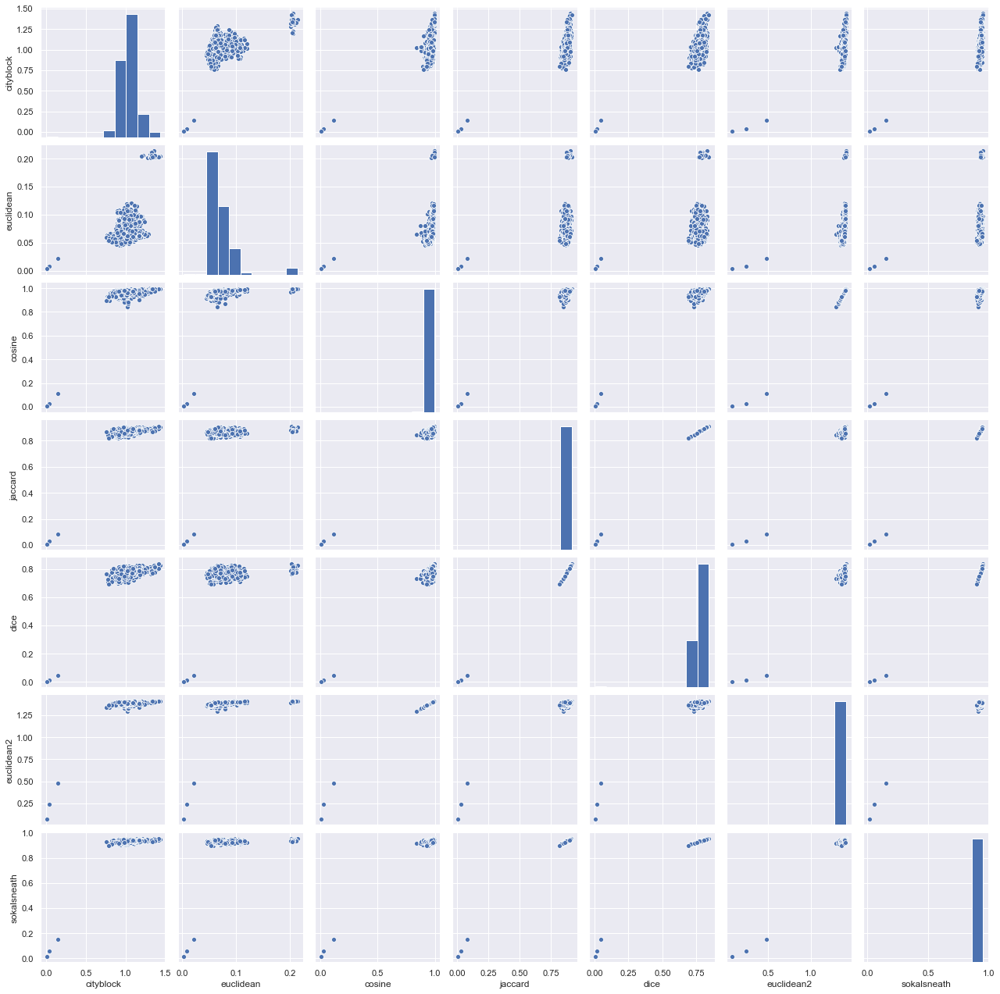

In [313]:
sns.pairplot(SAMPLE_1)

In [314]:
PAIRS_1.sort_values('cosine').head(20).style.background_gradient('YlGn')

,,cityblock,euclidean,cosine,jaccard,dice,euclidean2,sokalsneath
doc_a,doc_b,,,,,,,
12,13,0.006750,0.003408,0.002799,0.008333,0.004184,0.074820,0.016529
5,6,0.051227,0.010279,0.020071,0.012739,0.006410,0.200355,0.025157
18,30,0.017382,0.011240,0.024946,0.000000,0.000000,0.223367,0.000000
4,36,0.041099,0.008458,0.027831,0.029674,0.015060,0.235927,0.057637
26,27,0.118820,0.021273,0.079587,0.074205,0.038532,0.398966,0.138158
33,34,0.136205,0.013504,0.084073,0.127536,0.068111,0.410057,0.226221
9,37,0.114685,0.020984,0.099223,0.101961,0.053719,0.445472,0.185053
28,41,0.145275,0.021403,0.113348,0.083650,0.043651,0.476127,0.154386
23,29,0.238031,0.073711,0.627393,0.095082,0.049914,1.120172,0.173653


In [315]:
def hca_1(sims, linkage_method='ward', color_thresh=.3, figsize=(10, 10)):
    tree = sch.linkage(sims, method=linkage_method)
    labels_hca_1 = DOC_1.Title_Album.values # was DOC.title.values
    plt.figure()
    fig, axes = plt.subplots(figsize=figsize)
    dendrogram = sch.dendrogram(tree, 
                                labels=labels_hca_1, 
                                orientation="left", 
                                count_sort=True,
                                distance_sort=True,
                                above_threshold_color='.75',
                                color_threshold=color_thresh
                               )
    plt.tick_params(axis='both', which='major', labelsize=14) # comment out labels line if breaks

<Figure size 432x288 with 0 Axes>

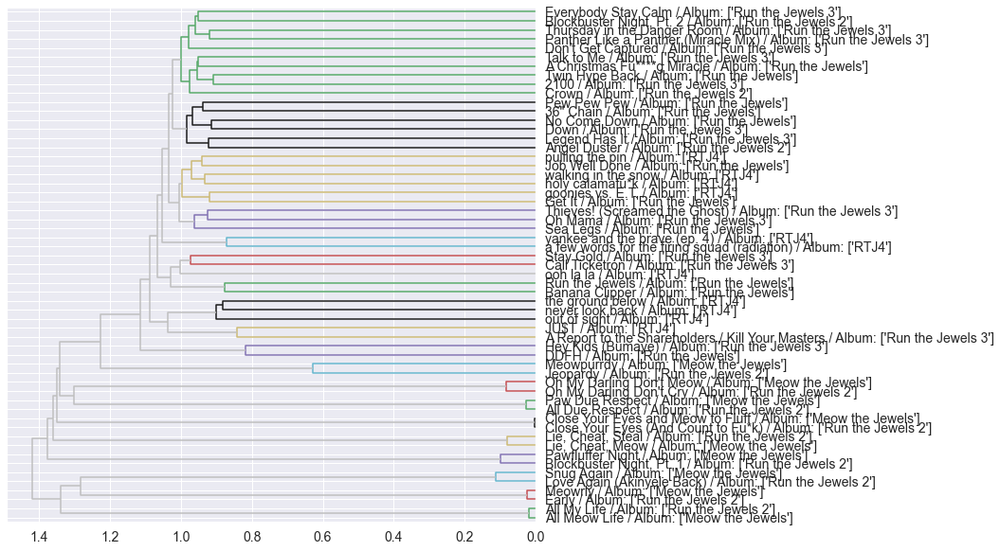

In [316]:
hca_1(PAIRS_1.cosine, color_thresh=1)

<Figure size 432x288 with 0 Axes>

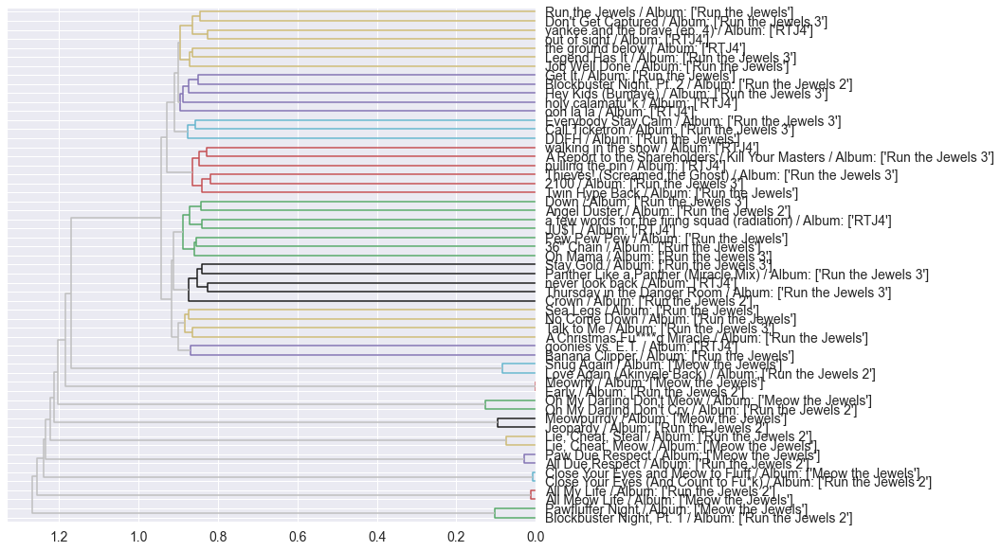

In [317]:
hca_1(PAIRS_1.jaccard, color_thresh=.9)

<Figure size 432x288 with 0 Axes>

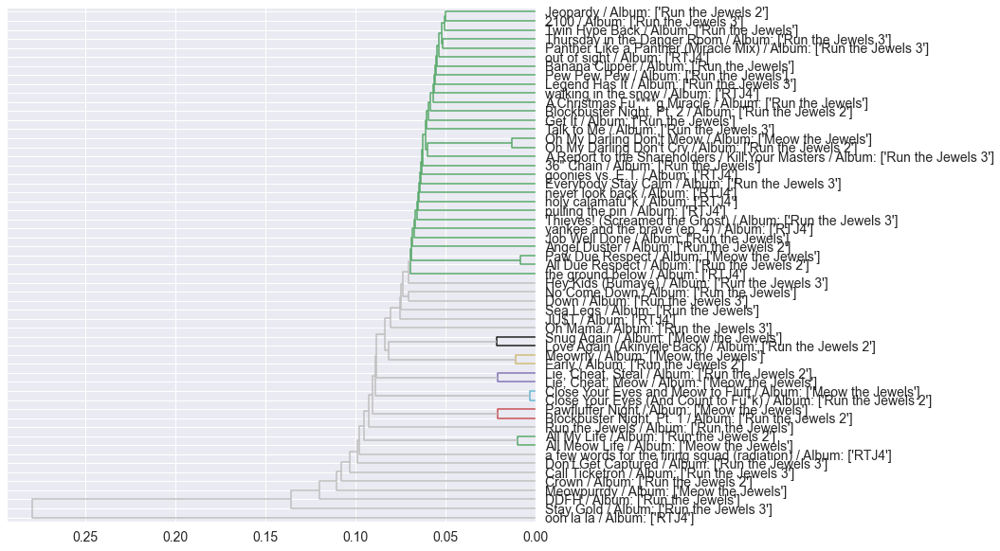

In [318]:
hca_1(PAIRS_1.euclidean, color_thresh=.07)

<Figure size 432x288 with 0 Axes>

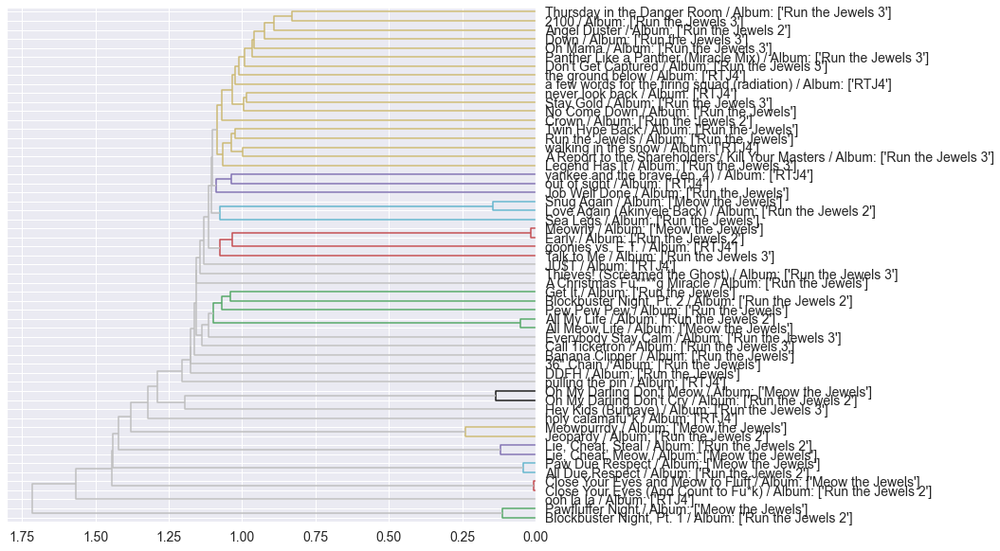

In [319]:
hca_1(PAIRS_1.cityblock, color_thresh=1.1)

In [320]:
#hca_1(PAIRS_1.js, color_thresh=.8)

<Figure size 432x288 with 0 Axes>

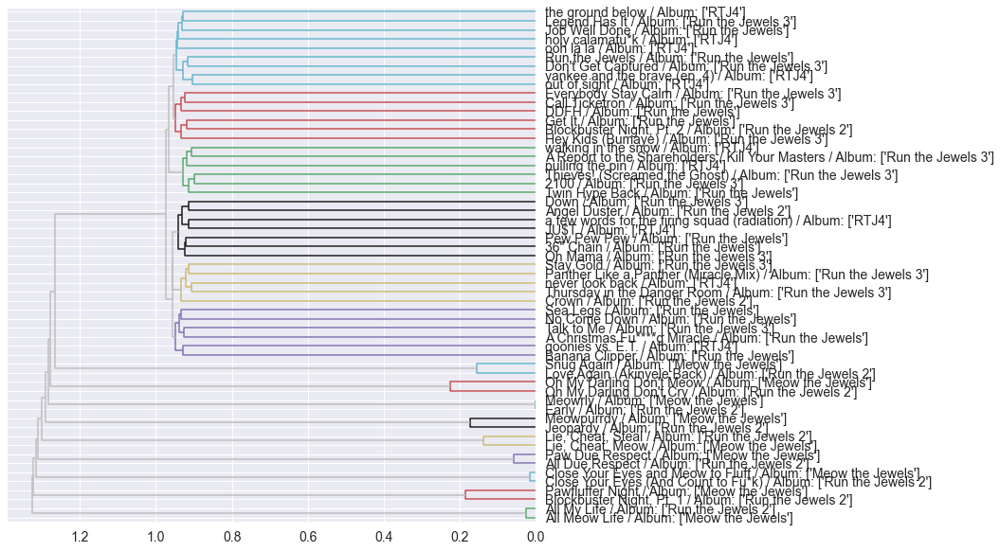

In [321]:
hca_1(PAIRS_1.sokalsneath, color_thresh = .95)

In [322]:
n_clusters = 10

In [323]:
DOC_1['y_raw'] = KMeans(n_clusters).fit_predict(TFIDF_1)
DOC_1['y_L0'] = KMeans(n_clusters).fit_predict(L0_1)
DOC_1['y_L1'] = KMeans(n_clusters).fit_predict(L1_1)
DOC_1['y_L2'] = KMeans(n_clusters).fit_predict(L2_1)

In [324]:
DOC_1.sort_values('y_raw').style.background_gradient(cmap='viridis')

term_id,Title,Title_Album,y_raw,y_L0,y_L1,y_L2
doc_id,,,,,,
26,"Lie, Cheat, Meow","Lie, Cheat, Meow / Album: ['Meow the Jewels']",0,5,3,6
27,"Lie, Cheat, Steal","Lie, Cheat, Steal / Album: ['Run the Jewels 2']",0,5,3,6
42,Stay Gold,Stay Gold / Album: ['Run the Jewels 3'],1,1,5,4
14,Crown,Crown / Album: ['Run the Jewels 2'],2,1,7,0
47,a few words for the firing squad (radiation),a few words for the firing squad (radiation) / Album: ['RTJ4'],2,9,3,8
53,pulling the pin,pulling the pin / Album: ['RTJ4'],2,1,3,0
55,walking in the snow,walking in the snow / Album: ['RTJ4'],3,9,3,2
31,No Come Down,No Come Down / Album: ['Run the Jewels'],3,1,9,4
33,Oh My Darling Don't Cry,Oh My Darling Don't Cry / Album: ['Run the Jewels 2'],3,9,3,5


### Bag → Album

In [325]:
L0_2 = TFIDF_2.astype('bool').astype('int')

In [326]:
L1_2 = TFIDF_2.apply(lambda x: x / x.sum(), 1)

In [327]:
L2_2 = TFIDF_2.apply(lambda x: x / norm(x), 1)

In [328]:
PAIRS_2 = pd.DataFrame(index=pd.MultiIndex.from_product([DOC_2.index.tolist(), DOC_2.index.tolist()])).reset_index()
PAIRS_2 = PAIRS_2[PAIRS_2.level_0 < PAIRS_2.level_1].set_index(['level_0','level_1'])
PAIRS_2.index.names = ['doc_a', 'doc_b']

In [329]:
PAIRS_2['cityblock'] = pdist(TFIDF_2, 'cityblock')

In [330]:
PAIRS_2['euclidean'] = pdist(TFIDF_2, 'euclidean')

In [331]:
PAIRS_2['cosine'] = pdist(TFIDF_2, 'cosine')

In [332]:
PAIRS_2['jaccard'] = pdist(L0_2, 'jaccard')

In [333]:
PAIRS_2['dice'] = pdist(L0_2, 'dice')

In [334]:
PAIRS_2['euclidean2'] = pdist(L2_2, 'euclidean')

In [335]:
PAIRS_2['sokalsneath'] = pdist(L0_2, 'sokalsneath')

In [336]:
PAIRS_2

cityblock  euclidean    cosine   jaccard      dice  euclidean2  \
doc_a doc_b                                                                   
0     1       0.227977   0.008687  0.983207  0.892276  0.805505    1.402289   
      2       0.217814   0.006659  0.978680  0.892223  0.805418    1.399057   
      3       0.057272   0.004234  0.578682  0.226465  0.127691    1.075809   
      4       0.205875   0.006476  0.975389  0.878951  0.784044    1.396702   
1     2       0.276185   0.008855  0.954425  0.885538  0.794587    1.381611   
      3       0.230491   0.008049  0.970990  0.886167  0.795601    1.393549   
      4       0.260631   0.008661  0.937131  0.867000  0.765226    1.369037   
2     3       0.219948   0.005796  0.959816  0.879764  0.785338    1.385508   
      4       0.252215   0.006667  0.921247  0.869004  0.768352    1.357385   
3     4       0.205368   0.005557  0.944423  0.859738  0.753983    1.374353   

             sokalsneath  
doc_a doc_b               
0     1         0.943072  
      2         0.943042  
      3         0.369297  
      4         0.935577  
1     2         0.939295  
      3         0.939648  
      4         0.928763  
2     3         0.936037  
      4         0.929911  
3     4         0.924580

In [337]:
if PAIRS_2.shape[0] > 1000:
    SAMPLE_2 = PAIRS_2.sample(1000)
else:
    SAMPLE_2 = PAIRS_2

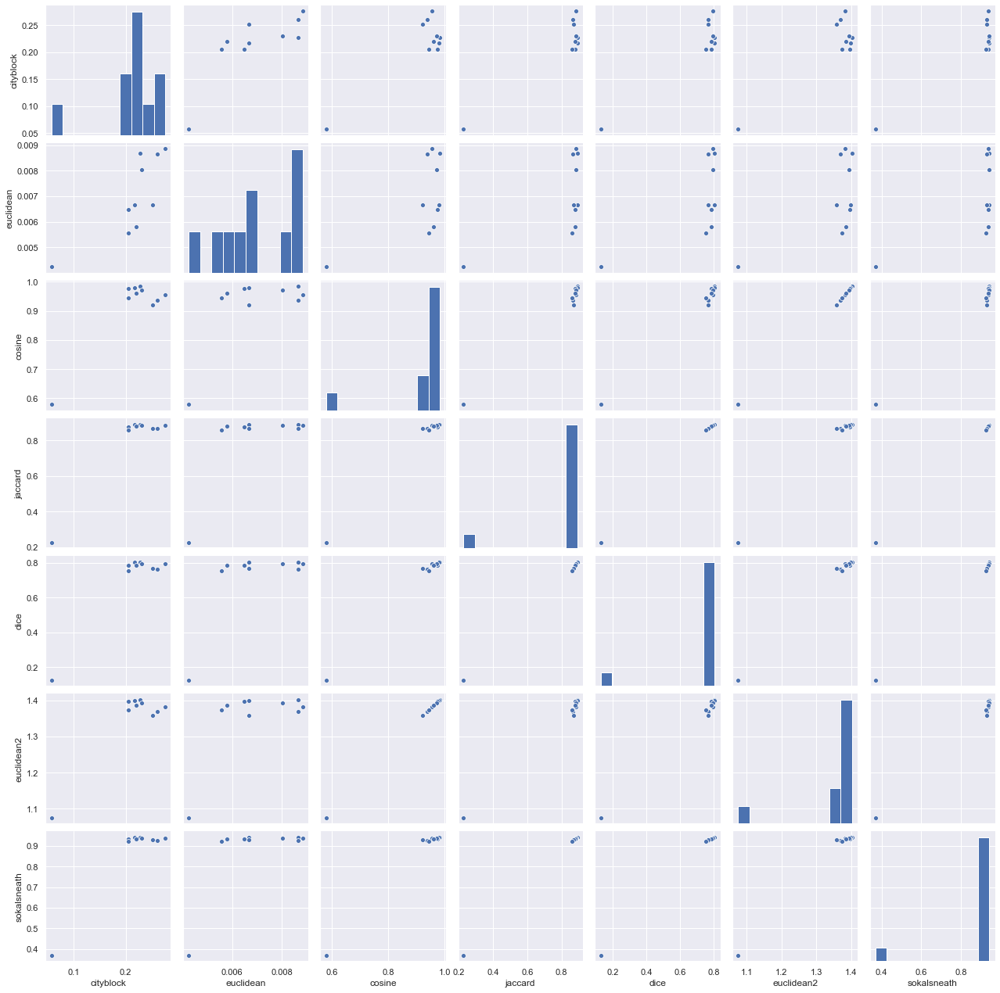

In [338]:
sns.pairplot(SAMPLE_2)

In [339]:
PAIRS_2.sort_values('cosine').head(20).style.background_gradient('YlGn')

In [340]:
def hca_2(sims, linkage_method='ward', color_thresh=.3, figsize=(10, 10)):
    tree = sch.linkage(sims, method=linkage_method)
    labels_hca_2 = DOC_2.Album.values
    plt.figure()
    fig, axes = plt.subplots(figsize=figsize)
    dendrogram = sch.dendrogram(tree, 
                                labels=labels_hca_2,
                                orientation="left", 
                                count_sort=True,
                                distance_sort=True,
                                above_threshold_color='.75',
                                color_threshold=color_thresh
                               )
    plt.tick_params(axis='both', which='major', labelsize=14)    # comment out labels line if breaks

<Figure size 432x288 with 0 Axes>

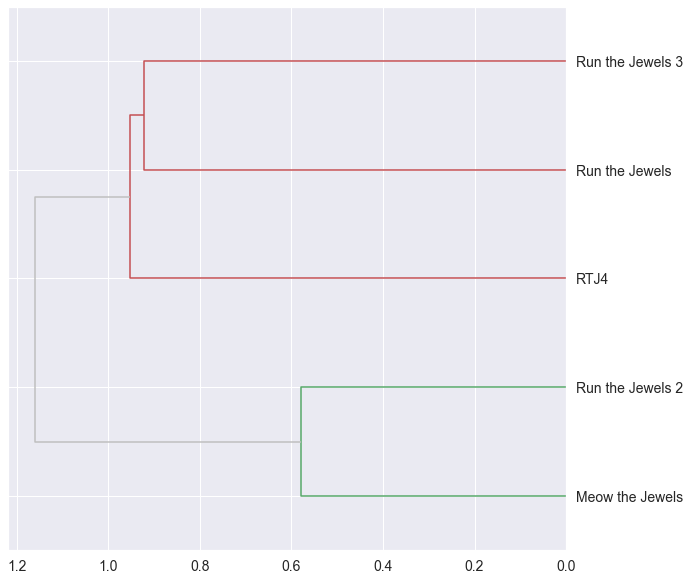

In [341]:
hca_2(PAIRS_2.cosine, color_thresh=1)

<Figure size 432x288 with 0 Axes>

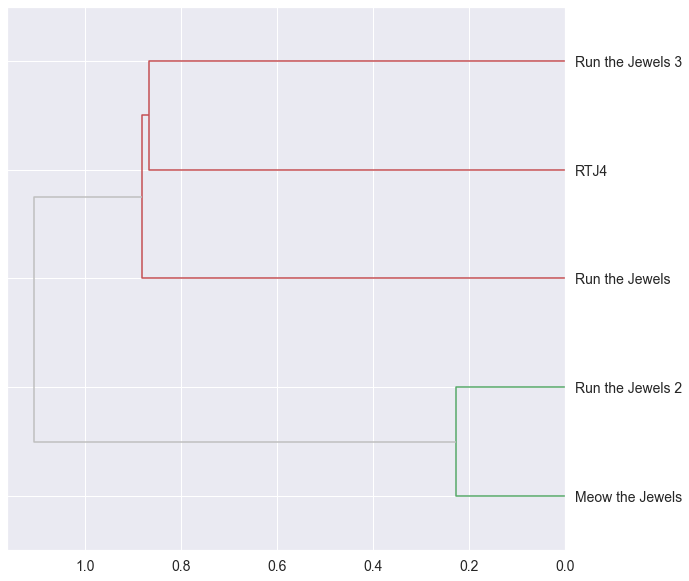

In [342]:
hca_2(PAIRS_2.jaccard, color_thresh=1)

<Figure size 432x288 with 0 Axes>

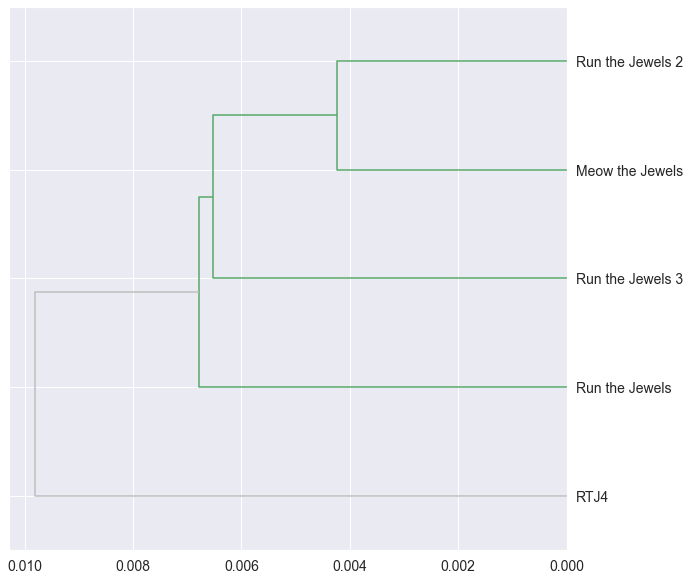

In [343]:
hca_2(PAIRS_2.euclidean, color_thresh=.007)

<Figure size 432x288 with 0 Axes>

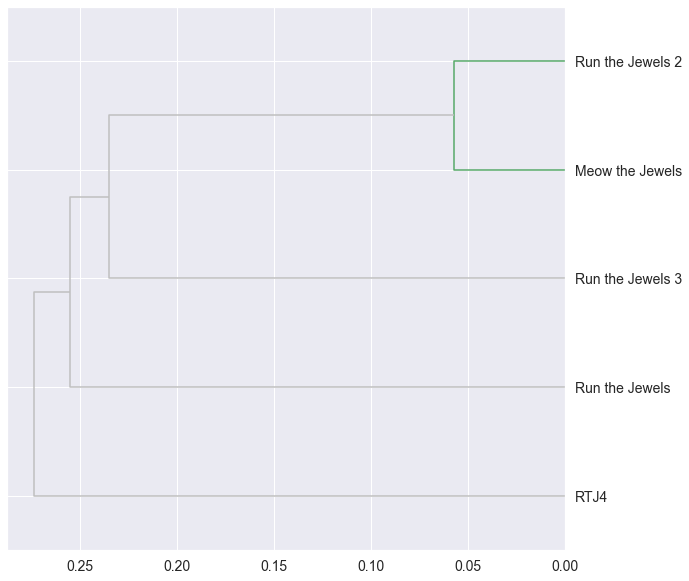

In [344]:
hca_2(PAIRS_2.cityblock, color_thresh=.22)

<Figure size 432x288 with 0 Axes>

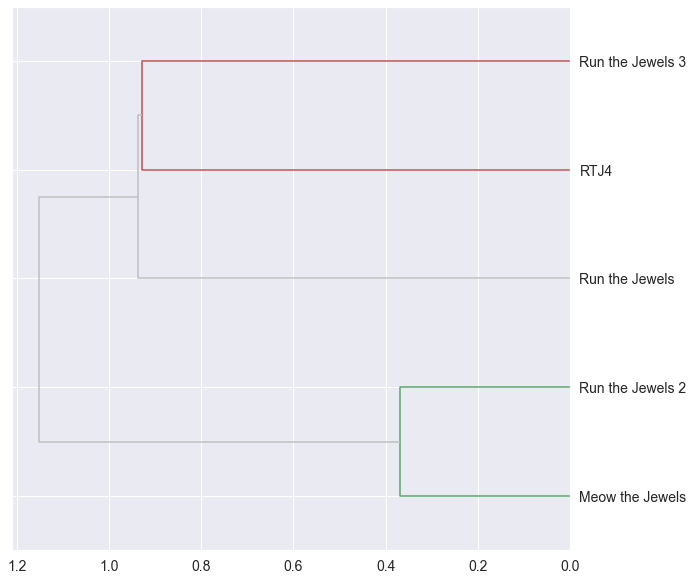

In [346]:
hca_2(PAIRS_2.sokalsneath, color_thresh = .93)

In [347]:
n_clusters = 4

In [348]:
DOC_2['y_raw'] = KMeans(n_clusters).fit_predict(TFIDF_2)
DOC_2['y_L0'] = KMeans(n_clusters).fit_predict(L0_2)
DOC_2['y_L1'] = KMeans(n_clusters).fit_predict(L1_2)
DOC_2['y_L2'] = KMeans(n_clusters).fit_predict(L2_2)

In [349]:
DOC_2.sort_values('y_raw').style.background_gradient(cmap='viridis')

term_id,Album,y_raw,y_L0,y_L1,y_L2
doc_id,,,,,
0,Meow the Jewels,0,0,2,0
3,Run the Jewels 2,0,0,0,0
2,Run the Jewels,1,3,0,3
1,RTJ4,2,2,1,2
4,Run the Jewels 3,3,1,3,1


## Prep Album Vocab

In [350]:
df_1["Lyrics"] = [fix_word(x) for x in df_1["Lyrics"] ]
df_2["Lyrics"] = [fix_word(x) for x in df_2["Lyrics"] ]
df_3["Lyrics"] = [fix_word(x) for x in df_3["Lyrics"] ]
df_4["Lyrics"] = [fix_word(x) for x in df_4["Lyrics"] ]
df_5["Lyrics"] = [fix_word(x) for x in df_5["Lyrics"] ]

In [351]:
df_1['Tokenized_Lyrics'] = df_1.apply(lambda row: nltk.word_tokenize(row['Lyrics']), axis=1)
df_2['Tokenized_Lyrics'] = df_2.apply(lambda row: nltk.word_tokenize(row['Lyrics']), axis=1)
df_3['Tokenized_Lyrics'] = df_3.apply(lambda row: nltk.word_tokenize(row['Lyrics']), axis=1)
df_4['Tokenized_Lyrics'] = df_4.apply(lambda row: nltk.word_tokenize(row['Lyrics']), axis=1)
df_5['Tokenized_Lyrics'] = df_5.apply(lambda row: nltk.word_tokenize(row['Lyrics']), axis=1)
frames['Tokenized_Lyrics'] = frames.apply(lambda row: nltk.word_tokenize(row['Lyrics']), axis=1)

In [352]:
df_1 = df_1.explode("Tokenized_Lyrics")
df_2 = df_2.explode("Tokenized_Lyrics")
df_3 = df_3.explode("Tokenized_Lyrics")
df_4 = df_4.explode("Tokenized_Lyrics")
df_5 = df_5.explode("Tokenized_Lyrics")
frames = frames.explode("Tokenized_Lyrics")

In [353]:
df_1['stop'] = df_1.Tokenized_Lyrics.map(sw.dummy)
df_2['stop'] = df_2.Tokenized_Lyrics.map(sw.dummy)
df_3['stop'] = df_3.Tokenized_Lyrics.map(sw.dummy)
df_4['stop'] = df_4.Tokenized_Lyrics.map(sw.dummy)
df_5['stop'] = df_5.Tokenized_Lyrics.map(sw.dummy)
frames['stop'] = frames.Tokenized_Lyrics.map(sw.dummy)

In [354]:
df_1 = df_1[df_1.stop != 1]
df_2 = df_2[df_2.stop != 1]
df_3 = df_3[df_3.stop != 1]
df_4 = df_4[df_4.stop != 1]
df_5 = df_5[df_5.stop != 1]
frames = frames[frames.stop != 1]

In [355]:
rtj4_list = list(df_4['Tokenized_Lyrics'].dropna())
rtj1_list = list(df_1['Tokenized_Lyrics'].dropna())
rtj2_list = list(df_2['Tokenized_Lyrics'].dropna())
rtj3_list = list(df_3['Tokenized_Lyrics'].dropna())
meow_list = list(df_5['Tokenized_Lyrics'].dropna())
corpus_list = list(frames['Tokenized_Lyrics'].dropna())

# Word Clouds

These word clouds operate on the censored word list (hence the need to include the regular expression argument, otherwise the censored words will not pass correctly).  This code can be edited slightly to run the uncensored word clouds (basically just don't pass the word list arguments through the censor_list_alt function).

In other words, use something like: 

<b>wc.generate(' '.join([str(elem) for elem in (meow_list)]))</b> 

instead of 

<b>wc.generate(' '.join([str(elem) for elem in censor_list_alt(meow_list)]))</b>


Note that I had to set "normalize_plurals" to False, else words like "jewels" would be missed in lieu of simply "jewel" (due to how WordCloud treats cases of the pluralized and singular forms of words in the same list).

I used different colors (background_color) for the different corpora.  This can be changed; the choice here was very much arbitrary.

## Entire Corpus

In [356]:
#https://cdn.shopify.com/s/files/1/0316/8708/2120/files/RTJ4_WEB.jpg?v=1588873976
# https://github.com/amueller/word_cloud/issues/517
#https://amueller.github.io/word_cloud/generated/wordcloud.WordCloud.html#wordcloud.WordCloud

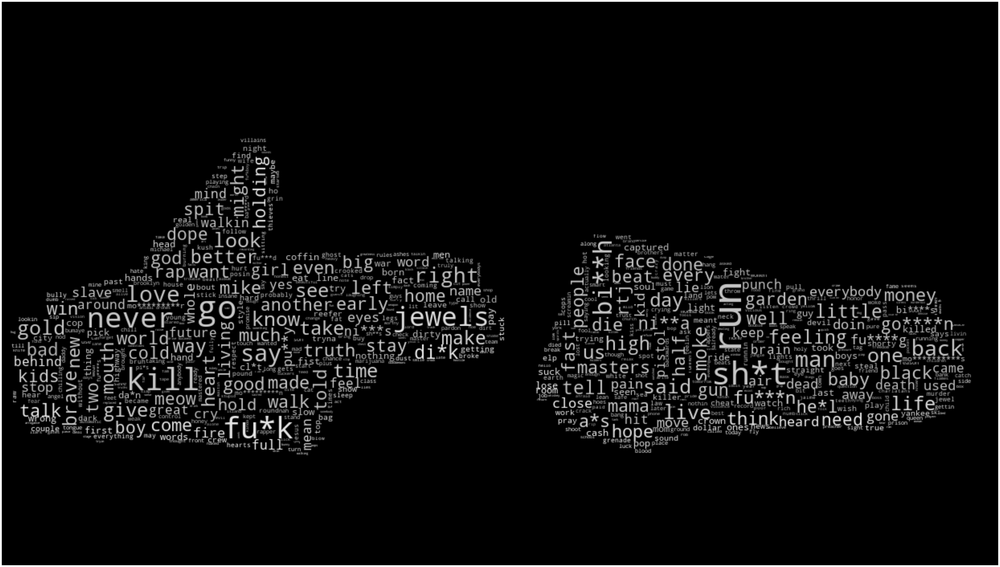

In [370]:
d = os.getcwd()
mask = np.array(Image.open(path.join(d, "rtj.jpg")))
wc = WordCloud(background_color="black", max_words=700, mask=mask,
               repeat = False, min_word_length=2, collocations=False, normalize_plurals = False,
               max_font_size=50, random_state=125, regexp = r"(\w+[-.*]{0,10}\w{0,10})")

wc.generate(' '.join([str(elem) for elem in censor_list_alt(corpus_list)]))
#wc.generate(' '.join([str(elem) for elem in (corpus_list)]))
# create coloring from image
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[70,70])
plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")
_=plt.show()

## *Run the Jewels* (2013)

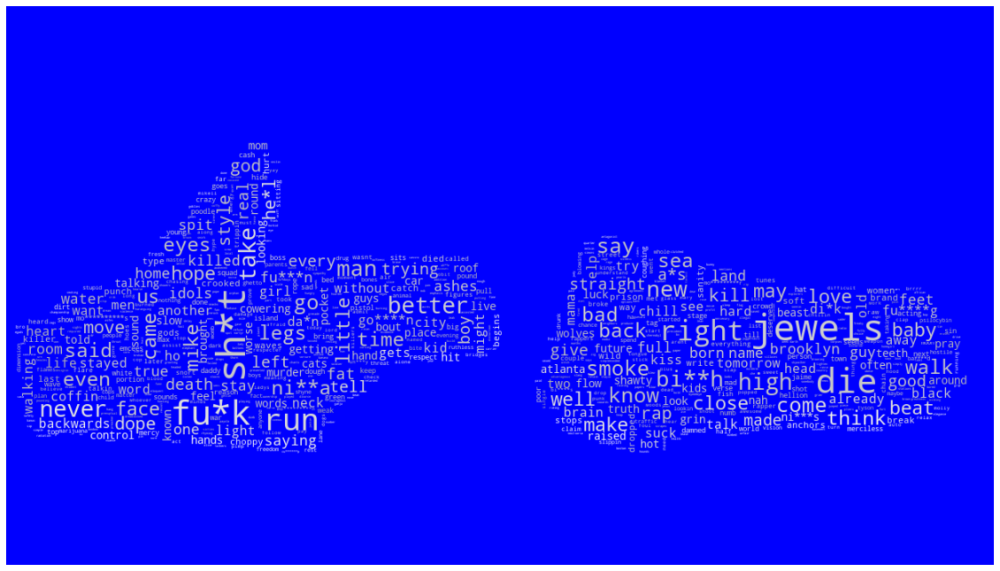

In [358]:
wc = WordCloud(background_color="blue", max_words=700, mask=mask, 
               repeat = False, min_word_length=2, collocations=False, normalize_plurals = False,
               max_font_size=50, random_state=125, regexp = r"(\w+[-.*]{0,10}\w{0,10})")

wc.generate( ' '.join([str(elem) for elem in censor_list_alt(rtj1_list)]))

# create coloring from image
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[20,20])
plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")
_=plt.show()

## *Run the Jewels 2* (2014)

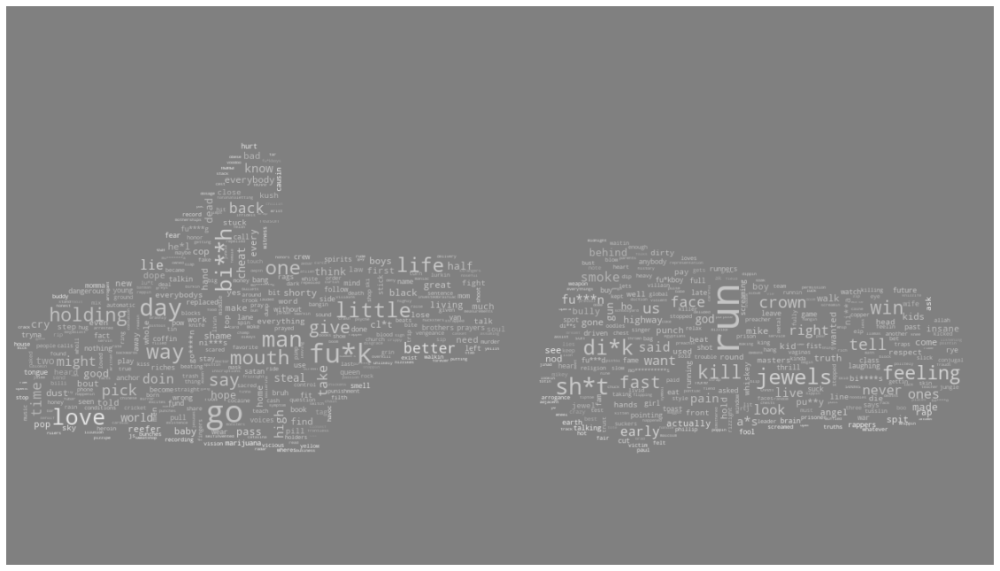

In [359]:
wc = WordCloud(background_color="grey", max_words=700, mask=mask, 
               repeat = False, min_word_length=2, collocations=False, normalize_plurals = False,
               max_font_size=50, random_state=125, regexp = r"(\w+[-.*]{0,10}\w{0,10})")

wc.generate(' '.join([str(elem) for elem in censor_list_alt(rtj2_list)]))

# create coloring from image
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[20,20])
plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")
_=plt.show()

## *Run the Jewels 3* (2016)

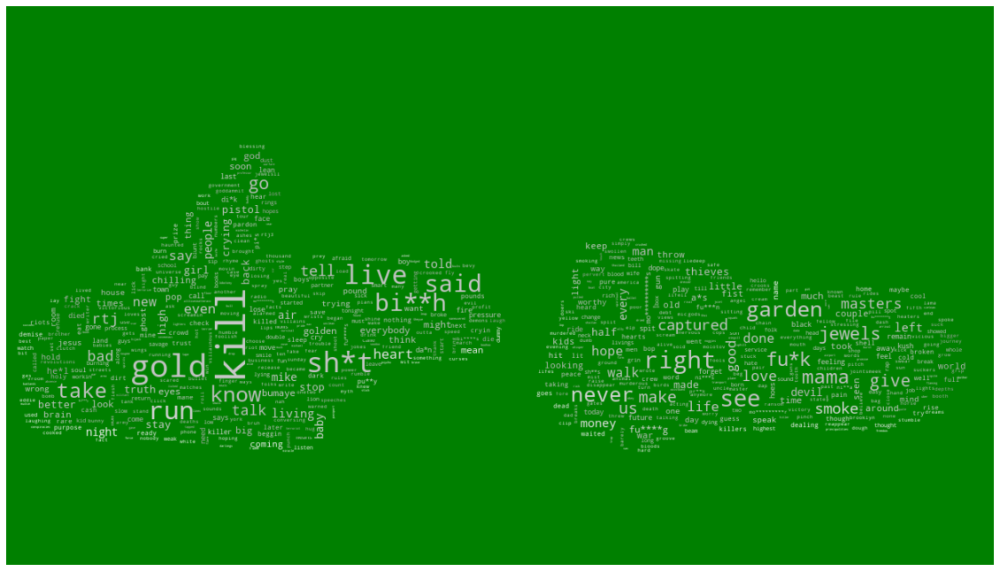

In [360]:
wc = WordCloud(background_color="green", max_words=700, mask=mask, 
               repeat = False, min_word_length=2, collocations=False, normalize_plurals = False,
               max_font_size=50, random_state=125, regexp = r"(\w+[-.*]{0,10}\w{0,10})")

wc.generate(' '.join([str(elem) for elem in censor_list_alt(rtj3_list)]))

# create coloring from image
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[20,20])
plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")
_=plt.show()

## *RTJ4* (2020)

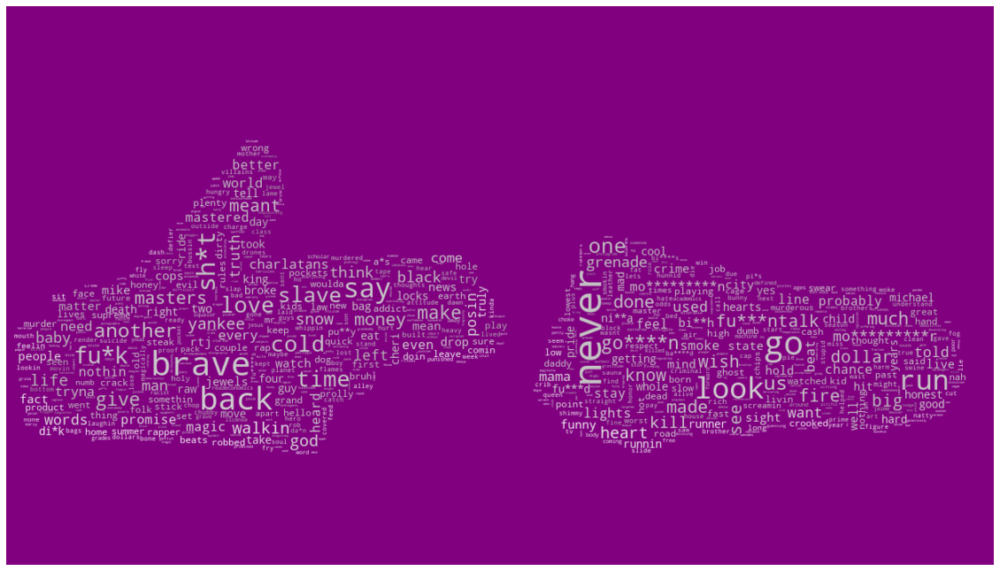

In [361]:
wc = WordCloud(background_color="purple", max_words=750, mask=mask,
               repeat = False, min_word_length=2, collocations=False, normalize_plurals = False,
               max_font_size=50, random_state=125, regexp = r"(\w+[-.*]{0,10}\w{0,10})")

wc.generate( ' '.join([str(elem) for elem in censor_list_alt(rtj4_list)]))

# create coloring from image
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[20,20])
plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")
_=plt.show()

## *Meow the Jewels* (2015)

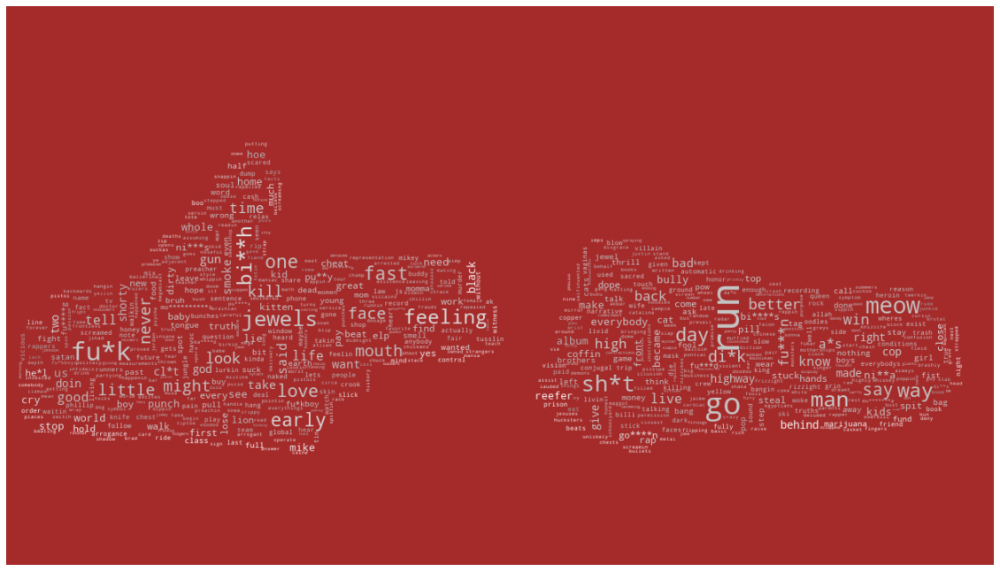

In [364]:
wc = WordCloud(background_color="brown", max_words=700, mask=mask,
               repeat = False, min_word_length=2, collocations=False, normalize_plurals = False,
               max_font_size=50, random_state=125, regexp = r"(\w+[-.*]{0,10}\w{0,10})")

wc.generate(' '.join([str(elem) for elem in censor_list_alt(meow_list)]))
#wc.generate(' '.join([str(elem) for elem in (meow_list)]))
# create coloring from image
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[20,20])
plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")
_=plt.show()

# Sentiment Analysis

## Get Sentiment Lexcion from UVA Course

In [371]:
salex = pd.read_csv('salex_nrc.csv').set_index('term_str')
salex.columns = [col.replace('nrc_','') for col in salex.columns]

In [372]:
salex['polarity'] = salex.positive - salex.negative

In [373]:
emo_cols = "anger anticipation disgust fear joy sadness surprise trust polarity".split()

In [374]:
salex = salex.rename_axis('Token')

In [375]:
TOKEN = TOKEN.join(salex, on='Token', how='left')
TOKEN[emo_cols] = TOKEN[emo_cols].fillna(0)

In [376]:
# Neutralize stopwords!  Applies to cases where words like "I'll" converted to "ill", which would be considered
# negative, even though it is not being used as such lyrically in almost all cases within this corpus

for i in range(len(TOKEN)):
    if TOKEN["Token"].values[i] in all_stopwords:
        TOKEN["anger"].values[i] = 0
        TOKEN["anticipation"].values[i] = 0
        TOKEN["disgust"].values[i] = 0
        TOKEN["fear"].values[i] = 0
        TOKEN["joy"].values[i] = 0
        TOKEN["sadness"].values[i] = 0
        TOKEN["surprise"].values[i] = 0
        TOKEN["trust"].values[i] = 0
        TOKEN["polarity"].values[i] = 0
        TOKEN["positive"].values[i] = 0
        TOKEN["negative"].values[i] = 0
    else:
        continue

In [377]:
TOKEN[salex.columns].sample(10)

anger  anticipation  disgust  fear  joy  \
Album_num Track_num Lyric_num                                            
5         8         70           0.0           0.0      0.0   0.0  0.0   
          4         3            0.0           0.0      0.0   0.0  0.0   
3         13        64           0.0           0.0      0.0   0.0  0.0   
5         0         63           0.0           0.0      0.0   0.0  0.0   
4         0         28           0.0           0.0      0.0   0.0  0.0   
2         8         38           0.0           0.0      0.0   0.0  0.0   
3         8         52           0.0           0.0      0.0   1.0  0.0   
4         4         25           0.0           0.0      0.0   0.0  0.0   
3         9         12           0.0           0.0      0.0   0.0  0.0   
          3         23           0.0           0.0      0.0   0.0  0.0   

                               negative  positive  sadness  surprise  trust  \
Album_num Track_num Lyric_num                                                 
5         8         70              0.0       0.0      0.0       0.0    0.0   
          4         3               NaN       NaN      0.0       0.0    0.0   
3         13        64              0.0       0.0      0.0       0.0    0.0   
5         0         63              0.0       0.0      0.0       0.0    0.0   
4         0         28              NaN       NaN      0.0       0.0    0.0   
2         8         38              0.0       0.0      0.0       0.0    0.0   
3         8         52              1.0       0.0      1.0       0.0    0.0   
4         4         25              0.0       0.0      0.0       0.0    0.0   
3         9         12              0.0       0.0      0.0       0.0    0.0   
          3         23              0.0       0.0      0.0       0.0    0.0   

                               polarity  
Album_num Track_num Lyric_num            
5         8         70              0.0  
          4         3               0.0  
3         13        64              0.0  
5         0         63              0.0  
4         0         28              0.0  
2         8         38              0.0  
3         8         52             -1.0  
4         4         25              0.0  
3         9         12              0.0  
          3         23              0.0

In [378]:
TOKEN_cens = TOKEN.copy()

dummy = [censor_list_alt(x) for x in TOKEN_cens["Lyrics"].str.split()]
TOKEN_cens["Lyrics"] = [" ".join(x) for x in dummy]

dummy = [censor_list_alt(x) for x in TOKEN_cens["Token"].str.split()]
TOKEN_cens["Token"] = [" ".join(x) for x in dummy]


TOKEN_cens["POS_Tagged"] = "[("+ TOKEN_cens["Token"] +", "+ TOKEN_cens["POS"] +")]"

In [379]:
TOKEN_cens[['Token'] + emo_cols].sample(15)

Token  anger  anticipation  disgust  fear  \
Album_num Track_num Lyric_num                                               
3         8         82            the    0.0           0.0      0.0   0.0   
5         8         60             me    0.0           0.0      0.0   0.0   
4         10        19          never    0.0           0.0      0.0   0.0   
2         6         8             you    0.0           0.0      0.0   0.0   
3         12        22          still    0.0           0.0      0.0   0.0   
          5         25           play    0.0           0.0      0.0   0.0   
          9         52              a    0.0           0.0      0.0   0.0   
4         7         32           da*n    1.0           0.0      1.0   0.0   
          9         4             the    0.0           0.0      0.0   0.0   
3         8         79            joy    0.0           0.0      0.0   0.0   
4         9         29           from    0.0           0.0      0.0   0.0   
          10        62          brave    0.0           0.0      0.0   0.0   
2         7         17             of    0.0           0.0      0.0   0.0   
3         6         40           work    0.0           0.0      0.0   0.0   
2         9         36         become    0.0           0.0      0.0   0.0   

                               joy  sadness  surprise  trust  polarity  
Album_num Track_num Lyric_num                                           
3         8         82         0.0      0.0       0.0    0.0       0.0  
5         8         60         0.0      0.0       0.0    0.0       0.0  
4         10        19         0.0      0.0       0.0    0.0       0.0  
2         6         8          0.0      0.0       0.0    0.0       0.0  
3         12        22         0.0      0.0       0.0    0.0       0.0  
          5         25         0.0      0.0       0.0    0.0       0.0  
          9         52         0.0      0.0       0.0    0.0       0.0  
4         7         32         0.0      0.0       0.0    0.0      -1.0  
          9         4          0.0      0.0       0.0    0.0       0.0  
3         8         79         1.0      0.0       0.0    0.0       1.0  
4         9         29         0.0      0.0       0.0    0.0       0.0  
          10        62         0.0      0.0       0.0    0.0       0.0  
2         7         17         0.0      0.0       0.0    0.0       0.0  
3         6         40         0.0      0.0       0.0    0.0       0.0  
2         9         36         0.0      0.0       0.0    0.0       0.0

In [380]:
TOKEN[emo_cols] = TOKEN[emo_cols].fillna(0)
TOKEN_cens[emo_cols] = TOKEN_cens[emo_cols].fillna(0)

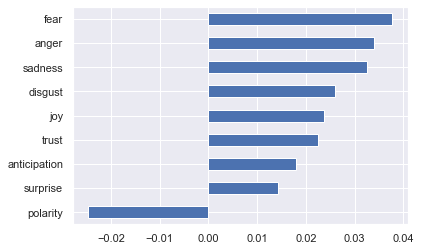

In [381]:
TOKEN[emo_cols].mean().sort_values().plot.barh()

## Sentiment by Album

In [382]:
# Split our dataframe into the individual albums
TOKEN_rtj = TOKEN[TOKEN.Album == "Run the Jewels"]
TOKEN_rtj_2 = TOKEN[TOKEN.Album == "Run the Jewels 2"]
TOKEN_rtj_3 = TOKEN[TOKEN.Album == "Run the Jewels 3"]
TOKEN_rtj_4 = TOKEN[TOKEN.Album == "RTJ4"]
TOKEN_meow = TOKEN[TOKEN.Album == "Meow the Jewels"]

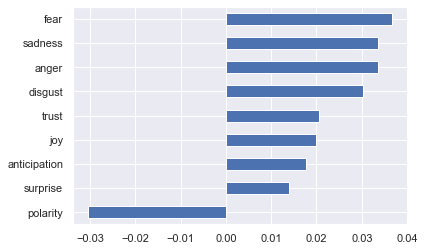

In [383]:
TOKEN_rtj[emo_cols].mean().sort_values().plot.barh()

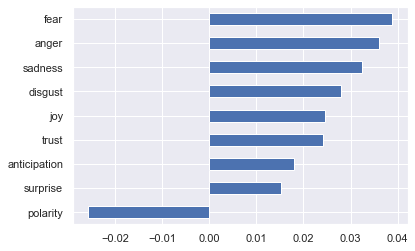

In [384]:
TOKEN_rtj_2[emo_cols].mean().sort_values().plot.barh()

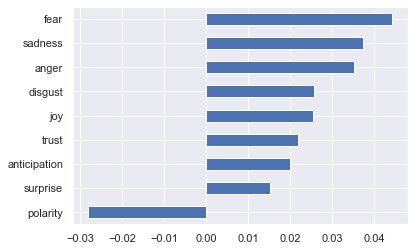

In [385]:
TOKEN_rtj_3[emo_cols].mean().sort_values().plot.barh()

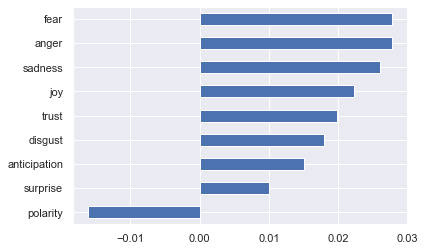

In [386]:
TOKEN_rtj_4[emo_cols].mean().sort_values().plot.barh()

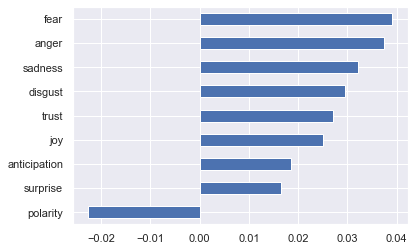

In [387]:
TOKEN_meow[emo_cols].mean().sort_values().plot.barh()

In [388]:
rtj_tracks = TOKEN_rtj.groupby(OHCO_1a[1:2])[emo_cols].mean()
rtj_2_tracks = TOKEN_rtj_2.groupby(OHCO_1a[1:2])[emo_cols].mean()
rtj_3_tracks = TOKEN_rtj_3.groupby(OHCO_1a[1:2])[emo_cols].mean()
rtj_4_tracks = TOKEN_rtj_4.groupby(OHCO_1a[1:2])[emo_cols].mean()
meow_tracks = TOKEN_meow.groupby(OHCO_1a[1:2])[emo_cols].mean()

In [389]:
rtj_albums = TOKEN.groupby(OHCO_1a[0:1])[emo_cols].mean()

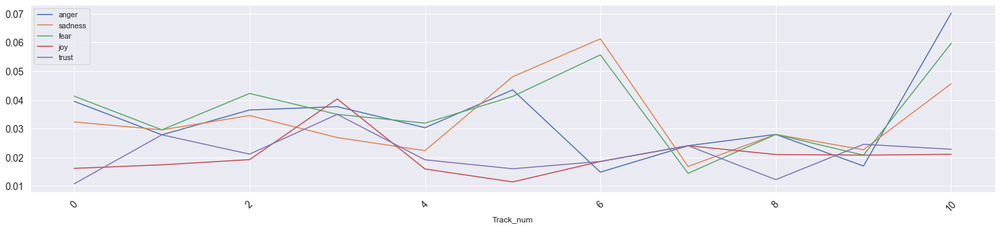

In [390]:
plot_sentiments(rtj_tracks, ['anger','sadness','fear','joy','trust'])

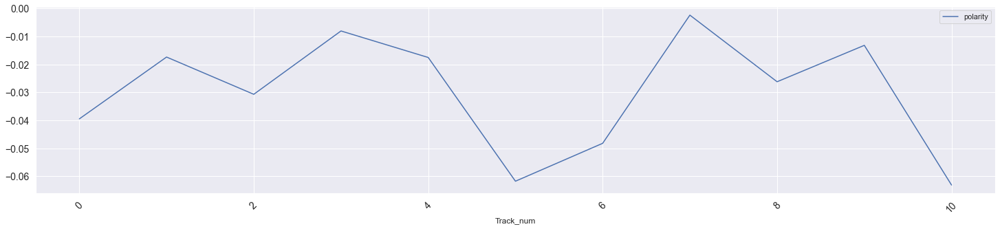

In [391]:
plot_sentiments(rtj_tracks, ['polarity'])

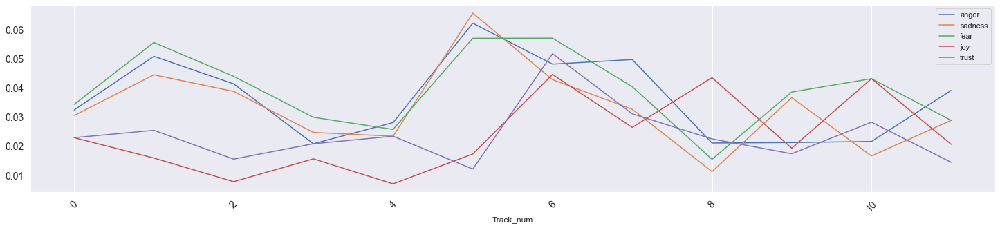

In [392]:
plot_sentiments(rtj_2_tracks,['anger','sadness','fear','joy','trust'])

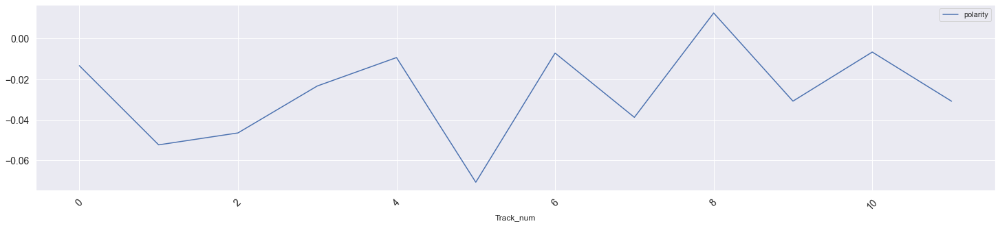

In [393]:
plot_sentiments(rtj_2_tracks, ['polarity'])

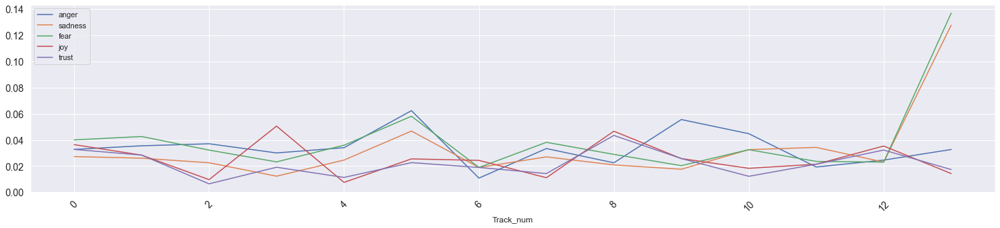

In [394]:
plot_sentiments(rtj_3_tracks, ['anger','sadness','fear','joy','trust'])

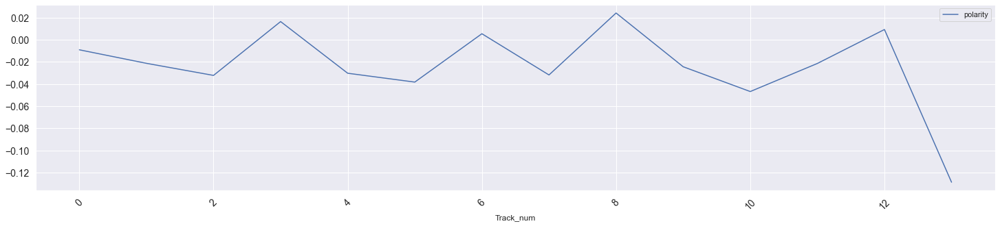

In [395]:
plot_sentiments(rtj_3_tracks, ['polarity'])

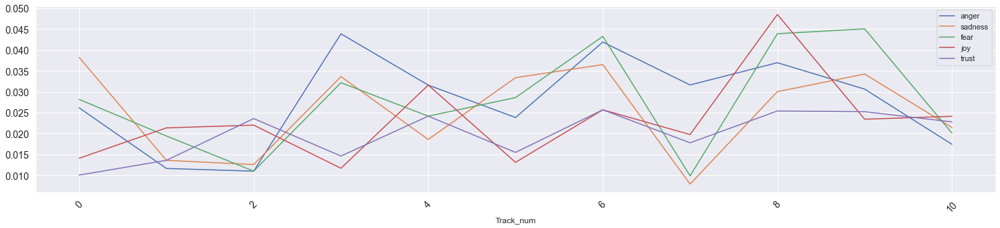

In [396]:
plot_sentiments(rtj_4_tracks, ['anger','sadness','fear','joy','trust'])

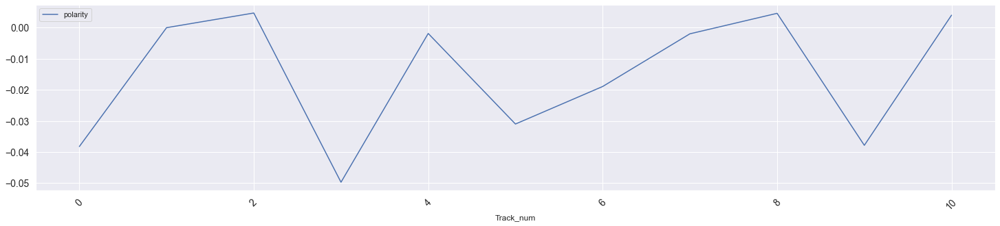

In [397]:
plot_sentiments(rtj_4_tracks, ['polarity'])

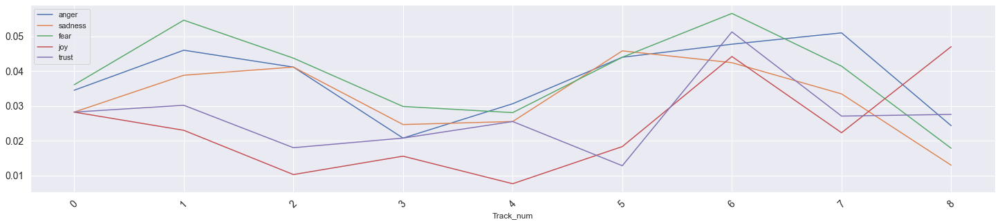

In [398]:
plot_sentiments(meow_tracks, ['anger','sadness','fear','joy','trust'])

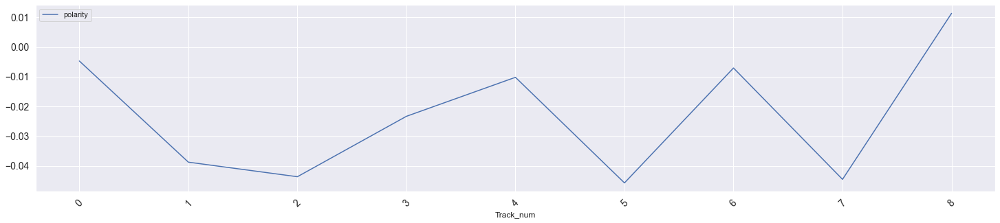

In [399]:
plot_sentiments(meow_tracks, ['polarity'])

In [400]:
# Across all albums

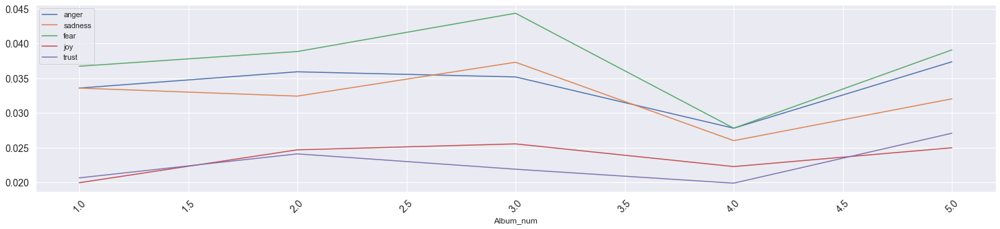

In [401]:
plot_sentiments(rtj_albums, ['anger','sadness','fear','joy','trust'])  # Remove 'polarity'

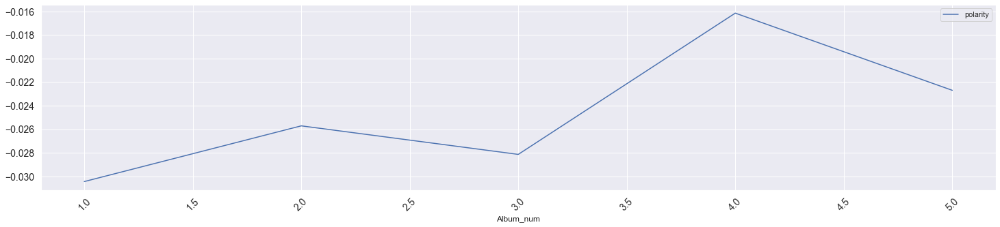

In [402]:
plot_sentiments(rtj_albums, ['polarity'])

In [403]:
emo = 'polarity'
emo_bing = "bing_polarity"

In [404]:
TOKEN_rtj_copy = TOKEN_rtj.copy(deep=True)
TOKEN_rtj_2_copy = TOKEN_rtj_2.copy(deep=True)
TOKEN_rtj_3_copy = TOKEN_rtj_3.copy(deep=True)
TOKEN_rtj_4_copy = TOKEN_rtj_4.copy(deep=True)
TOKEN_meow_copy =  TOKEN_meow.copy(deep=True)
TOKEN_copy = TOKEN.copy(deep=True)

In [405]:
TOKEN_rtj['html'] =  TOKEN_rtj_copy.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), \
                                                                                       x.Token), 1)
TOKEN_rtj_2['html'] =  TOKEN_rtj_2_copy.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), \
                                                                                           x.Token), 1)
TOKEN_rtj_3['html'] =  TOKEN_rtj_3_copy.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), \
                                                                                           x.Token), 1)
TOKEN_rtj_4['html'] =  TOKEN_rtj_4_copy.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), \
                                                                                           x.Token), 1)
TOKEN_meow['html'] =  TOKEN_meow_copy.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), \
                                                                                          x.Token), 1)
TOKEN['html'] =  TOKEN_copy.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.Token), 1)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

In [406]:
TOKEN_rtj_cens = TOKEN_rtj.copy(deep=True)
TOKEN_rtj_2_cens = TOKEN_rtj_2.copy(deep=True)
TOKEN_rtj_3_cens = TOKEN_rtj_3.copy(deep=True)
TOKEN_rtj_4_cens = TOKEN_rtj_4.copy(deep=True)
TOKEN_meow_cens = TOKEN_meow.copy(deep=True)
TOKEN_cens = TOKEN.copy(deep=True)

In [407]:
dummy = [censor_list_alt(x) for x in (TOKEN_rtj_cens["html"].str.replace("<"," <").str.replace(">","> ")).str.split()]
TOKEN_rtj_cens["Lyrics"] = [" ".join(x) for x in dummy]
TOKEN_rtj_cens["Lyrics"].sample(10)

Album_num  Track_num  Lyric_num
1          6          16               <span class='sent0'> a </span>
           5          32             <span class='sent0'> and </span>
           3          35               <span class='sent0'> a </span>
           1          7             <span class='sent0'> your </span>
           5          42            <span class='sent0'> been </span>
           1          16             <span class='sent0'> and </span>
           7          16             <span class='sent0'> the </span>
           6          36            <span class='sent0'> room </span>
           2          37              <span class='sent0'> me </span>
           10         26           <span class='sent0'> heart </span>
Name: Lyrics, dtype: object

In [408]:
dummy = [censor_list_alt(x) for x in (TOKEN_rtj_2_cens["html"].str.replace("<"," <").str.replace(">","> ")).str.split()]
TOKEN_rtj_2_cens["Lyrics"] = [" ".join(x) for x in dummy]
TOKEN_rtj_2_cens["Lyrics"].sample(10)

Album_num  Track_num  Lyric_num
2          7          76                  <span class='sent0'> of </span>
           8          4            <span class='sent0'> husbaland </span>
           7          1                <span class='sent0'> iller </span>
           1          60                  <span class='sent0'> my </span>
           4          11              <span class='sent0'> potent </span>
           3          20                 <span class='sent0'> wig </span>
           0          40                 <span class='sent0'> won </span>
           5          1                 <span class='sent0'> like </span>
           10         6                  <span class='sent0'> the </span>
           2          32             <span class='sent-1'> insane </span>
Name: Lyrics, dtype: object

In [409]:
dummy = [censor_list_alt(x) for x in (TOKEN_rtj_3_cens["html"].str.replace("<"," <").str.replace(">","> ")).str.split()]
TOKEN_rtj_3_cens["Lyrics"] = [" ".join(x) for x in dummy]
TOKEN_rtj_3_cens["Lyrics"].sample(10)

Album_num  Track_num  Lyric_num
3          13         54             <span class='sent0'> get </span>
                      30            <span class='sent0'> told </span>
           12         36            <span class='sent0'> left </span>
           8          47            <span class='sent0'> live </span>
           7          73            <span class='sent0'> done </span>
           0          61               <span class='sent0'> i </span>
           6          31           <span class='sent-1'> he*l </span>
           5          34           <span class='sent0'> thats </span>
           13         22               <span class='sent0'> i </span>
           3          24            <span class='sent0'> live </span>
Name: Lyrics, dtype: object

In [410]:
dummy = [censor_list_alt(x) for x in (TOKEN_rtj_4_cens["html"].str.replace("<"," <").str.replace(">","> ")).str.split()]
TOKEN_rtj_4_cens["Lyrics"] = [" ".join(x) for x in dummy]
TOKEN_rtj_4_cens["Lyrics"].sample(10)

Album_num  Track_num  Lyric_num
4          2          16               <span class='sent0'> man </span>
           7          42                 <span class='sent0'> i </span>
           6          45                <span class='sent0'> by </span>
           3          7               <span class='sent0'> beat </span>
           6          58             <span class='sent-1'> sh*t </span>
           0          38           <span class='sent-1'> demise </span>
           3          40                <span class='sent0'> up </span>
           6          58            <span class='sent0'> follow </span>
           1          12              <span class='sent0'> hold </span>
           7          9                 <span class='sent0'> im </span>
Name: Lyrics, dtype: object

In [411]:
dummy = [censor_list_alt(x) for x in (TOKEN_meow_cens["html"].str.replace("<"," <").str.replace(">","> ")).str.split()]
TOKEN_meow_cens["Lyrics"] = [" ".join(x) for x in dummy]
TOKEN_meow_cens["Lyrics"].sample(10)

Album_num  Track_num  Lyric_num
5          3          35             <span class='sent0'> honey </span>
           0          56           <span class='sent0'> symptom </span>
           8          45                <span class='sent0'> of </span>
           6          44               <span class='sent0'> get </span>
           5          56              <span class='sent0'> cant </span>
           4          34                <span class='sent0'> we </span>
           5          7                <span class='sent0'> the </span>
           8          23                <span class='sent0'> im </span>
           5          2                 <span class='sent0'> it </span>
           8          34                <span class='sent0'> of </span>
Name: Lyrics, dtype: object

In [412]:
dummy = [censor_list_alt(x) for x in (TOKEN_cens["html"].str.replace("<"," <").str.replace(">","> ")).str.split()]
TOKEN_cens["Lyrics"] = [" ".join(x) for x in dummy]
TOKEN_cens["Lyrics"].sample(10)

Album_num  Track_num  Lyric_num
2          5          34             <span class='sent-1'> steal </span>
1          10         49             <span class='sent0'> haunts </span>
2          7          3                 <span class='sent0'> two </span>
3          2          27               <span class='sent0'> over </span>
4          7          12             <span class='sent0'> advice </span>
           2          3            <span class='sent1'> sobriety </span>
5          5          32                <span class='sent0'> win </span>
2          10         3             <span class='sent1'> spirits </span>
1          1          17                 <span class='sent0'> we </span>
5          1          19                  <span class='sent0'> i </span>
Name: Lyrics, dtype: object

In [413]:
TOKEN_rtj_cens_lyr = TOKEN_rtj_cens.groupby(OHCO_1a[0:3])[emo_cols].mean()  # 0:3
TOKEN_rtj_2_cens_lyr = TOKEN_rtj_2_cens.groupby(OHCO_1a[0:3])[emo_cols].mean()
TOKEN_rtj_3_cens_lyr = TOKEN_rtj_3_cens.groupby(OHCO_1a[0:3])[emo_cols].mean()
TOKEN_rtj_4_cens_lyr = TOKEN_rtj_4_cens.groupby(OHCO_1a[0:3])[emo_cols].mean()
TOKEN_meow_cens_lyr = TOKEN_meow_cens.groupby(OHCO_1a[0:3])[emo_cols].mean()
TOKEN_cens_lyr = TOKEN_cens.groupby(OHCO_1a[0:3])[emo_cols].mean()

In [414]:
TOKEN_rtj_cens_lyr['lyr_str'] = TOKEN_rtj_cens.groupby(OHCO_1a[0:3]).Token.apply(lambda x: x.str.cat(sep=' ')) # 0:3
TOKEN_rtj_cens_lyr['html_str'] = TOKEN_rtj_cens.groupby(OHCO_1a[0:3]).html.apply(lambda x: x.str.cat(sep=' ')) # 0:3
dummy = [censor_list_alt(x) for x in TOKEN_rtj_cens_lyr["lyr_str"].str.split()]
TOKEN_rtj_cens_lyr["lyr_str"] = [" ".join(x) for x in dummy]
dummy = [censor_list_alt(x) for x in (TOKEN_rtj_cens_lyr["html_str"].str.replace("<"," <").str.replace(">","> ")).str.split()]
TOKEN_rtj_cens_lyr["html_str"] = [" ".join(x) for x in dummy]

In [415]:
TOKEN_rtj_2_cens_lyr['lyr_str'] = TOKEN_rtj_2_cens.groupby(OHCO_1a[0:3]).Token.apply(lambda x: x.str.cat(sep=' '))
TOKEN_rtj_2_cens_lyr['html_str'] = TOKEN_rtj_2_cens.groupby(OHCO_1a[0:3]).html.apply(lambda x: x.str.cat(sep=' '))
dummy = [censor_list_alt(x) for x in TOKEN_rtj_2_cens_lyr["lyr_str"].str.split()]
TOKEN_rtj_2_cens_lyr["lyr_str"] = [" ".join(x) for x in dummy]
dummy = [censor_list_alt(x) for x in (TOKEN_rtj_2_cens_lyr["html_str"].str.replace("<"," <").str.replace(">","> ")).str.split()]
TOKEN_rtj_2_cens_lyr["html_str"] = [" ".join(x) for x in dummy]

In [416]:
TOKEN_cens_lyr['lyr_str'] = TOKEN_cens.groupby(OHCO_1a[0:3]).Token.apply(lambda x: x.str.cat(sep=' '))
TOKEN_cens_lyr['html_str'] = TOKEN_cens.groupby(OHCO_1a[0:3]).html.apply(lambda x: x.str.cat(sep=' '))
dummy = [censor_list_alt(x) for x in TOKEN_cens_lyr["lyr_str"].str.split()]
TOKEN_cens_lyr["lyr_str"] = [" ".join(x) for x in dummy]
dummy = [censor_list_alt(x) for x in (TOKEN_cens_lyr["html_str"].str.replace("<"," <").str.replace(">","> ")).str.split()]
TOKEN_cens_lyr["html_str"] = [" ".join(x) for x in dummy]

In [417]:
sample_lyrics(TOKEN_cens_lyr)

Sentiment,ID,Lyric
-0.0625,"(5, 1, 48)",pointin that pistol and fist for the chain reppin the symbol like they in a gang
0.0,"(5, 7, 5)",ill beat you to a pulp no fiction
0.0,"(4, 2, 46)",meet us at three oclock if you wan na do something tragic
-0.3333,"(4, 9, 66)",theres a grenade
0.0,"(3, 0, 59)",i know a few people pray for my demise yall
0.0,"(5, 8, 64)",yeah hoe
0.0,"(3, 5, 10)",gold gold its gold
-0.1667,"(1, 8, 33)",this that stingy with di*k bi**h not a fu*k do i give
0.0,"(2, 4, 50)",and i been this way shorty
0.0,"(1, 4, 40)",real sh*t i came for the jewels


In [418]:
sample_lyrics(TOKEN_rtj_cens_lyr)

Sentiment,ID,Lyric
0.2222,"(1, 1, 3)",evident its with emphasis i deserve me a championship
-0.1429,"(1, 5, 37)",mama said i wouldnt leave the womb
0.0,"(1, 2, 8)",how far is we away man not far
-0.0667,"(1, 6, 29)",in the vip of the club where they strip with a zip and a bo**r
0.125,"(1, 1, 30)",you suck a good di*k for the fame
0.0,"(1, 4, 11)",pass me the baton the rest o yall batten the hatches
0.0,"(1, 6, 38)",i said i never did that and i never did you
-0.1429,"(1, 4, 3)",got a style from the guts of the most irrational beast in the district
-0.1429,"(1, 2, 30)",runnin round talkin bout yeah he plexed
0.0,"(1, 10, 45)",due to colt 45 plus smoke got sh***y


In [419]:
sample_lyrics(TOKEN_rtj_2_cens_lyr)

Sentiment,ID,Lyric
0.0,"(2, 1, 73)",on highway 6 and im not strapped in
-0.1429,"(2, 2, 33)",or maybe sanctifying the sadistic is deranged
-0.1,"(2, 3, 58)",my battle status is burning mansions from dallas to malibu
0.0,"(2, 8, 50)",thats what you want huh
-0.1,"(2, 3, 9)",bout to turn this mo*******a up like rikers island bruh
0.0,"(2, 8, 5)",do you wear the muzzlin do you ask him pretty please
-0.2308,"(2, 2, 37)",i probably smell like a pound when they put me in a coffin
0.0,"(2, 7, 52)",this my house its high or the highway
0.25,"(2, 9, 19)",i found in christ
0.0,"(2, 1, 15)",trust me im a doctor doom oper


In [420]:
TOKEN_rtj_3_cens_lyr['lyr_str'] = TOKEN_rtj_3_cens.groupby(OHCO_1a[0:3]).Token.apply(lambda x: x.str.cat(sep=' '))
TOKEN_rtj_3_cens_lyr['html_str'] = TOKEN_rtj_3_cens.groupby(OHCO_1a[0:3]).html.apply(lambda x: x.str.cat(sep=' '))
dummy = [censor_list_alt(x) for x in TOKEN_rtj_3_cens_lyr["lyr_str"].str.split()]
TOKEN_rtj_3_cens_lyr["lyr_str"] = [" ".join(x) for x in dummy]
dummy = [censor_list_alt(x) for x in (TOKEN_rtj_3_cens_lyr["html_str"].str.replace("<"," <").str.replace(">","> ")).str.split()]
TOKEN_rtj_3_cens_lyr["html_str"] = [" ".join(x) for x in dummy]

In [421]:
sample_lyrics(TOKEN_rtj_3_cens_lyr)

Sentiment,ID,Lyric
0.0,"(3, 7, 66)",the universe curses the killers mane
-0.2857,"(3, 12, 19)",the cruelty of randomness holding for ransom
-0.125,"(3, 8, 36)",they dont see the size of the fight
-0.0769,"(3, 5, 29)",i got a bad girl i got a brain with an a*s girl
0.0,"(3, 2, 12)",crooked at work
-0.125,"(3, 13, 36)",i maneuver through manure like a slumdog millionaire
0.0,"(3, 5, 77)",gold gold its gold
0.0,"(3, 2, 63)",and the crowd goes rtj
0.0,"(3, 13, 104)",run em
0.0,"(3, 1, 7)",on the radio heard a plane hijack


In [422]:
TOKEN_rtj_4_cens_lyr['lyr_str'] = TOKEN_rtj_4_cens.groupby(OHCO_1a[0:3]).Token.apply(lambda x: x.str.cat(sep=' '))
TOKEN_rtj_4_cens_lyr['html_str'] = TOKEN_rtj_4_cens.groupby(OHCO_1a[0:3]).html.apply(lambda x: x.str.cat(sep=' '))
dummy = [censor_list_alt(x) for x in TOKEN_rtj_4_cens_lyr["lyr_str"].str.split()]
TOKEN_rtj_4_cens_lyr["lyr_str"] = [" ".join(x) for x in dummy]
dummy = [censor_list_alt(x) for x in (TOKEN_rtj_4_cens_lyr["html_str"].str.replace("<"," <").str.replace(">","> ")).str.split()]
TOKEN_rtj_4_cens_lyr["html_str"] = [" ".join(x) for x in dummy]

In [423]:
sample_lyrics(TOKEN_rtj_4_cens_lyr)

Sentiment,ID,Lyric
0.0,"(4, 10, 21)",tellin her to hold on and she tried hard but she just couldnt hang
0.0,"(4, 2, 26)",rtj what you say what you say ayy
-0.0769,"(4, 4, 35)",but the brass on the magic lamps da*n near rubbed through through through
0.0,"(4, 4, 12)",livin in a valley of flames like i win
0.0,"(4, 0, 34)",i cant let the pigs kill me i got too much pride
0.0,"(4, 7, 9)",pops im you its funny how that go
0.0,"(4, 6, 76)",on our hearts at the gate and the world our residence
0.0,"(4, 2, 44)",we back of the class and laughin you raisin a hand and tattlin
0.0,"(4, 4, 56)",this is ni**a with an attitude in beverly hills
0.0,"(4, 7, 60)",never look back


In [424]:
TOKEN_meow_cens_lyr['lyr_str'] = TOKEN_meow_cens.groupby(OHCO_1a[0:3]).Token.apply(lambda x: x.str.cat(sep=' '))
TOKEN_meow_cens_lyr['html_str'] = TOKEN_meow_cens.groupby(OHCO_1a[0:3]).html.apply(lambda x: x.str.cat(sep=' '))
dummy = [censor_list_alt(x) for x in TOKEN_meow_cens_lyr["lyr_str"].str.split()]
TOKEN_meow_cens_lyr["lyr_str"] = [" ".join(x) for x in dummy]
dummy = [censor_list_alt(x) for x in (TOKEN_meow_cens_lyr["html_str"].str.replace("<"," <").str.replace(">","> ")).str.split()]
TOKEN_meow_cens_lyr["html_str"] = [" ".join(x) for x in dummy]

In [425]:
sample_lyrics(TOKEN_meow_cens_lyr)

Sentiment,ID,Lyric
-0.05,"(5, 1, 15)",he hangin out the window i hold the wheel one black one white we shoot to kill oh my god
0.0,"(5, 3, 20)",im a flip wig synonym livin within distortion
-0.1111,"(5, 7, 50)",friday late on the car note tryna do taxes
0.0,"(5, 7, 5)",ill beat you to a pulp no fiction
0.0,"(5, 8, 10)",your threshold astonishin
0.0,"(5, 5, 10)",ill tea bag a piranha tank heart barely beatin
-0.0909,"(5, 5, 13)",cause death by electrocutions like life in new york isnt it
0.0,"(5, 6, 50)",and yes theres a they any time a man say theres not
0.0,"(5, 4, 47)",and i been this way shorty
0.125,"(5, 2, 6)",im shaka zulu mansa musa my money buku


In [426]:
TOKEN_cens_lyr.sort_values(by=["polarity"], ascending=False).head(10)  #ascending = False

anger  anticipation  disgust      fear  \
Album_num Track_num Lyric_num                                           
3         8         76         0.000      0.000000     0.00  0.000000   
                    34         0.000      0.333333     0.00  0.333333   
2         10        52         0.000      0.500000     0.00  0.000000   
4         4         30         0.000      0.000000     0.00  0.000000   
          5         47         0.250      0.000000     0.25  0.250000   
3         0         1          0.000      0.500000     0.00  0.000000   
2         10        51         0.000      0.500000     0.00  0.000000   
1         6         52         0.000      0.200000     0.00  0.200000   
3         12        31         0.000      0.125000     0.00  0.000000   
4         7         29         0.375      0.375000     0.00  0.000000   

                                    joy  sadness  surprise     trust  \
Album_num Track_num Lyric_num                                          
3         8         76         0.000000     0.00     0.000  1.000000   
                    34         0.333333     0.00     0.000  0.666667   
2         10        52         0.500000     0.00     0.500  0.500000   
4         4         30         0.500000     0.00     0.000  0.500000   
          5         47         0.500000     0.25     0.000  0.500000   
3         0         1          0.500000     0.00     0.500  0.500000   
2         10        51         0.500000     0.00     0.500  0.500000   
1         6         52         0.400000     0.20     0.200  0.400000   
3         12        31         0.375000     0.00     0.125  0.250000   
4         7         29         0.375000     0.00     0.375  0.375000   

                               polarity  \
Album_num Track_num Lyric_num             
3         8         76         1.000000   
                    34         0.666667   
2         10        52         0.500000   
4         4         30         0.500000   
          5         47         0.500000   
3         0         1          0.500000   
2         10        51         0.500000   
1         6         52         0.400000   
3         12        31         0.375000   
4         7         29         0.375000   

                                                                     lyr_str  \
Album_num Track_num Lyric_num                                                  
3         8         76                    worthy worthy worthy worthy worthy   
                    34                                          swear to god   
2         10        52                                            angel dust   
4         4         30                                 but i promise promise   
          5         47                                   i promise im honest   
3         0         1                                          i hope i hope   
2         10        51                                            angel dust   
1         6         52                          true romance in one lapdance   
3         12        31                 just know that i love you good friend   
4         7         29         made dollar made cents made money money money   

                                                                        html_str  
Album_num Track_num Lyric_num                                                     
3         8         76         <span class='sent1'> worthy </span> <span clas...  
                    34         <span class='sent1'> swear </span> <span class...  
2         10        52         <span class='sent1'> angel </span> <span class...  
4         4         30         <span class='sent0'> but </span> <span class='...  
          5         47         <span class='sent0'> i </span> <span class='se...  
3         0         1          <span class='sent0'> i </span> <span class='se...  
2         10        51         <span class='sent1'> angel </span> <span class...  
1         6         52         <span class='sent1'> true </span>

In [427]:
TOKEN_rtj_cens_lyr.sort_values(by=["polarity"], ascending=False).head(10)  #ascending = False

anger  anticipation  disgust  fear       joy  \
Album_num Track_num Lyric_num                                                 
1         6         52         0.000         0.200    0.000   0.2  0.400000   
          8         59         0.000         0.000    0.000   0.0  0.333333   
          9         49         0.000         0.000    0.000   0.0  0.000000   
                    63         0.000         0.000    0.000   0.0  0.142857   
          3         44         0.000         0.250    0.000   0.0  0.250000   
                    40         0.000         0.250    0.000   0.0  0.250000   
                    18         0.000         0.250    0.000   0.0  0.250000   
                    38         0.000         0.250    0.000   0.0  0.250000   
          10        42         0.125         0.375    0.125   0.0  0.375000   
          3         42         0.000         0.250    0.000   0.0  0.250000   

                               sadness  surprise     trust  polarity  \
Album_num Track_num Lyric_num                                          
1         6         52             0.2     0.200  0.400000  0.400000   
          8         59             0.0     0.000  0.000000  0.333333   
          9         49             0.0     0.000  0.333333  0.333333   
                    63             0.0     0.000  0.285714  0.285714   
          3         44             0.0     0.250  0.250000  0.250000   
                    40             0.0     0.250  0.250000  0.250000   
                    18             0.0     0.250  0.250000  0.250000   
                    38             0.0     0.250  0.250000  0.250000   
          10        42             0.0     0.375  0.125000  0.250000   
          3         42             0.0     0.250  0.250000  0.250000   

                                                          lyr_str  \
Album_num Track_num Lyric_num                                       
1         6         52               true romance in one lapdance   
          8         59                                 i love you   
          9         49                      my professor emeritus   
                    63             real rap my last lines so true   
          3         44                          do dope fu*k hope   
                    40                          do dope fu*k hope   
                    18                          do dope fu*k hope   
                    38                          do dope fu*k hope   
          10        42         ok im an as****e kiss me good luck   
          3         42                          do dope fu*k hope   

                                                                        html_str  
Album_num Track_num Lyric_num                                                     
1         6         52         <span class='sent1'> true </span> <span class=...  
          8         59         <span class='sent0'> i </span> <span class='se...  
          9         49         <span class='sent0'> my </span> <span class='s...  
                    63         <span class='sent1'> real </span> <span class=...  
          3         44         <span class='sent0'> do </span> <span class='s...  
                    40         <span class='sent0'> do </span> <span class='s...  
                    18         <span class='sent0'> do </span> <span class='s...  
                    38         <span class='sent0'> do </span> <span class='s...  
          10        42         <span class='sent0'> ok </span> <span class='s...  
          3         42         <span class='sent0'> do </span> <span class='s...

In [428]:
TOKEN_rtj_2_cens_lyr.sort_values(by=["polarity"], ascending=False).head(10)  #ascending = False

anger  anticipation  disgust      fear  \
Album_num Track_num Lyric_num                                           
2         10        51           0.0      0.500000      0.0  0.000000   
                    52           0.0      0.500000      0.0  0.000000   
          8         80           0.0      0.000000      0.0  0.000000   
          5         44           0.0      0.000000      0.0  0.000000   
          8         22           0.0      0.000000      0.0  0.000000   
          5         37           0.0      0.250000      0.0  0.000000   
          8         49           0.0      0.000000      0.0  0.000000   
          9         19           0.0      0.000000      0.0  0.000000   
          0         44           0.0      0.000000      0.0  0.076923   
          8         61           0.0      0.222222      0.0  0.000000   

                                    joy  sadness  surprise     trust  \
Album_num Track_num Lyric_num                                          
2         10        51         0.500000      0.0  0.500000  0.500000   
                    52         0.500000      0.0  0.500000  0.500000   
          8         80         0.333333      0.0  0.000000  0.000000   
          5         44         0.285714      0.0  0.000000  0.000000   
          8         22         0.250000      0.0  0.000000  0.000000   
          5         37         0.250000      0.0  0.250000  0.250000   
          8         49         0.250000      0.0  0.000000  0.000000   
          9         19         0.250000      0.0  0.000000  0.250000   
          0         44         0.153846      0.0  0.000000  0.153846   
          8         61         0.222222      0.0  0.111111  0.222222   

                               polarity  \
Album_num Track_num Lyric_num             
2         10        51         0.500000   
                    52         0.500000   
          8         80         0.333333   
          5         44         0.285714   
          8         22         0.250000   
          5         37         0.250000   
          8         49         0.250000   
          9         19         0.250000   
          0         44         0.230769   
          8         61         0.222222   

                                                                         lyr_str  \
Album_num Track_num Lyric_num                                                      
2         10        51                                                angel dust   
                    52                                                angel dust   
          8         80                                             in love again   
          5         44                             they love us they love us why   
          8         22                       i think im in love again love again   
          5         37             good pu**y good marijuana that be my medicine   
          8         49                       i think im in love again love again   
          9         19                                         i found in christ   
          0         44         the kitten became a lion that look at your fac...   
          8         61                    pay my bills where i live fu*k me good   

                                                                        html_str  
Album_num Track_num Lyric_num                                                     
2         10        51         <span class='sent1'> angel </span> <span class...  
                    52         <span class='sent1'> angel </span> <span class...  
          8         80         <span class='sent0'> in </span> <span class='s...  
          5         44         <span class='sent0'> they </span> <span class=...  
          8         22         <span class='sent0'> i </span> <span class='se...  
          5         37         <span class='sent1'> good </span> <span class=...  
          8         49         <span class='sent0'> i </span> <span class='se...  
          9     

In [429]:
TOKEN_rtj_3_cens_lyr.sort_values(by=["polarity"], ascending=False).head(10)  #ascending = False

anger  anticipation  disgust      fear  \
Album_num Track_num Lyric_num                                           
3         8         76           0.0      0.000000      0.0  0.000000   
                    34           0.0      0.333333      0.0  0.333333   
          0         1            0.0      0.500000      0.0  0.000000   
          12        31           0.0      0.125000      0.0  0.000000   
          8         17           0.0      0.000000      0.0  0.000000   
                    27           0.0      0.000000      0.0  0.000000   
                    48           0.0      0.333333      0.0  0.000000   
                    71           0.0      0.000000      0.0  0.000000   
          0         56           0.0      0.000000      0.0  0.000000   
          10        10           0.0      0.142857      0.0  0.000000   

                                    joy  sadness  surprise     trust  \
Album_num Track_num Lyric_num                                          
3         8         76         0.000000      0.0  0.000000  1.000000   
                    34         0.333333      0.0  0.000000  0.666667   
          0         1          0.500000      0.0  0.500000  0.500000   
          12        31         0.375000      0.0  0.125000  0.250000   
          8         17         0.333333      0.0  0.000000  0.000000   
                    27         0.333333      0.0  0.000000  0.000000   
                    48         0.000000      0.0  0.000000  0.333333   
                    71         0.333333      0.0  0.000000  0.166667   
          0         56         0.333333      0.0  0.000000  0.333333   
          10        10         0.142857      0.0  0.142857  0.142857   

                               polarity  \
Album_num Track_num Lyric_num             
3         8         76         1.000000   
                    34         0.666667   
          0         1          0.500000   
          12        31         0.375000   
          8         17         0.333333   
                    27         0.333333   
                    48         0.333333   
                    71         0.333333   
          0         56         0.333333   
          10        10         0.285714   

                                                             lyr_str  \
Album_num Track_num Lyric_num                                          
3         8         76            worthy worthy worthy worthy worthy   
                    34                                  swear to god   
          0         1                                  i hope i hope   
          12        31         just know that i love you good friend   
          8         17                               only hunt bliss   
                    27                             love will survive   
                    48                            thats the antidote   
                    71                    and blessed her with a hug   
          0         56                                i promise yall   
          10        10          i i rumble dont stumble young fellow   

                                                                        html_str  
Album_num Track_num Lyric_num                                                     
3         8         76         <span class='sent1'> worthy </span> <span clas...  
                    34         <span class='sent1'> swear </span> <span class...  
          0         1          <span class='sent0'> i </span> <span class='se...  
          12        31         <span class='sent0'> just </span> <span class=...  
          8         17         <span class='sent0'> only </span> <span class=...  
                    27         <span class='sent1'> love </span> <span class=...  
                    48         <span class='sent0'> thats </span> <span class...  
                    71         <span class='sent0'> and </span> <span class='...  
          0         56         <span class='sent0'> i </span> <span class='se

In [430]:
TOKEN_rtj_4_cens_lyr.sort_values(by=["polarity"], ascending=False).head(10)  #ascending = False

anger  anticipation  disgust      fear  \
Album_num Track_num Lyric_num                                              
4         4         30         0.000000      0.000000     0.00  0.000000   
          5         47         0.250000      0.000000     0.25  0.250000   
          7         29         0.375000      0.375000     0.00  0.000000   
          9         2          0.333333      0.333333     0.00  0.333333   
          8         1          0.000000      0.333333     0.00  0.333333   
          2         32         0.000000      0.000000     0.00  0.000000   
          6         69         0.000000      0.000000     0.00  0.000000   
          9         41         0.000000      0.125000     0.00  0.125000   
          6         41         0.000000      0.000000     0.00  0.000000   
          7         54         0.000000      0.000000     0.00  0.000000   

                                    joy  sadness  surprise     trust  \
Album_num Track_num Lyric_num                                          
4         4         30         0.500000     0.00     0.000  0.500000   
          5         47         0.500000     0.25     0.000  0.500000   
          7         29         0.375000     0.00     0.375  0.375000   
          9         2          0.333333     0.00     0.000  0.333333   
          8         1          0.333333     0.00     0.000  0.333333   
          2         32         0.250000     0.00     0.000  0.000000   
          6         69         0.250000     0.00     0.000  0.250000   
          9         41         0.250000     0.00     0.000  0.250000   
          6         41         0.222222     0.00     0.000  0.000000   
          7         54         0.111111     0.00     0.000  0.111111   

                               polarity  \
Album_num Track_num Lyric_num             
4         4         30         0.500000   
          5         47         0.500000   
          7         29         0.375000   
          9         2          0.333333   
          8         1          0.333333   
          2         32         0.250000   
          6         69         0.250000   
          9         41         0.250000   
          6         41         0.222222   
          7         54         0.222222   

                                                                         lyr_str  \
Album_num Track_num Lyric_num                                                      
4         4         30                                     but i promise promise   
          5         47                                       i promise im honest   
          7         29             made dollar made cents made money money money   
          9         2                                             yeah that cash   
          8         1                                                rtj the god   
          2         32                  the pride of brooklyn and the grady baby   
          6         69                                  clean look poet pugilist   
          9         41                my pastor say god has promised us paradise   
          6         41                  they love to not love its just that dumb   
          7         54         tell the truth fella you were never really spe...   

                                                                        html_str  
Album_num Track_num Lyric_num                                                     
4         4         30         <span class='sent0'> but </span> <span class='...  
          5         47         <span class='sent0'> i </span> <span class='se...  
          7         29         <span class='sent0'> made </span> <span class=...  
          9         2          <span class='sent0'> yeah </span> <span class=...  
          8         1          <span class='sent0'> rtj </span> <span class='...  
          2         32         <span class='sent0'> the </span> <span class='...  
          6         69         <span class='sent1'> clean </span> 

In [431]:
TOKEN_meow_cens_lyr.sort_values(by=["polarity"], ascending=False).head(10)  #ascending = False

anger  anticipation  disgust      fear  \
Album_num Track_num Lyric_num                                           
5         5         46           0.0      0.000000      0.0  0.000000   
                    39           0.0      0.250000      0.0  0.000000   
          8         20           0.0      0.000000      0.0  0.000000   
          0         50           0.0      0.000000      0.0  0.076923   
                    51           0.0      0.000000      0.0  0.076923   
                    59           0.0      0.000000      0.0  0.076923   
          8         50           0.0      0.222222      0.0  0.000000   
                    21           0.0      0.000000      0.0  0.000000   
                    11           0.0      0.066667      0.0  0.000000   
                    52           0.2      0.200000      0.0  0.000000   

                                    joy  sadness  surprise     trust  \
Album_num Track_num Lyric_num                                          
5         5         46         0.285714      0.0  0.000000  0.000000   
                    39         0.250000      0.0  0.250000  0.250000   
          8         20         0.250000      0.0  0.000000  0.000000   
          0         50         0.153846      0.0  0.000000  0.153846   
                    51         0.153846      0.0  0.000000  0.153846   
                    59         0.153846      0.0  0.000000  0.153846   
          8         50         0.222222      0.0  0.111111  0.222222   
                    21         0.200000      0.0  0.000000  0.000000   
                    11         0.200000      0.0  0.000000  0.133333   
                    52         0.200000      0.0  0.200000  0.200000   

                               polarity  \
Album_num Track_num Lyric_num             
5         5         46         0.285714   
                    39         0.250000   
          8         20         0.250000   
          0         50         0.230769   
                    51         0.230769   
                    59         0.230769   
          8         50         0.222222   
                    21         0.200000   
                    11         0.200000   
                    52         0.200000   

                                                                         lyr_str  \
Album_num Track_num Lyric_num                                                      
5         5         46                             they love us they love us why   
                    39             good pu**y good marijuana that be my medicine   
          8         20                       i think im in love again love again   
          0         50         the kitten became a lion that look at your fac...   
                    51         the kitten became a lion that look at your fac...   
                    59         the kitten became a lion that look at your fac...   
          8         50                    pay my bills where i live fu*k me good   
                    21                                         here i am my love   
                    11         i think im in love again found my perfect drug...   
                    52                                     im about my money hoe   

                                                                        html_str  
Album_num Track_num Lyric_num                                                     
5         5         46         <span class='sent0'> they </span> <span class=...  
                    39         <span class='sent1'> good </span> <span class=...  
          8         20         <span class='sent0'> i </span> <span class='se...  
          0         50         <span class='sent0'> the </span> <span class='...  
                    51         <span class='sent0'> the </span> <span class='...  
                    59         <span class='sent0'> the </span> <span class='...  
          8         50         <span class='sent1'> pay </span> <span class='...  
                

In [432]:
TOKEN_cens_lyr.sort_values(by=["polarity"], ascending=True).head(10)  #ascending = True

anger  anticipation  disgust  fear  joy  \
Album_num Track_num Lyric_num                                            
4         3         35           1.0           0.0      1.0   1.0  0.0   
                    36           1.0           0.0      1.0   1.0  0.0   
1         5         16           1.0           0.0      0.0   1.0  0.0   
          8         27           0.5           0.0      1.0   0.5  0.0   
5         0         3            1.0           0.0      1.0   0.0  0.0   
4         3         34           1.0           0.0      1.0   1.0  0.0   
1         10        41           1.0           0.0      1.0   1.0  0.0   
5         5         36           0.6           0.0      0.4   0.4  0.0   
2         5         69           0.6           0.0      0.4   0.4  0.0   
                    34           0.6           0.0      0.4   0.4  0.0   

                               sadness  surprise  trust  polarity  \
Album_num Track_num Lyric_num                                       
4         3         35             1.0       0.0    0.0      -1.0   
                    36             1.0       0.0    0.0      -1.0   
1         5         16             0.0       0.0    0.0      -1.0   
          8         27             0.5       0.0    0.0      -1.0   
5         0         3              0.0       0.0    0.0      -1.0   
4         3         34             1.0       0.0    0.0      -1.0   
1         10        41             1.0       1.0    0.0      -1.0   
5         5         36             0.6       0.0    0.0      -0.8   
2         5         69             0.6       0.0    0.0      -0.8   
                    34             0.6       0.0    0.0      -0.8   

                                                lyr_str  \
Album_num Track_num Lyric_num                             
4         3         35                              mad   
                    36                              mad   
1         5         16                            beast   
          8         27                          bad boy   
5         0         3                              da*n   
4         3         34                              mad   
1         10        41                             bang   
5         5         36         lie cheat steal kill win   
2         5         69         lie cheat steal kill win   
                    34         lie cheat steal kill win   

                                                                        html_str  
Album_num Track_num Lyric_num                                                     
4         3         35                         <span class='sent-1'> mad </span>  
                    36                         <span class='sent-1'> mad </span>  
1         5         16                       <span class='sent-1'> beast </span>  
          8         27         <span class='sent-1'> bad </span> <span class=...  
5         0         3                         <span class='sent-1'> da*n </span>  
4         3         34                         <span class='sent-1'> mad </span>  
1         10        41                        <span class='sent-1'> bang </span>  
5         5         36         <span class='sent-1'> lie </span> <span class=...  
2         5         69         <span class='sent-1'> lie </span> <span class=...  
                    34         <span class='sent-1'> lie </span> <span class=...

In [433]:
TOKEN_rtj_cens_lyr.sort_values(by=["polarity"], ascending=True).head(10)  #ascending = True

anger  anticipation   disgust  fear  joy  \
Album_num Track_num Lyric_num                                             
1         10        41           1.0           0.0  1.000000   1.0  0.0   
          8         27           0.5           0.0  1.000000   0.5  0.0   
          5         16           1.0           0.0  0.000000   1.0  0.0   
          2         49           0.0           0.0  0.666667   0.0  0.0   
          6         20           0.0           0.0  0.000000   0.5  0.0   
                    22           0.0           0.0  0.000000   0.5  0.0   
                    24           0.0           0.0  0.000000   0.5  0.0   
                    26           0.0           0.0  0.000000   0.5  0.0   
                    57           0.0           0.0  0.000000   0.5  0.0   
                    59           0.0           0.0  0.000000   0.5  0.0   

                               sadness  surprise  trust  polarity  \
Album_num Track_num Lyric_num                                       
1         10        41             1.0       1.0    0.0 -1.000000   
          8         27             0.5       0.0    0.0 -1.000000   
          5         16             0.0       0.0    0.0 -1.000000   
          2         49             0.0       0.0    0.0 -0.666667   
          6         20             0.5       0.0    0.0 -0.500000   
                    22             0.5       0.0    0.0 -0.500000   
                    24             0.5       0.0    0.0 -0.500000   
                    26             0.5       0.0    0.0 -0.500000   
                    57             0.5       0.0    0.0 -0.500000   
                    59             0.5       0.0    0.0 -0.500000   

                                                lyr_str  \
Album_num Track_num Lyric_num                             
1         10        41                             bang   
          8         27                          bad boy   
          5         16                            beast   
          2         49         backwards hand backwards   
          6         20           like i may die die die   
                    22           like i may die die die   
                    24           like i may die die die   
                    26           like i may die die die   
                    57           like i may die die die   
                    59           like i may die die die   

                                                                        html_str  
Album_num Track_num Lyric_num                                                     
1         10        41                        <span class='sent-1'> bang </span>  
          8         27         <span class='sent-1'> bad </span> <span class=...  
          5         16                       <span class='sent-1'> beast </span>  
          2         49         <span class='sent-1'> backwards </span> <span ...  
          6         20         <span class='sent0'> like </span> <span class=...  
                    22         <span class='sent0'> like </span> <span class=...  
                    24         <span class='sent0'> like </span> <span class=...  
                    26         <span class='sent0'> like </span> <span class=...  
                    57         <span class='sent0'> like </span> <span class=...  
                    59         <span class='sent0'> like </span> <span class=...

In [434]:
TOKEN_rtj_2_cens_lyr.sort_values(by=["polarity"], ascending=True).head(10)  #ascending = True

anger  anticipation   disgust      fear  joy  \
Album_num Track_num Lyric_num                                                 
2         5         34           0.6           0.0  0.400000  0.400000  0.0   
                    69           0.6           0.0  0.400000  0.400000  0.0   
                    30           0.5           0.0  0.333333  0.333333  0.0   
                    28           0.5           0.0  0.333333  0.333333  0.0   
                    63           0.5           0.0  0.333333  0.333333  0.0   
                    65           0.5           0.0  0.333333  0.333333  0.0   
                    67           0.5           0.0  0.333333  0.333333  0.0   
          7         76           0.0           0.0  0.333333  0.666667  0.0   
          5         32           0.5           0.0  0.333333  0.333333  0.0   
          1         89           0.0           0.0  0.000000  0.000000  0.0   

                                sadness  surprise  trust  polarity  \
Album_num Track_num Lyric_num                                        
2         5         34         0.600000       0.0    0.0 -0.800000   
                    69         0.600000       0.0    0.0 -0.800000   
                    30         0.500000       0.0    0.0 -0.666667   
                    28         0.500000       0.0    0.0 -0.666667   
                    63         0.500000       0.0    0.0 -0.666667   
                    65         0.500000       0.0    0.0 -0.666667   
                    67         0.500000       0.0    0.0 -0.666667   
          7         76         0.666667       0.0    0.0 -0.666667   
          5         32         0.500000       0.0    0.0 -0.666667   
          1         89         0.500000       0.0    0.0 -0.500000   

                                                    lyr_str  \
Album_num Track_num Lyric_num                                 
2         5         34             lie cheat steal kill win   
                    69             lie cheat steal kill win   
                    30         lie cheat steal kill win win   
                    28         lie cheat steal kill win win   
                    63         lie cheat steal kill win win   
                    65         lie cheat steal kill win win   
                    67         lie cheat steal kill win win   
          7         76                      case of malaria   
          5         32         lie cheat steal kill win win   
          1         89                             dont cry   

                                                                        html_str  
Album_num Track_num Lyric_num                                                     
2         5         34         <span class='sent-1'> lie </span> <span class=...  
                    69         <span class='sent-1'> lie </span> <span class=...  
                    30         <span class='sent-1'> lie </span> <span class=...  
                    28         <span class='sent-1'> lie </span> <span class=...  
                    63         <span class='sent-1'> lie </span> <span class=...  
                    65         <span class='sent-1'> lie </span> <span class=...  
                    67         <span class='sent-1'> lie </span> <span class=...  
          7         76         <span class='sent-1'> case </span> <span class...  
          5         32         <span class='sent-1'> lie </span> <span class=...  
          1         89         <span class='sent0'> dont </span> <span class=...

In [435]:
TOKEN_rtj_3_cens_lyr.sort_values(by=["polarity"], ascending=True).head(10)  #ascending = True

anger  anticipation   disgust      fear  \
Album_num Track_num Lyric_num                                               
3         13        106        0.000000           0.0  0.000000  0.714286   
                    115        0.000000           0.0  0.000000  0.714286   
                    83         0.000000           0.0  0.000000  0.714286   
                    80         0.000000           0.0  0.000000  0.714286   
                    109        0.000000           0.0  0.000000  0.714286   
                    77         0.000000           0.0  0.000000  0.714286   
                    112        0.000000           0.0  0.000000  0.714286   
                    74         0.000000           0.0  0.000000  0.714286   
          2         42         0.666667           0.0  0.666667  0.666667   
          13        76         0.000000           0.0  0.000000  0.625000   

                               joy   sadness  surprise  trust  polarity  \
Album_num Track_num Lyric_num                                             
3         13        106        0.0  0.714286       0.0    0.0 -0.714286   
                    115        0.0  0.714286       0.0    0.0 -0.714286   
                    83         0.0  0.714286       0.0    0.0 -0.714286   
                    80         0.0  0.714286       0.0    0.0 -0.714286   
                    109        0.0  0.714286       0.0    0.0 -0.714286   
                    77         0.0  0.714286       0.0    0.0 -0.714286   
                    112        0.0  0.714286       0.0    0.0 -0.714286   
                    74         0.0  0.714286       0.0    0.0 -0.714286   
          2         42         0.0  0.000000       0.0    0.0 -0.666667   
          13        76         0.0  0.625000       0.0    0.0 -0.625000   

                                                               lyr_str  \
Album_num Track_num Lyric_num                                            
3         13        106             kill your kill kill kill your kill   
                    115             kill your kill kill kill your kill   
                    83              kill your kill kill kill your kill   
                    80              kill your kill kill kill your kill   
                    109             kill your kill kill kill your kill   
                    77              kill your kill kill kill your kill   
                    112             kill your kill kill kill your kill   
                    74              kill your kill kill kill your kill   
          2         42                   villainous treacherous things   
          13        76         kill your kill kill your kill your kill   

                                                                        html_str  
Album_num Track_num Lyric_num                                                     
3         13        106        <span class='sent-1'> kill </span> <span class...  
                    115        <span class='sent-1'> kill </span> <span class...  
                    83         <span class='sent-1'> kill </span> <span class...  
                    80         <span class='sent-1'> kill </span> <span class...  
                    109        <span class='sent-1'> kill </span> <span class...  
                    77         <span class='sent-1'> kill </span> <span class...  
                    112        <span class='sent-1'> kill </span> <span class...  
                    74         <span class='sent-1'> kill </span> <span class...  
          2         42         <span class='sent-1'> villainous </span> <span...  
          13        76         <span class='sent-1'> kill </span> <span class...

In [436]:
TOKEN_rtj_4_cens_lyr.sort_values(by=["polarity"], ascending=True).head(10)  #ascending = True

anger  anticipation   disgust      fear  \
Album_num Track_num Lyric_num                                               
4         3         34         1.000000      0.000000  1.000000  1.000000   
                    35         1.000000      0.000000  1.000000  1.000000   
                    36         1.000000      0.000000  1.000000  1.000000   
          9         34         0.000000      0.000000  0.000000  0.500000   
          3         31         0.400000      0.000000  0.200000  0.200000   
          8         47         0.125000      0.000000  0.125000  0.250000   
                    3          0.333333      0.111111  0.111111  0.222222   
          9         32         0.000000      0.000000  0.000000  0.333333   
                    33         0.000000      0.000000  0.000000  0.333333   
                    65         0.000000      0.000000  0.000000  0.333333   

                               joy   sadness  surprise  trust  polarity  \
Album_num Track_num Lyric_num                                             
4         3         34         0.0  1.000000  0.000000    0.0 -1.000000   
                    35         0.0  1.000000  0.000000    0.0 -1.000000   
                    36         0.0  1.000000  0.000000    0.0 -1.000000   
          9         34         0.0  0.000000  0.000000    0.0 -0.500000   
          3         31         0.0  0.000000  0.000000    0.0 -0.400000   
          8         47         0.0  0.375000  0.125000    0.0 -0.375000   
                    3          0.0  0.111111  0.111111    0.0 -0.333333   
          9         32         0.0  0.000000  0.000000    0.0 -0.333333   
                    33         0.0  0.000000  0.000000    0.0 -0.333333   
                    65         0.0  0.000000  0.000000    0.0 -0.333333   

                                                                         lyr_str  \
Album_num Track_num Lyric_num                                                      
4         3         34                                                       mad   
                    35                                                       mad   
                    36                                                       mad   
          9         34                                                 a grenade   
          3         31                    thought crime designer criminal minder   
          8         47                  life a bi**h leave you battered and bent   
                    3          playing blackjack versus death gun on the card...   
          9         32                                          theres a grenade   
                    33                                          theres a grenade   
                    65                                          theres a grenade   

                                                                        html_str  
Album_num Track_num Lyric_num                                                     
4         3         34                         <span class='sent-1'> mad </span>  
                    35                         <span class='sent-1'> mad </span>  
                    36                         <span class='sent-1'> mad </span>  
          9         34         <span class='sent0'> a </span> <span class='se...  
          3         31         <span class='sent0'> thought </span> <span cla...  
          8         47         <span class='sent0'> life </span> <span class=...  
                    3          <span class='sent0'> playing </span> <span cla...  
          9         32         <span class='sent0'> theres </span> <span clas...  
                    33         <span class='sent0'> theres </span> <span clas...  
                    65         <span class='sent0'> theres </span> <span clas...

In [437]:
TOKEN_meow_cens_lyr.sort_values(by=["polarity"], ascending=True).head(10)  #ascending = True

anger  anticipation   disgust      fear  \
Album_num Track_num Lyric_num                                               
5         0         3          1.000000           0.0  1.000000  0.000000   
          5         36         0.600000           0.0  0.400000  0.400000   
                    32         0.500000           0.0  0.333333  0.333333   
                    34         0.500000           0.0  0.333333  0.333333   
                    30         0.500000           0.0  0.333333  0.333333   
          1         51         0.000000           0.0  0.000000  0.000000   
          4         16         0.500000           0.0  0.250000  0.000000   
          1         55         0.000000           0.0  0.000000  0.000000   
          7         73         0.166667           0.0  0.333333  0.333333   
                    71         0.200000           0.0  0.200000  0.200000   

                               joy   sadness  surprise  trust  polarity  \
Album_num Track_num Lyric_num                                             
5         0         3          0.0  0.000000       0.0    0.0 -1.000000   
          5         36         0.0  0.600000       0.0    0.0 -0.800000   
                    32         0.0  0.500000       0.0    0.0 -0.666667   
                    34         0.0  0.500000       0.0    0.0 -0.666667   
                    30         0.0  0.500000       0.0    0.0 -0.666667   
          1         51         0.0  0.500000       0.0    0.0 -0.500000   
          4         16         0.0  0.000000       0.0    0.0 -0.500000   
          1         55         0.0  0.500000       0.0    0.0 -0.500000   
          7         73         0.0  0.333333       0.0    0.0 -0.500000   
                    71         0.0  0.400000       0.2    0.0 -0.400000   

                                                        lyr_str  \
Album_num Track_num Lyric_num                                     
5         0         3                                      da*n   
          5         36                 lie cheat steal kill win   
                    32             lie cheat steal kill win win   
                    34             lie cheat steal kill win win   
                    30             lie cheat steal kill win win   
          1         51                                 dont cry   
          4         16            anybody disagree they jealous   
          1         55                                 dont cry   
          7         73         case of malaria sh*t got scarier   
                    71           ieds will leave bl***y puddles   

                                                                        html_str  
Album_num Track_num Lyric_num                                                     
5         0         3                         <span class='sent-1'> da*n </span>  
          5         36         <span class='sent-1'> lie </span> <span class=...  
                    32         <span class='sent-1'> lie </span> <span class=...  
                    34         <span class='sent-1'> lie </span> <span class=...  
                    30         <span class='sent-1'> lie </span> <span class=...  
          1         51         <span class='sent0'> dont </span> <span class=...  
          4         16         <span class='sent0'> anybody </span> <span cla...  
          1         55         <span class='sent0'> dont </span> <span class=...  
          7         73         <span class='sent-1'> case </span> <span class...  
                    71         <span class='sent0'> ieds </span> <span class=...

## VADER

In [438]:
analyser = SentimentIntensityAnalyzer()

In [439]:
TOKEN_rtj_lyr = TOKEN_rtj.groupby(OHCO_1a[1:3])[emo_cols].mean()
TOKEN_rtj_2_lyr = TOKEN_rtj_2.groupby(OHCO_1a[1:3])[emo_cols].mean()
TOKEN_rtj_3_lyr = TOKEN_rtj_3.groupby(OHCO_1a[1:3])[emo_cols].mean()
TOKEN_rtj_4_lyr = TOKEN_rtj_4.groupby(OHCO_1a[1:3])[emo_cols].mean()
TOKEN_meow_lyr = TOKEN_meow.groupby(OHCO_1a[1:3])[emo_cols].mean()

In [440]:
TOKEN_lyr = TOKEN.groupby(OHCO_1a[0:3])[emo_cols].mean()

In [441]:
TOKEN_rtj_lyr['lyr_str'] = TOKEN_rtj.groupby(OHCO_1a[1:3]).Token.apply(lambda x: x.str.cat(sep=' '))
TOKEN_rtj_lyr['html_str'] = TOKEN_rtj.groupby(OHCO_1a[1:3]).html.apply(lambda x: x.str.cat(sep=' '))

TOKEN_rtj_2_lyr['lyr_str'] = TOKEN_rtj_2.groupby(OHCO_1a[1:3]).Token.apply(lambda x: x.str.cat(sep=' '))
TOKEN_rtj_2_lyr['html_str'] = TOKEN_rtj_2.groupby(OHCO_1a[1:3]).html.apply(lambda x: x.str.cat(sep=' '))

TOKEN_rtj_3_lyr['lyr_str'] = TOKEN_rtj_3.groupby(OHCO_1a[1:3]).Token.apply(lambda x: x.str.cat(sep=' '))
TOKEN_rtj_3_lyr['html_str'] = TOKEN_rtj_3.groupby(OHCO_1a[1:3]).html.apply(lambda x: x.str.cat(sep=' '))

TOKEN_rtj_4_lyr['lyr_str'] = TOKEN_rtj_4.groupby(OHCO_1a[1:3]).Token.apply(lambda x: x.str.cat(sep=' '))
TOKEN_rtj_4_lyr['html_str'] = TOKEN_rtj_4.groupby(OHCO_1a[1:3]).html.apply(lambda x: x.str.cat(sep=' '))

TOKEN_meow_lyr['lyr_str'] = TOKEN_meow.groupby(OHCO_1a[1:3]).Token.apply(lambda x: x.str.cat(sep=' '))
TOKEN_meow_lyr['html_str'] = TOKEN_meow.groupby(OHCO_1a[1:3]).html.apply(lambda x: x.str.cat(sep=' '))

In [442]:
TOKEN_lyr['lyr_str'] = TOKEN.groupby(OHCO_1a[0:3]).Token.apply(lambda x: x.str.cat(sep=' '))
TOKEN_lyr['html_str'] = TOKEN.groupby(OHCO_1a[0:3]).html.apply(lambda x: x.str.cat(sep=' '))

In [443]:
rtj_vader_cols = TOKEN_rtj_lyr.lyr_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
rtj_vader = pd.concat([TOKEN_rtj_lyr, rtj_vader_cols], axis=1)

rtj_2_vader_cols = TOKEN_rtj_2_lyr.lyr_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
rtj_2_vader = pd.concat([TOKEN_rtj_2_lyr, rtj_2_vader_cols], axis=1)

rtj_3_vader_cols = TOKEN_rtj_3_lyr.lyr_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
rtj_3_vader = pd.concat([TOKEN_rtj_3_lyr, rtj_3_vader_cols], axis=1)

rtj_4_vader_cols = TOKEN_rtj_4_lyr.lyr_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
rtj_4_vader = pd.concat([TOKEN_rtj_4_lyr, rtj_4_vader_cols], axis=1)

meow_vader_cols = TOKEN_meow_lyr.lyr_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
meow_vader = pd.concat([TOKEN_meow_lyr, meow_vader_cols], axis=1)

In [444]:
token_vader_cols = TOKEN_lyr.lyr_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
token_vader = pd.concat([TOKEN_lyr, token_vader_cols], axis=1)

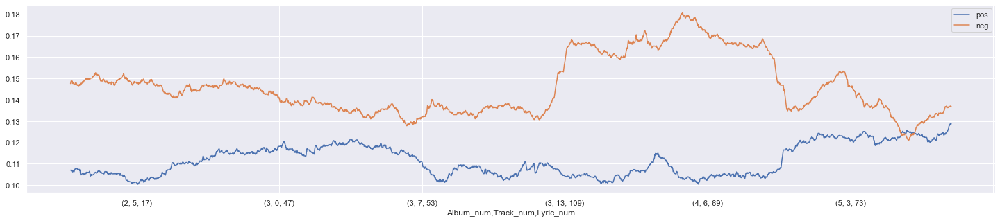

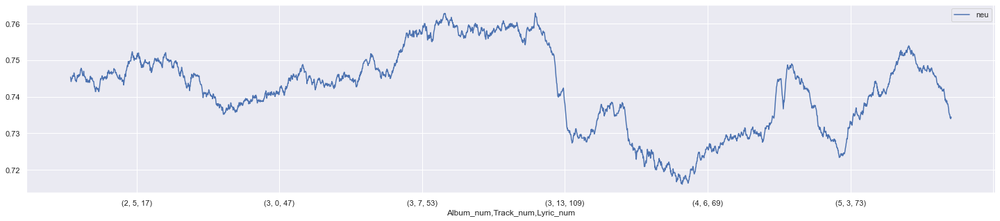

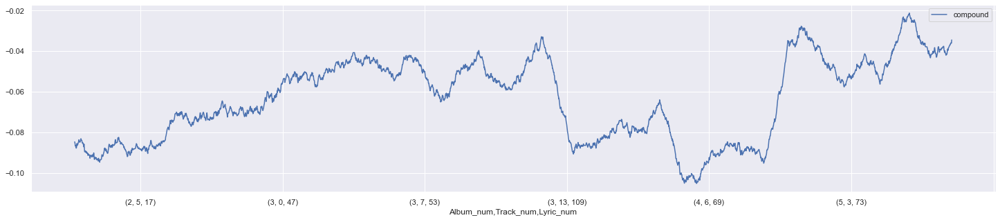

In [445]:
w = int(token_vader.shape[0] / 5)
token_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
token_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
token_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

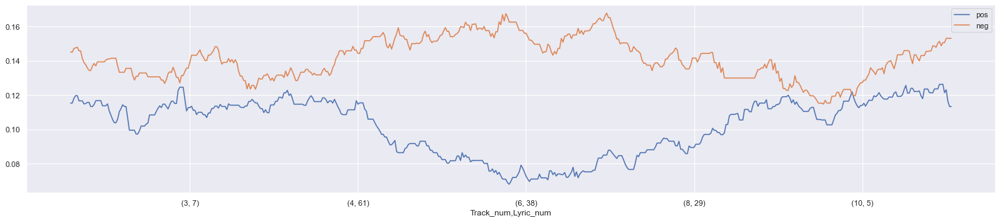

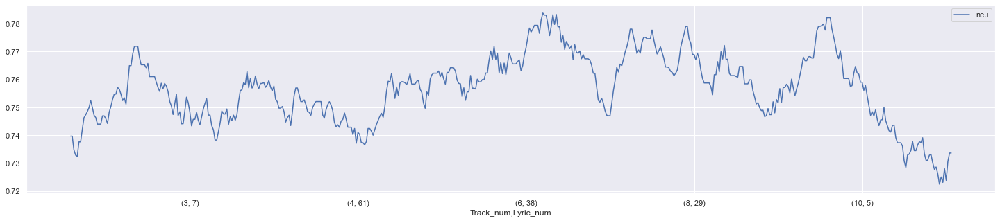

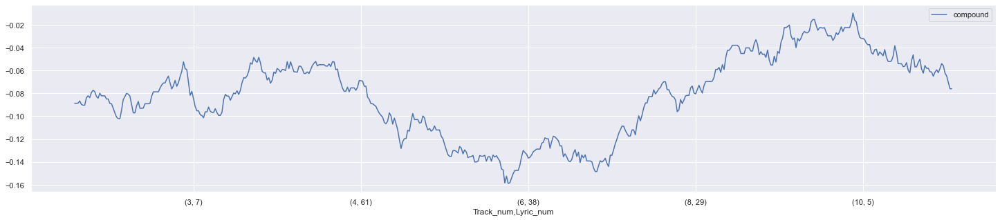

In [446]:
w = int(rtj_vader.shape[0] / 5)
rtj_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
rtj_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
rtj_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

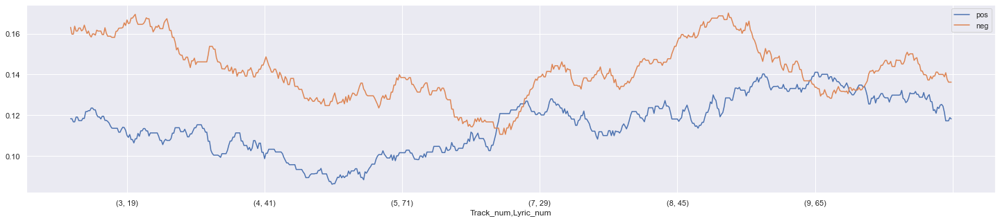

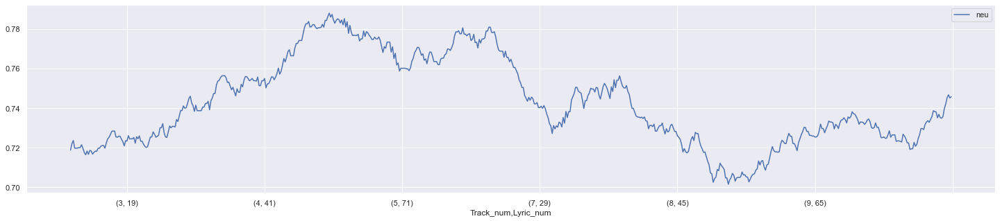

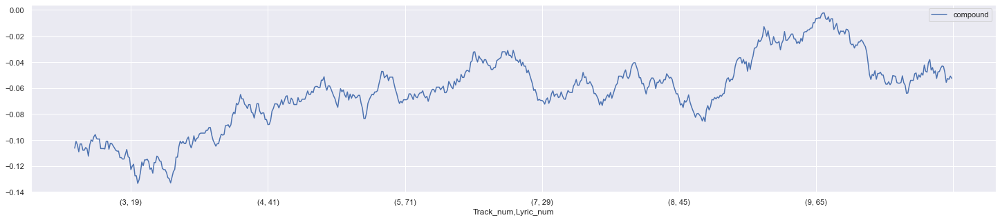

In [447]:
w = int(rtj_2_vader.shape[0] / 5)
rtj_2_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
rtj_2_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
rtj_2_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

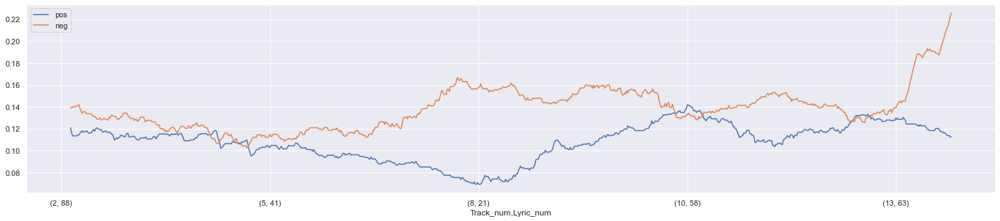

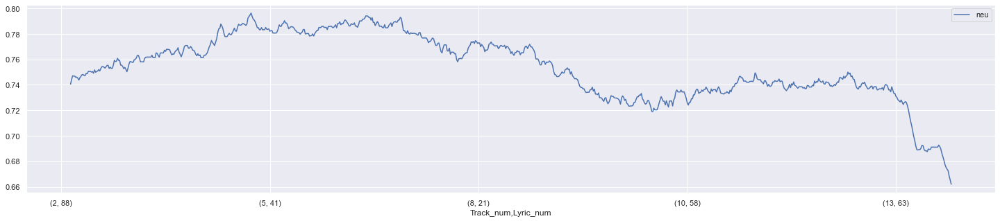

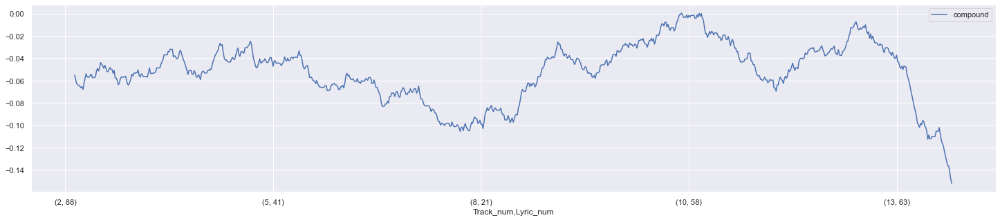

In [448]:
w = int(rtj_3_vader.shape[0] / 5)
rtj_3_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
rtj_3_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
rtj_3_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

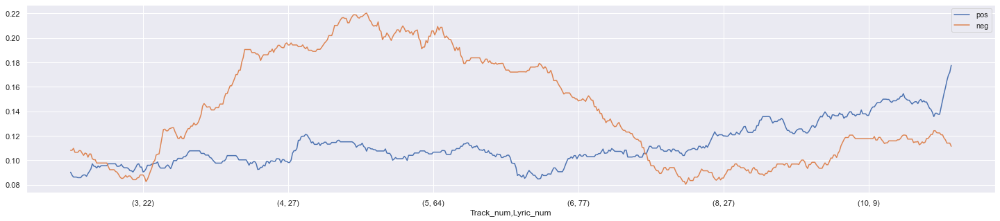

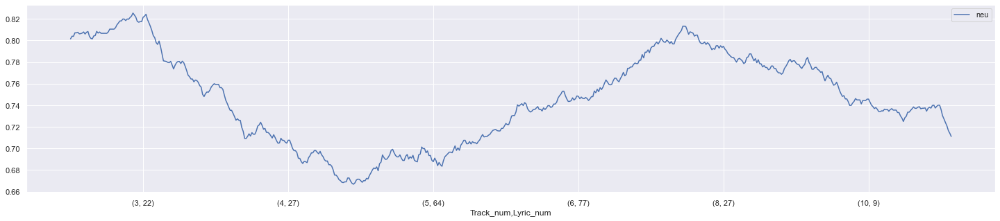

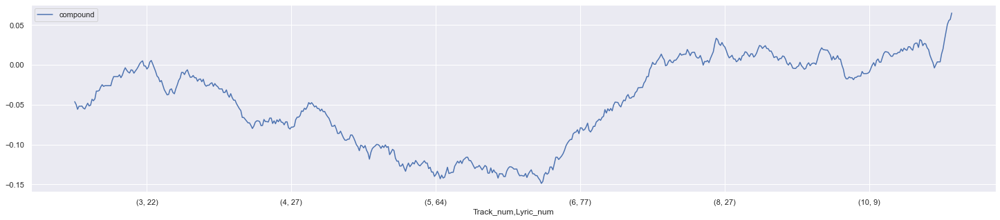

In [449]:
w = int(rtj_4_vader.shape[0] / 5)
rtj_4_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
rtj_4_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
rtj_4_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

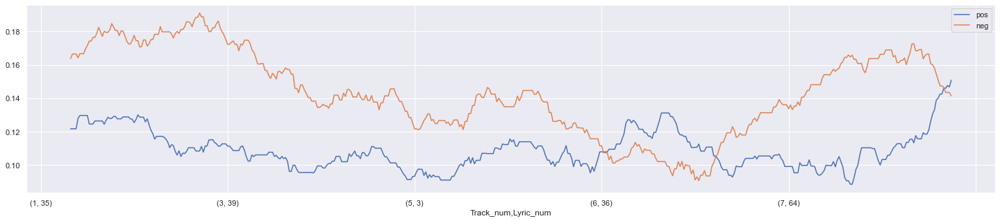

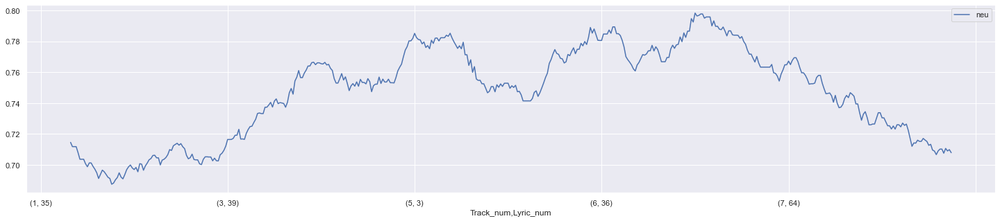

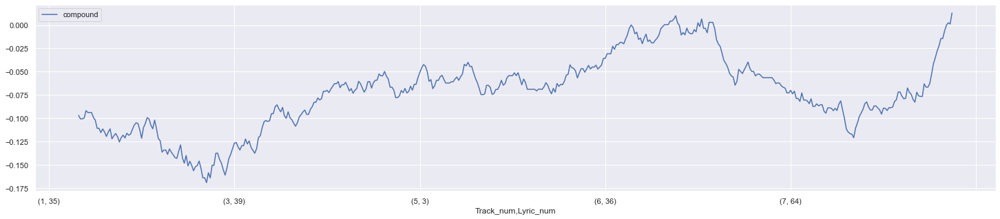

In [450]:
w = int(meow_vader.shape[0] / 5)
meow_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
meow_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
meow_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

## Album Heatmaps

In [451]:
rtj_tracks['track'] = rtj_tracks.index
rtj_2_tracks['track'] = rtj_2_tracks.index
rtj_3_tracks['track'] = rtj_3_tracks.index
rtj_4_tracks['track'] = rtj_4_tracks.index
meow_tracks['track'] = meow_tracks.index

In [452]:
rtj_tracks["album"] = ["Run the Jewels"]*len(rtj_tracks)
rtj_2_tracks["album"] = ["Run the Jewels 2"]*len(rtj_2_tracks)
rtj_3_tracks["album"] = ["Run the Jewels 3"]*len(rtj_3_tracks)
rtj_4_tracks["album"] = ["RTJ4"]*len(rtj_4_tracks)
meow_tracks["album"] = ["Meow the Jewels"]*len(meow_tracks)

In [453]:
rtj_track_num = ((np.asarray(rtj_tracks["track"])).reshape(1,len(rtj_tracks)))
rtj_polarity = ((np.asarray(rtj_tracks["polarity"])).reshape(1,len(rtj_tracks)))

rtj_2_track_num = ((np.asarray(rtj_2_tracks["track"])).reshape(1,len(rtj_2_tracks)))
rtj_2_polarity = ((np.asarray(rtj_2_tracks["polarity"])).reshape(1,len(rtj_2_tracks)))

rtj_3_track_num = ((np.asarray(rtj_3_tracks["track"])).reshape(1,len(rtj_3_tracks)))
rtj_3_polarity = ((np.asarray(rtj_3_tracks["polarity"])).reshape(1,len(rtj_3_tracks)))

rtj_4_track_num = ((np.asarray(rtj_4_tracks["track"])).reshape(1,len(rtj_4_tracks)))
rtj_4_polarity = ((np.asarray(rtj_4_tracks["polarity"])).reshape(1,len(rtj_4_tracks)))

meow_track_num = ((np.asarray(meow_tracks["track"])).reshape(1,len(meow_tracks)))
meow_polarity = ((np.asarray(meow_tracks["polarity"])).reshape(1,len(meow_tracks)))

In [454]:
result = rtj_tracks.pivot(index = 'track', columns = "album", values='polarity')
result_2 = rtj_2_tracks.pivot(index = 'track', columns = "album", values='polarity')
result_3 = rtj_3_tracks.pivot(index = 'track', columns = "album", values='polarity')
result_4 = rtj_4_tracks.pivot(index = 'track', columns = "album", values='polarity')
result_meow = meow_tracks.pivot(index = 'track', columns = "album", values='polarity')

In [455]:
labels = (np.asarray(["{0} \n {1:.5f}".format(symb,value)
                     for symb, value in zip(rtj_track_num.flatten(),
                                           rtj_polarity.flatten())])).reshape(1,len(rtj_tracks))

labels_2 = (np.asarray(["{0} \n {1:.5f}".format(symb,value)
                     for symb, value in zip(rtj_2_track_num.flatten(),
                                           rtj_2_polarity.flatten())])).reshape(1,len(rtj_2_tracks))

labels_3 = (np.asarray(["{0} \n {1:.5f}".format(symb,value)
                     for symb, value in zip(rtj_3_track_num.flatten(),
                                           rtj_3_polarity.flatten())])).reshape(1,len(rtj_3_tracks))

labels_4 = (np.asarray(["{0} \n {1:.5f}".format(symb,value)
                     for symb, value in zip(rtj_4_track_num.flatten(),
                                           rtj_4_polarity.flatten())])).reshape(1,len(rtj_4_tracks))

labels_meow = (np.asarray(["{0} \n {1:.5f}".format(symb,value)
                     for symb, value in zip(meow_track_num.flatten(),
                                           meow_polarity.flatten())])).reshape(1,len(meow_tracks))

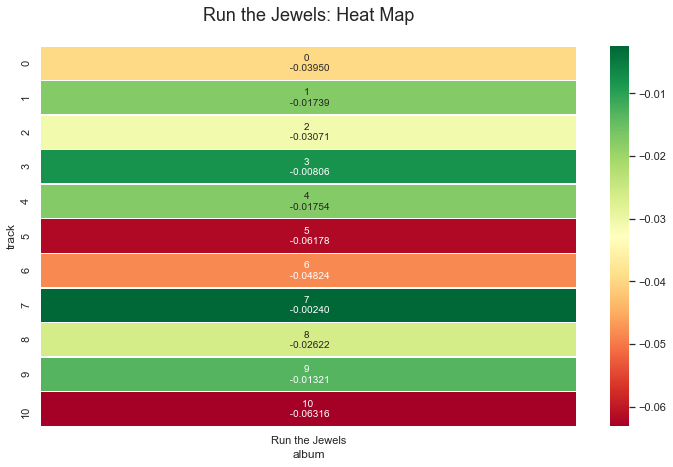

In [456]:
fig, ax = plt.subplots(figsize = (12,7))
title = "Run the Jewels: Heat Map"

plt.title(title,fontsize = 18)
ttl = ax.title
ttl.set_position([.5,1.05])
ax.set_xticks([])
ax.set_yticks([])
ax.axis("on")
sns.heatmap(data= result, fmt="", cmap="RdYlGn", linewidths=.5, ax=ax, annot=labels.T)
plt.show()

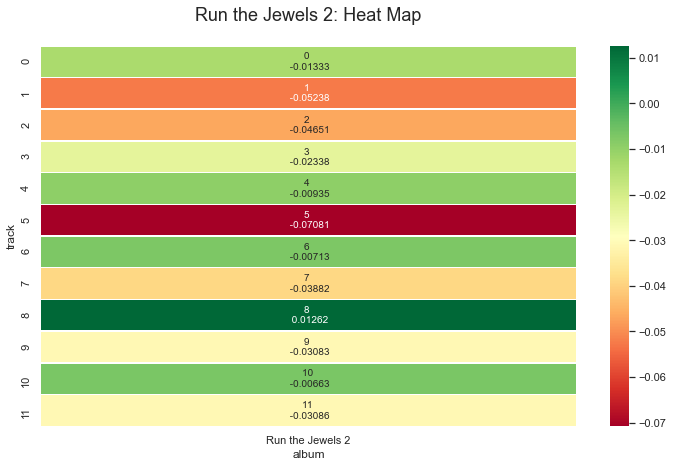

In [457]:
fig, ax = plt.subplots(figsize = (12,7))
title = "Run the Jewels 2: Heat Map"

plt.title(title,fontsize = 18)
ttl = ax.title
ttl.set_position([.5,1.05])
ax.set_xticks([])
ax.set_yticks([])
ax.axis("on")
sns.heatmap(data= result_2, fmt="", cmap="RdYlGn", linewidths=.5, ax=ax, annot=labels_2.T)
plt.show()

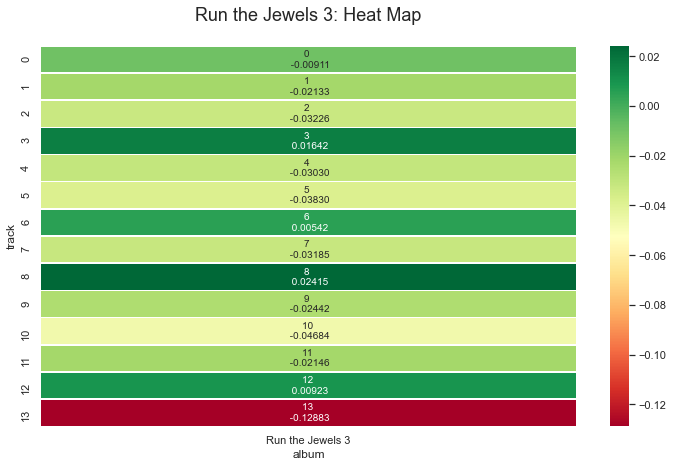

In [458]:
fig, ax = plt.subplots(figsize = (12,7))
title = "Run the Jewels 3: Heat Map"

plt.title(title,fontsize = 18)
ttl = ax.title
ttl.set_position([.5,1.05])
ax.set_xticks([])
ax.set_yticks([])
ax.axis("on")
sns.heatmap(data= result_3, fmt="", cmap="RdYlGn", linewidths=.5, ax=ax, annot=labels_3.T)
plt.show()

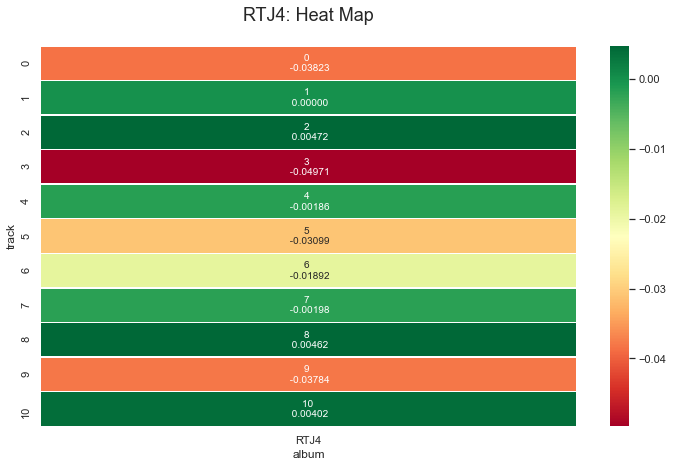

In [459]:
fig, ax = plt.subplots(figsize = (12,7))
title = "RTJ4: Heat Map"

plt.title(title,fontsize = 18)
ttl = ax.title
ttl.set_position([.5,1.05])
ax.set_xticks([])
ax.set_yticks([])
ax.axis("on")
sns.heatmap(data= result_4, fmt="", cmap="RdYlGn", linewidths=.5, ax=ax, annot=labels_4.T)
plt.show()

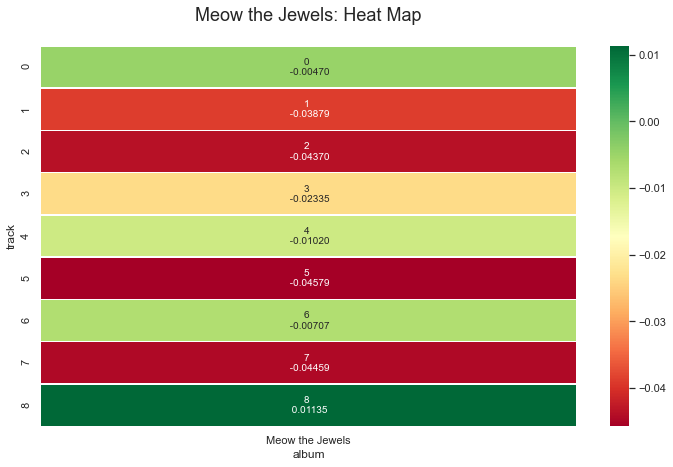

In [460]:
fig, ax = plt.subplots(figsize = (12,7))
title = "Meow the Jewels: Heat Map"

plt.title(title,fontsize = 18)
ttl = ax.title
ttl.set_position([.5,1.05])
ax.set_xticks([])
ax.set_yticks([])
ax.axis("on")
sns.heatmap(data= result_meow, fmt="", cmap="RdYlGn", linewidths=.5, ax=ax, annot=labels_meow.T)
plt.show()

In [461]:
heat_map = [result,result_2,result_3,result_4,result_meow]

In [462]:
heat_map = pd.concat(heat_map,join='outer', axis=1)

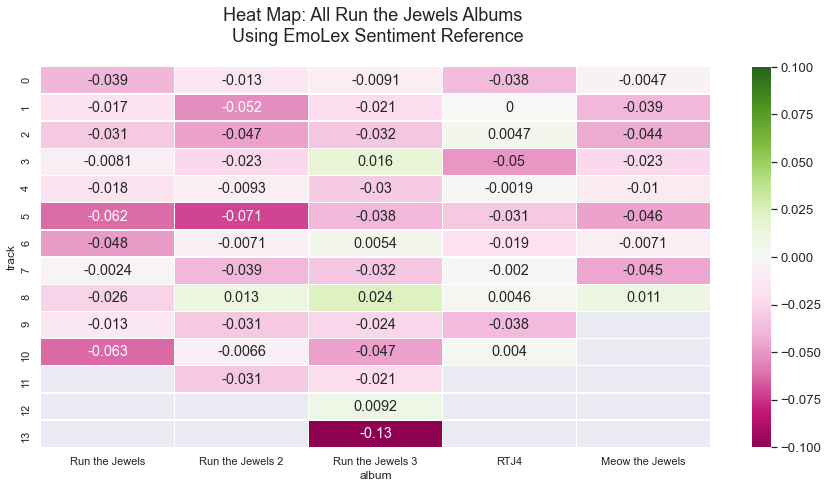

In [463]:
fig, ax = plt.subplots()
title = "Heat Map: All Run the Jewels Albums \n Using EmoLex Sentiment Reference"
plt.title(title,fontsize = 18)
ttl = ax.title
ttl.set_position([.5,1.05])
fig.set_size_inches(15, 7)
ax.set_xticks([])
ax.set_yticks([])
ax.axis("on")
sns.set(font_scale=1.2)
#pal = sns.light_palette("red", as_cmap = True, reverse = True)
sns.heatmap(heat_map,linewidths=0.40, ax=ax, annot=True, cmap="PiYG", vmin=-.1, vmax=.1) # , cmap = pal #cmap="RdYlGn"
sns.set_style('ticks')
plt.show()

In [464]:
hm_1 = TOKEN_rtj.groupby(OHCO_1a[0:3])[emo_cols].mean()
hm_2 = TOKEN_rtj_2.groupby(OHCO_1a[0:3])[emo_cols].mean()
hm_3 = TOKEN_rtj_3.groupby(OHCO_1a[0:3])[emo_cols].mean()
hm_4 = TOKEN_rtj_4.groupby(OHCO_1a[0:3])[emo_cols].mean()
hm_meow = TOKEN_meow.groupby(OHCO_1a[0:3])[emo_cols].mean()

In [465]:
hm_1 = (hm_1.pivot_table(index=['Album_num','Track_num','Lyric_num'])
       .reset_index()
       .rename_axis(None, axis=1))

hm_2 = (hm_2.pivot_table(index=['Album_num','Track_num','Lyric_num'])
       .reset_index()
       .rename_axis(None, axis=1))

hm_3 = (hm_3.pivot_table(index=['Album_num','Track_num','Lyric_num'])
       .reset_index()
       .rename_axis(None, axis=1))

hm_4 = (hm_4.pivot_table(index=['Album_num','Track_num','Lyric_num'])
       .reset_index()
       .rename_axis(None, axis=1))

hm_meow = (hm_meow.pivot_table(index=['Album_num','Track_num','Lyric_num'])
       .reset_index()
       .rename_axis(None, axis=1))


In [466]:
hm_1["album, track_num"] = hm_1['Album_num'].astype(str) + ", " + hm_1['Track_num'].astype(str)
hm_2["album, track_num"] = hm_2['Album_num'].astype(str) + ", " + hm_2['Track_num'].astype(str)
hm_3["album, track_num"] = hm_3['Album_num'].astype(str) + ", " + hm_3['Track_num'].astype(str)
hm_4["album, track_num"] = hm_4['Album_num'].astype(str) + ", " + hm_4['Track_num'].astype(str)
hm_meow["album, track_num"] = hm_meow['Album_num'].astype(str) + ", " + hm_meow['Track_num'].astype(str)

In [467]:
hm_1 = hm_1.reset_index().pivot(columns='album, track_num',index='Lyric_num',values='polarity')
hm_2 = hm_2.reset_index().pivot(columns='album, track_num',index='Lyric_num',values='polarity')
hm_3 = hm_3.reset_index().pivot(columns='album, track_num',index='Lyric_num',values='polarity')
hm_4 = hm_4.reset_index().pivot(columns='album, track_num',index='Lyric_num',values='polarity')
hm_meow = hm_meow.reset_index().pivot(columns='album, track_num',index='Lyric_num',values='polarity')


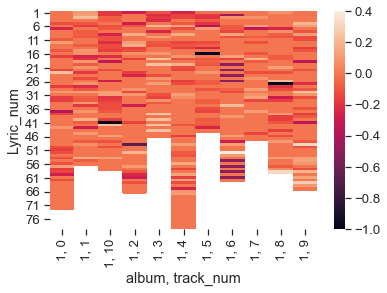

In [468]:
sns.heatmap(hm_1)

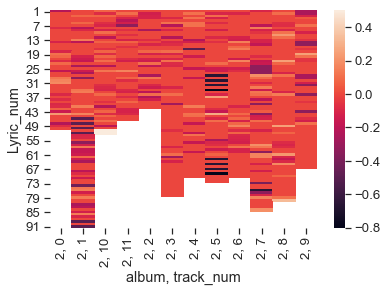

In [469]:
sns.heatmap(hm_2)

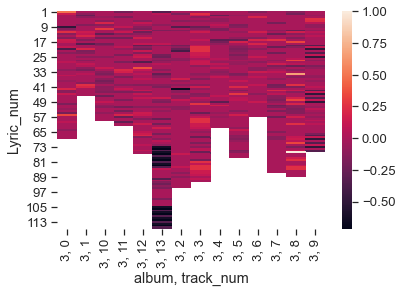

In [470]:
sns.heatmap(hm_3)

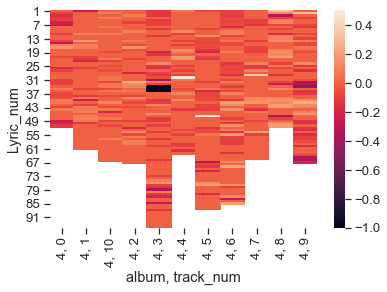

In [471]:
sns.heatmap(hm_4)

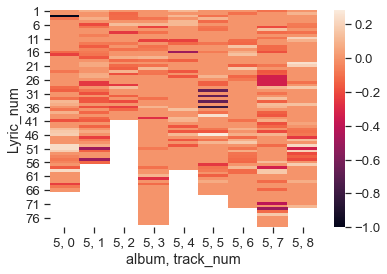

In [472]:
sns.heatmap(hm_meow)

In [473]:
heat_map_corpus = [hm_1,hm_2,hm_3,hm_4,hm_meow]

In [474]:
heat_map_corpus = pd.concat(heat_map_corpus,join='outer', axis=1)

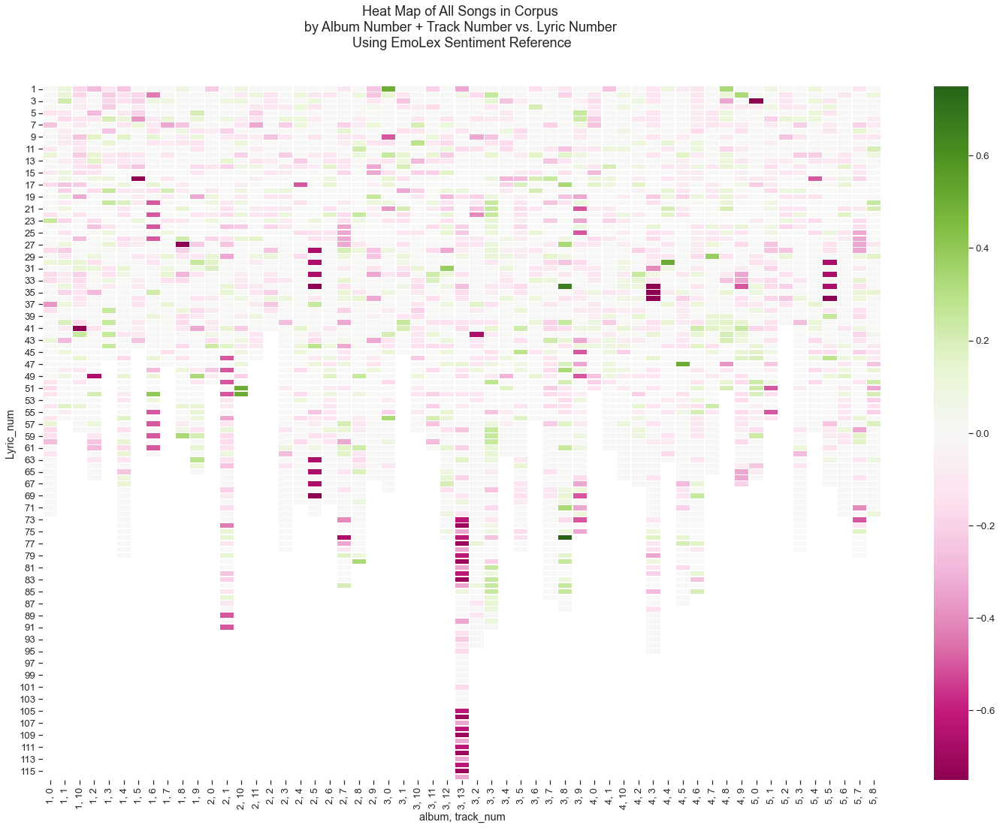

In [475]:
fig, ax = plt.subplots()
title = "Heat Map of All Songs in Corpus \nby Album Number + Track Number vs. Lyric Number \nUsing EmoLex Sentiment Reference"
plt.title(title,fontsize = 18)
ttl = ax.title
ttl.set_position([.5,1.05])
fig.set_size_inches(25, 17)
ax.set_xticks([])
ax.set_yticks([])
ax.axis("on")
sns.set(font_scale=1.2)
#pal = sns.light_palette("red", as_cmap = True, reverse = True)
sns.heatmap(heat_map_corpus,linewidths=0.40, ax=ax, annot=False, cmap="PiYG", vmin=-.75, vmax=.75) # , cmap = pal #cmap="RdYlGn"
sns.set_style('ticks')
plt.show()

## Repeat Sentiment Analysis using Bing Liu Opinion Lexicon

In [476]:
TOKEN_bing = TOKEN.copy(deep=True)
TOKEN_rtj_bing = TOKEN_rtj.copy(deep=True)
TOKEN_rtj_2_bing = TOKEN_rtj_2.copy(deep=True)
TOKEN_rtj_3_bing = TOKEN_rtj_3.copy(deep=True)
TOKEN_rtj_4_bing = TOKEN_rtj_4.copy(deep=True)
TOKEN_meow_bing = TOKEN_meow.copy(deep=True)
bing_emo = emo_bing

In [477]:
TOKEN_bing = opinion_score_df(TOKEN_bing)
TOKEN_rtj_bing = opinion_score_df(TOKEN_rtj_bing)
TOKEN_rtj_2_bing = opinion_score_df(TOKEN_rtj_2_bing)
TOKEN_rtj_3_bing = opinion_score_df(TOKEN_rtj_3_bing)
TOKEN_rtj_4_bing = opinion_score_df(TOKEN_rtj_4_bing)
TOKEN_meow_bing = opinion_score_df(TOKEN_meow_bing)   ###################################### 

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A

In [478]:
TOKEN_bing['bing_polarity'] = TOKEN_bing.positive + TOKEN_bing.negative
TOKEN_rtj_bing['bing_polarity'] = TOKEN_rtj_bing.positive + TOKEN_rtj_bing.negative
TOKEN_rtj_2_bing['bing_polarity'] = TOKEN_rtj_2_bing.positive + TOKEN_rtj_2_bing.negative
TOKEN_rtj_3_bing['bing_polarity'] = TOKEN_rtj_3_bing.positive + TOKEN_rtj_3_bing.negative
TOKEN_rtj_4_bing['bing_polarity'] = TOKEN_rtj_4_bing.positive + TOKEN_rtj_4_bing.negative
TOKEN_meow_bing['bing_polarity'] = TOKEN_meow_bing.positive + TOKEN_meow_bing.negative

In [479]:
emo_bing_cols = "positive negative bing_polarity".split()

In [480]:
rtj_bing_tracks = TOKEN_rtj_bing.groupby(OHCO_1a[1:2])[emo_bing_cols].mean()
rtj_2_bing_tracks = TOKEN_rtj_2_bing.groupby(OHCO_1a[1:2])[emo_bing_cols].mean()
rtj_3_bing_tracks = TOKEN_rtj_3_bing.groupby(OHCO_1a[1:2])[emo_bing_cols].mean()
rtj_4_bing_tracks = TOKEN_rtj_4_bing.groupby(OHCO_1a[1:2])[emo_bing_cols].mean()
meow_bing_tracks = TOKEN_meow_bing.groupby(OHCO_1a[1:2])[emo_bing_cols].mean()
rtj_bing_albums = TOKEN_bing.groupby(OHCO_1a[0:1])[emo_bing_cols].mean()

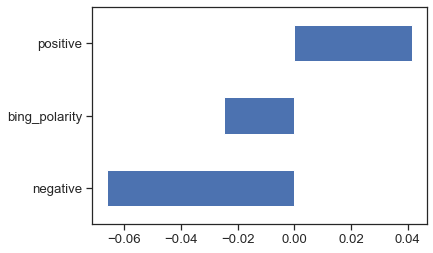

In [481]:
TOKEN_bing[emo_bing_cols].mean().sort_values().plot.barh()

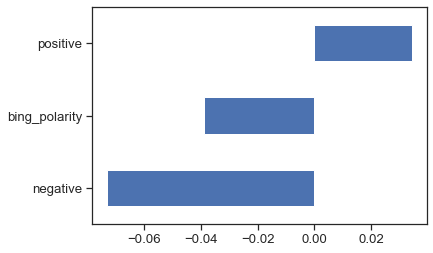

In [482]:
TOKEN_rtj_bing[emo_bing_cols].mean().sort_values().plot.barh()

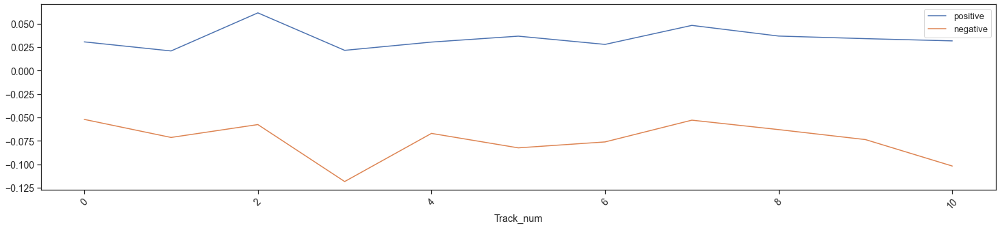

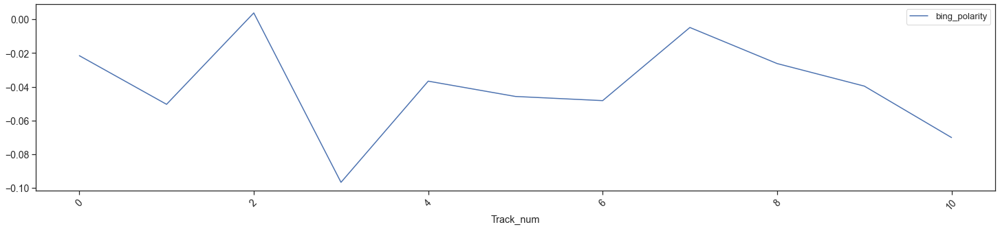

In [483]:
plot_sentiments(rtj_bing_tracks, ['positive','negative'])
plot_sentiments(rtj_bing_tracks, ['bing_polarity'])

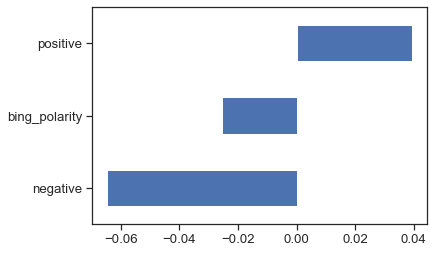

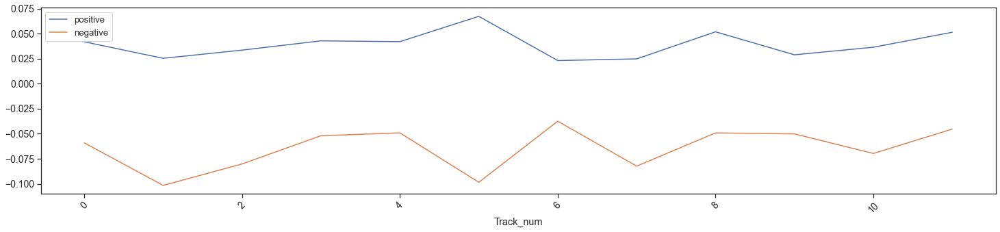

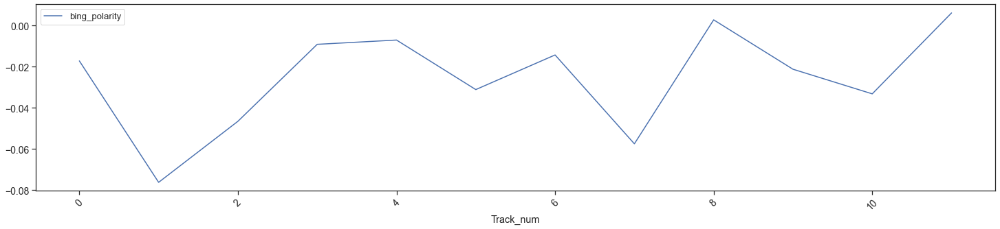

In [484]:
TOKEN_rtj_2_bing[emo_bing_cols].mean().sort_values().plot.barh()
plot_sentiments(rtj_2_bing_tracks, ['positive','negative'])
plot_sentiments(rtj_2_bing_tracks, ['bing_polarity'])

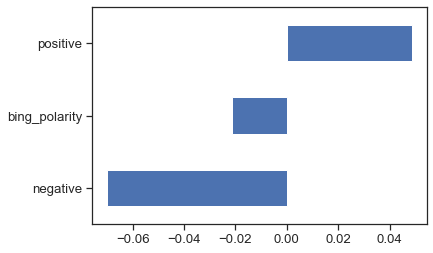

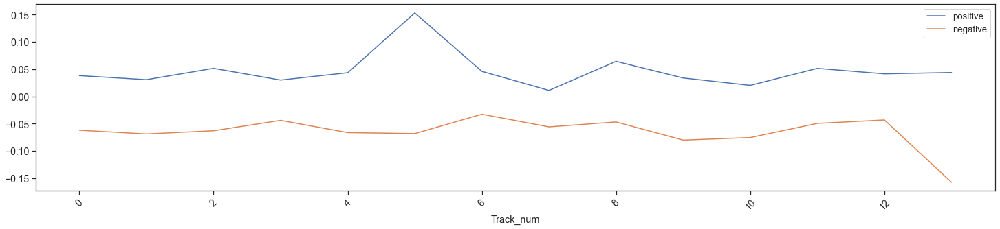

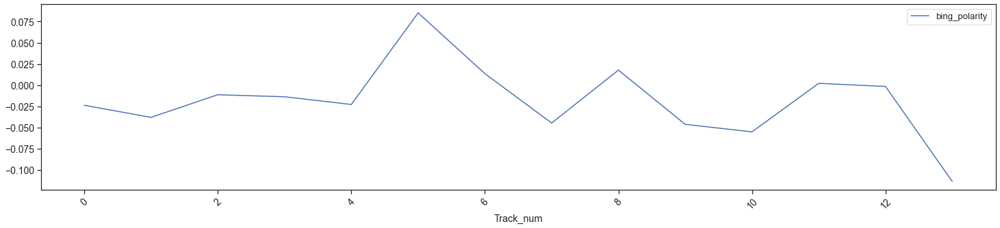

In [485]:
TOKEN_rtj_3_bing[emo_bing_cols].mean().sort_values().plot.barh()
plot_sentiments(rtj_3_bing_tracks, ['positive','negative'])
plot_sentiments(rtj_3_bing_tracks, ['bing_polarity'])

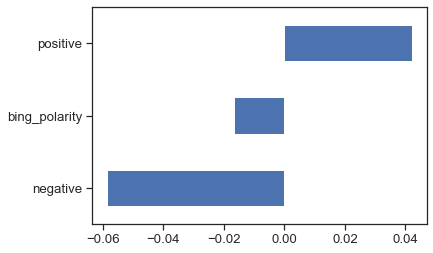

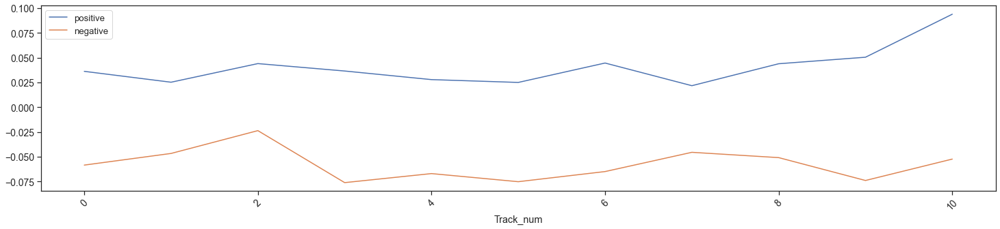

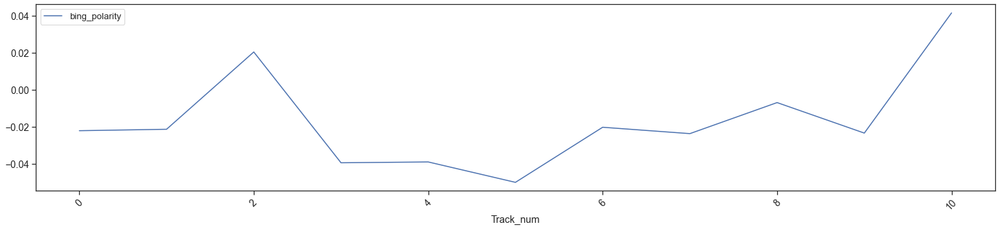

In [486]:
TOKEN_rtj_4_bing[emo_bing_cols].mean().sort_values().plot.barh()
plot_sentiments(rtj_4_bing_tracks, ['positive','negative'])
plot_sentiments(rtj_4_bing_tracks, ['bing_polarity'])

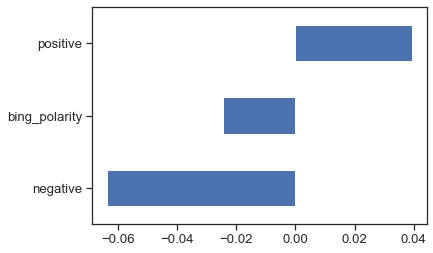

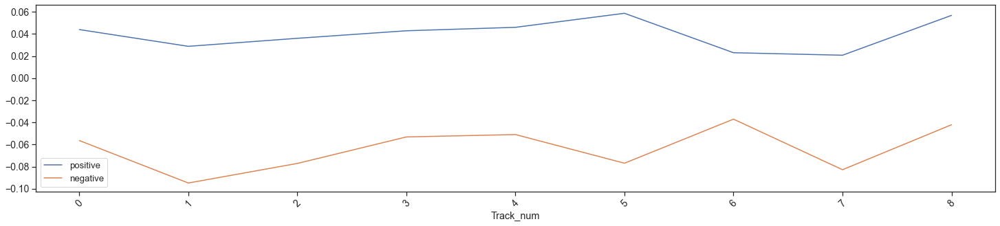

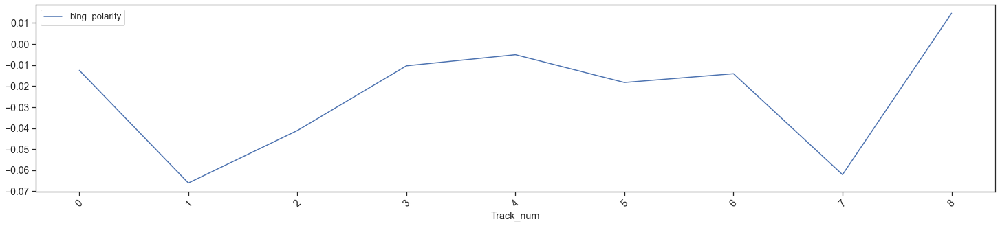

In [487]:
TOKEN_meow_bing[emo_bing_cols].mean().sort_values().plot.barh()
plot_sentiments(meow_bing_tracks, ['positive','negative'])
plot_sentiments(meow_bing_tracks, ['bing_polarity'])

## VADER (using Bing Liu)

In [488]:
TOKEN_rtj_bing_lyr = TOKEN_rtj_bing.groupby(OHCO_1a[1:3])[emo_bing_cols].mean()
TOKEN_rtj_2_bing_lyr = TOKEN_rtj_2_bing.groupby(OHCO_1a[1:3])[emo_bing_cols].mean()
TOKEN_rtj_3_bing_lyr = TOKEN_rtj_3_bing.groupby(OHCO_1a[1:3])[emo_bing_cols].mean()
TOKEN_rtj_4_bing_lyr = TOKEN_rtj_4_bing.groupby(OHCO_1a[1:3])[emo_bing_cols].mean()
TOKEN_meow_bing_lyr = TOKEN_meow_bing.groupby(OHCO_1a[1:3])[emo_bing_cols].mean()

TOKEN_rtj_bing_lyr['lyr_str'] = TOKEN_rtj_bing.groupby(OHCO_1a[1:3]).Token.apply(lambda x: x.str.cat(sep=' '))
TOKEN_rtj_bing_lyr['html_str'] = TOKEN_rtj_bing.groupby(OHCO_1a[1:3]).html.apply(lambda x: x.str.cat(sep=' '))

TOKEN_rtj_2_bing_lyr['lyr_str'] = TOKEN_rtj_2_bing.groupby(OHCO_1a[1:3]).Token.apply(lambda x: x.str.cat(sep=' '))
TOKEN_rtj_2_bing_lyr['html_str'] = TOKEN_rtj_2_bing.groupby(OHCO_1a[1:3]).html.apply(lambda x: x.str.cat(sep=' '))

TOKEN_rtj_3_bing_lyr['lyr_str'] = TOKEN_rtj_3_bing.groupby(OHCO_1a[1:3]).Token.apply(lambda x: x.str.cat(sep=' '))
TOKEN_rtj_3_bing_lyr['html_str'] = TOKEN_rtj_3_bing.groupby(OHCO_1a[1:3]).html.apply(lambda x: x.str.cat(sep=' '))

TOKEN_rtj_4_bing_lyr['lyr_str'] = TOKEN_rtj_4_bing.groupby(OHCO_1a[1:3]).Token.apply(lambda x: x.str.cat(sep=' '))
TOKEN_rtj_4_bing_lyr['html_str'] = TOKEN_rtj_4_bing.groupby(OHCO_1a[1:3]).html.apply(lambda x: x.str.cat(sep=' '))

TOKEN_meow_bing_lyr['lyr_str'] = TOKEN_meow_bing.groupby(OHCO_1a[1:3]).Token.apply(lambda x: x.str.cat(sep=' '))
TOKEN_meow_bing_lyr['html_str'] = TOKEN_meow_bing.groupby(OHCO_1a[1:3]).html.apply(lambda x: x.str.cat(sep=' '))

In [489]:
rtj_vader_cols_bing = TOKEN_rtj_bing_lyr.lyr_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
rtj_vader_bing = pd.concat([TOKEN_rtj_bing_lyr, rtj_vader_cols_bing], axis=1)

rtj_2_vader_cols_bing = TOKEN_rtj_2_bing_lyr.lyr_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
rtj_2_vader_bing = pd.concat([TOKEN_rtj_2_bing_lyr, rtj_2_vader_cols_bing], axis=1)

rtj_3_vader_cols_bing = TOKEN_rtj_3_bing_lyr.lyr_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
rtj_3_vader_bing = pd.concat([TOKEN_rtj_3_bing_lyr, rtj_3_vader_cols_bing], axis=1)

rtj_4_vader_cols_bing = TOKEN_rtj_4_bing_lyr.lyr_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
rtj_4_vader_bing = pd.concat([TOKEN_rtj_4_bing_lyr, rtj_4_vader_cols_bing], axis=1)

meow_vader_cols_bing = TOKEN_meow_bing_lyr.lyr_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
meow_vader_bing = pd.concat([TOKEN_meow_bing_lyr, meow_vader_cols_bing], axis=1)

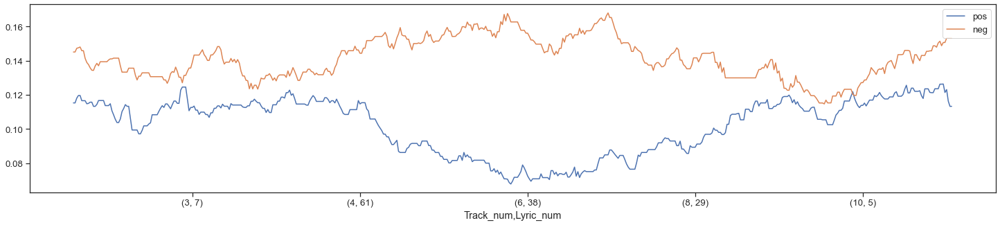

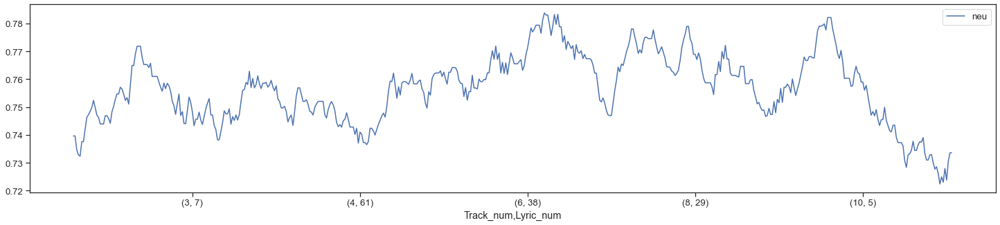

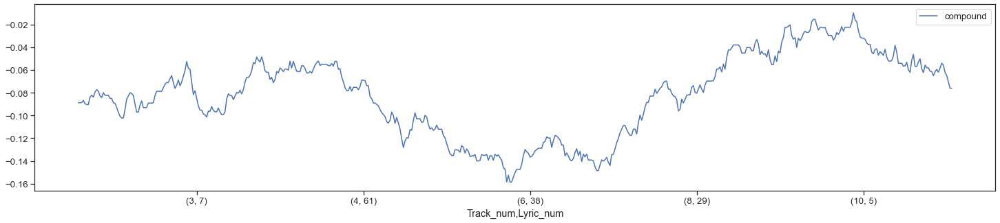

In [490]:
w = int(rtj_vader_bing.shape[0] / 5)
rtj_vader_bing[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
rtj_vader_bing[['neu']].rolling(w).mean().plot(figsize=(25,5))
rtj_vader_bing[['compound']].rolling(w).mean().plot(figsize=(25,5))

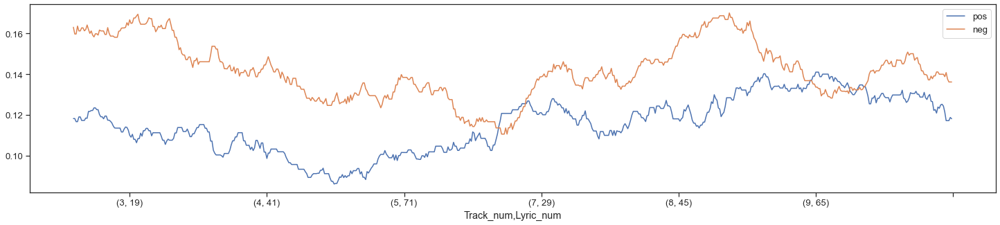

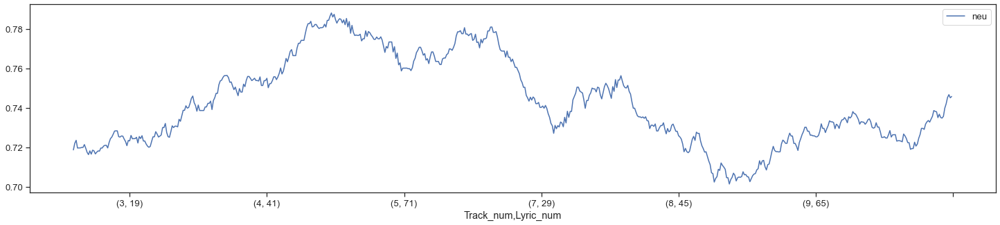

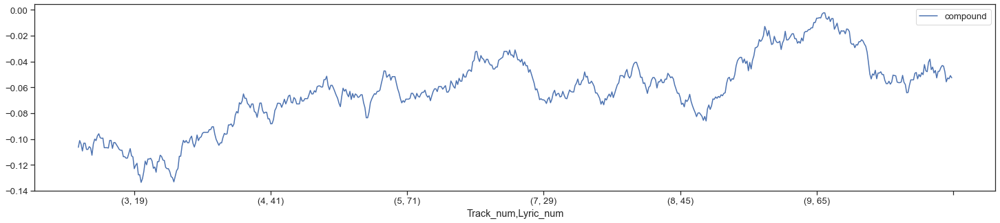

In [491]:
w = int(rtj_2_vader_bing.shape[0] / 5)
rtj_2_vader_bing[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
rtj_2_vader_bing[['neu']].rolling(w).mean().plot(figsize=(25,5))
rtj_2_vader_bing[['compound']].rolling(w).mean().plot(figsize=(25,5))

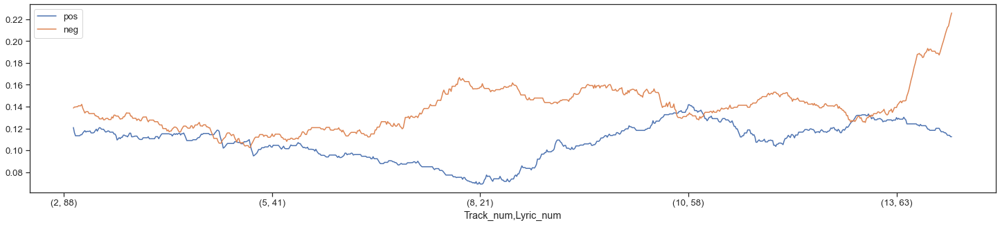

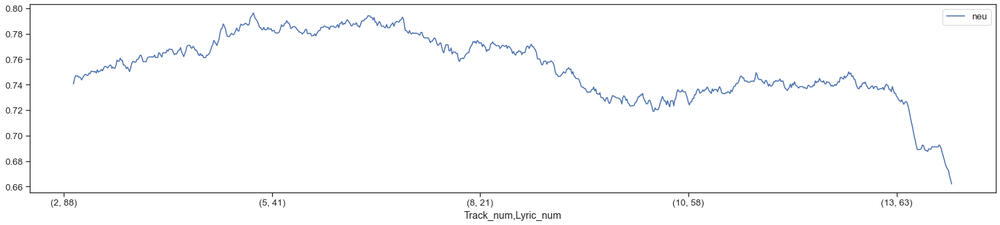

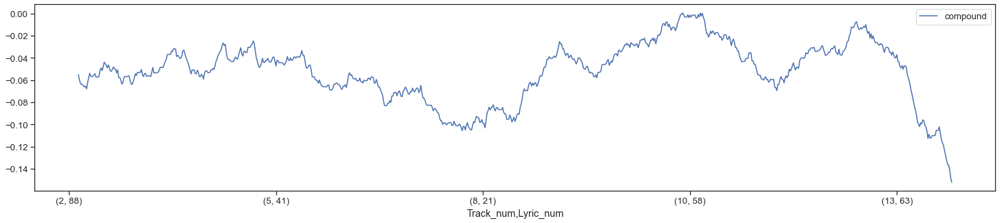

In [492]:
w = int(rtj_3_vader_bing.shape[0] / 5)
rtj_3_vader_bing[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
rtj_3_vader_bing[['neu']].rolling(w).mean().plot(figsize=(25,5))
rtj_3_vader_bing[['compound']].rolling(w).mean().plot(figsize=(25,5))

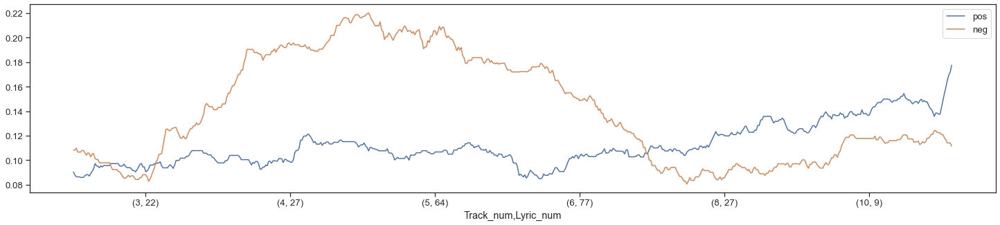

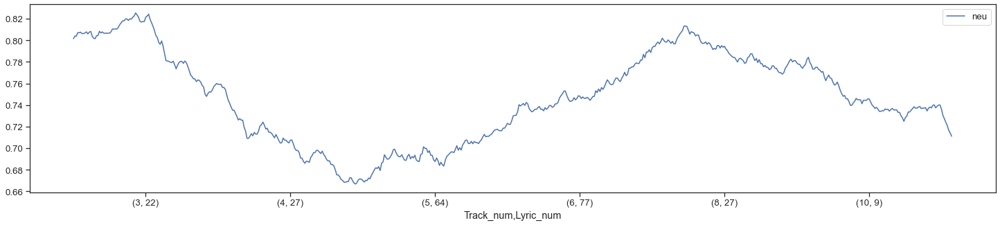

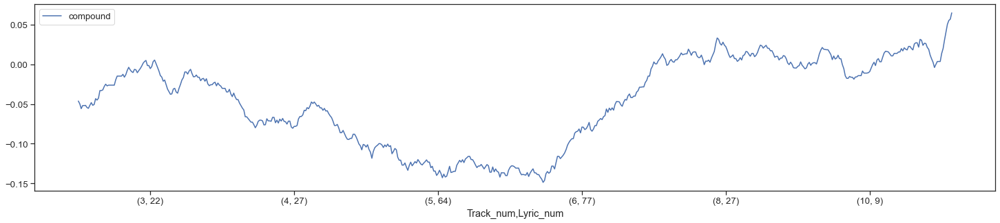

In [493]:
w = int(rtj_4_vader_bing.shape[0] / 5)
rtj_4_vader_bing[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
rtj_4_vader_bing[['neu']].rolling(w).mean().plot(figsize=(25,5))
rtj_4_vader_bing[['compound']].rolling(w).mean().plot(figsize=(25,5))

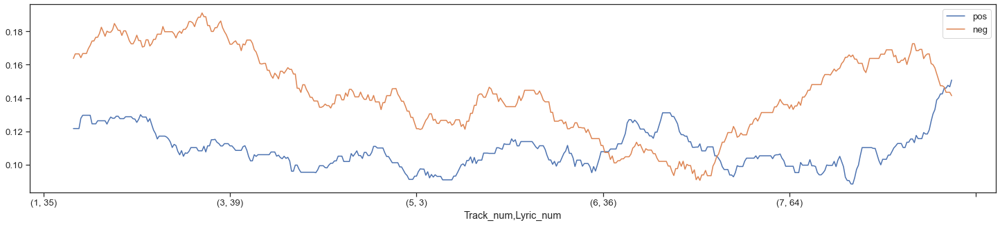

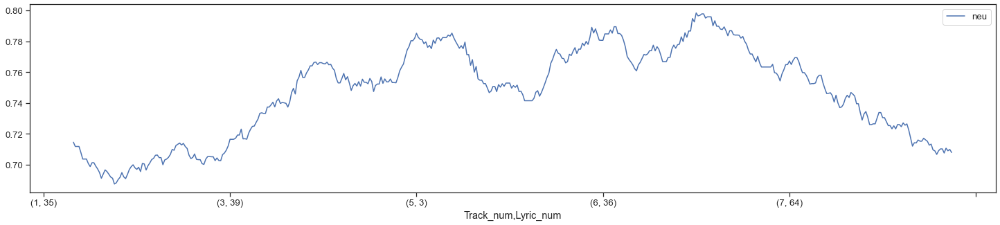

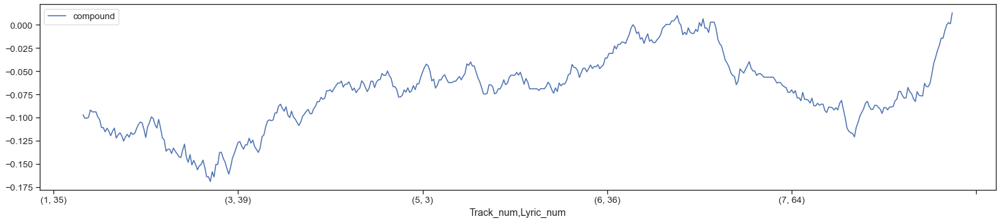

In [494]:
w = int(meow_vader_bing.shape[0] / 5)
meow_vader_bing[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
meow_vader_bing[['neu']].rolling(w).mean().plot(figsize=(25,5))
meow_vader_bing[['compound']].rolling(w).mean().plot(figsize=(25,5))

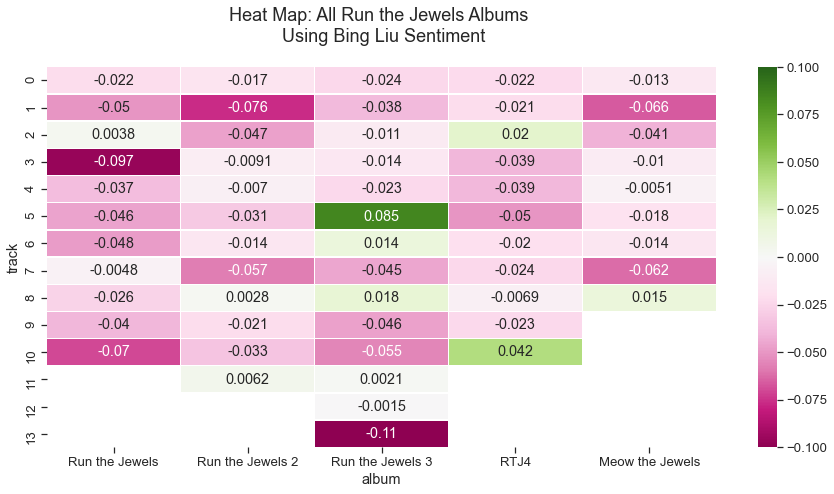

In [495]:
rtj_bing_tracks['track'] = rtj_bing_tracks.index
rtj_2_bing_tracks['track'] = rtj_2_bing_tracks.index
rtj_3_bing_tracks['track'] = rtj_3_bing_tracks.index
rtj_4_bing_tracks['track'] = rtj_4_bing_tracks.index
meow_bing_tracks['track'] = meow_bing_tracks.index

rtj_bing_tracks["album"] = ["Run the Jewels"]*len(rtj_bing_tracks)
rtj_2_bing_tracks["album"] = ["Run the Jewels 2"]*len(rtj_2_bing_tracks)
rtj_3_bing_tracks["album"] = ["Run the Jewels 3"]*len(rtj_3_bing_tracks)
rtj_4_bing_tracks["album"] = ["RTJ4"]*len(rtj_4_bing_tracks)
meow_bing_tracks["album"] = ["Meow the Jewels"]*len(meow_bing_tracks)

rtj_track_num_bing = ((np.asarray(rtj_bing_tracks["track"])).reshape(1,len(rtj_bing_tracks)))
rtj_polarity_bing = ((np.asarray(rtj_bing_tracks["bing_polarity"])).reshape(1,len(rtj_bing_tracks)))

rtj_2_track_num_bing = ((np.asarray(rtj_2_bing_tracks["track"])).reshape(1,len(rtj_2_bing_tracks)))
rtj_2_polarity_bing = ((np.asarray(rtj_2_bing_tracks["bing_polarity"])).reshape(1,len(rtj_2_bing_tracks)))

rtj_3_track_num_bing = ((np.asarray(rtj_3_bing_tracks["track"])).reshape(1,len(rtj_3_bing_tracks)))
rtj_3_polarity_bing = ((np.asarray(rtj_3_bing_tracks["bing_polarity"])).reshape(1,len(rtj_3_bing_tracks)))

rtj_4_track_num_bing = ((np.asarray(rtj_4_bing_tracks["track"])).reshape(1,len(rtj_4_bing_tracks)))
rtj_4_polarity_bing = ((np.asarray(rtj_4_bing_tracks["bing_polarity"])).reshape(1,len(rtj_4_bing_tracks)))

meow_track_num_bing = ((np.asarray(meow_bing_tracks["track"])).reshape(1,len(meow_bing_tracks)))
meow_polarity_bing = ((np.asarray(meow_bing_tracks["bing_polarity"])).reshape(1,len(meow_bing_tracks)))

result_bing = rtj_bing_tracks.pivot(index = 'track', columns = "album", values='bing_polarity')
result_2_bing = rtj_2_bing_tracks.pivot(index = 'track', columns = "album", values='bing_polarity')
result_3_bing = rtj_3_bing_tracks.pivot(index = 'track', columns = "album", values='bing_polarity')
result_4_bing = rtj_4_bing_tracks.pivot(index = 'track', columns = "album", values='bing_polarity')
result_meow_bing = meow_bing_tracks.pivot(index = 'track', columns = "album", values='bing_polarity')


heat_map_bing = [result_bing,result_2_bing,result_3_bing,result_4_bing,result_meow_bing]

heat_map_bing = pd.concat(heat_map_bing,join='outer', axis=1)

fig, ax = plt.subplots()
title = "Heat Map: All Run the Jewels Albums \n Using Bing Liu Sentiment"
plt.title(title,fontsize = 18)
ttl = ax.title
ttl.set_position([.5,1.05])
fig.set_size_inches(15, 7)
ax.set_xticks([])
ax.set_yticks([])
ax.axis("on")
sns.set(font_scale=1.2)
#pal = sns.light_palette("red", as_cmap = True, reverse = True)
sns.heatmap(heat_map_bing,linewidths=0.40, ax=ax, annot=True, cmap="PiYG", vmin=-.1, vmax=.1) # , cmap = pal #cmap="RdYlGn"
sns.set_style('ticks')
plt.show()

We use the EmoLex sentiment method to break down a handful of Run the Jewels tracks.  First, we consider "Legend Has It", which is the band's only RIAA certified single (https://en.wikipedia.org/wiki/Run_the_Jewels_discography#As_lead_artist).  This song is the third track off *Run the Jewels 3* and has an EmoLex mean sentiment score of -0.032.

Then, we'll consider one of the most "positive" songs per our heat map (using EmoLex sentiment); here, we'll select the fourth track on *Run the Jewels 3* (recall, indexing starts at 0).  This is the song "Call Ticektron" and has a net mean sentiment of 0.016.  We'll also consider the most "postive" song per the same heat map using EmoLex sentiment; this is the ningth track on *Run the Jewels 3*, the song "2100".

Finally, we'll consider the most "negative" song, which happens to be the final track on *Run the Jewels 3*; this song is "A Report the Shareholderse / Kill Your Masters".  The net mean sentiment for this song is -0.13.  Cross-referencing this track against the Bing Liu sentiment, said track is also the "most negative", with a mean sentiment of -0.11.

### "Legend Has It"

In [496]:
legend_has_it = TOKEN_rtj_3.query("Track_num == 2").groupby(OHCO_1a[1:3])[emo_cols].mean()

In [497]:
IFrame("https://www.youtube.com/embed/QaPrQa3oMy0", width=980, height=551)

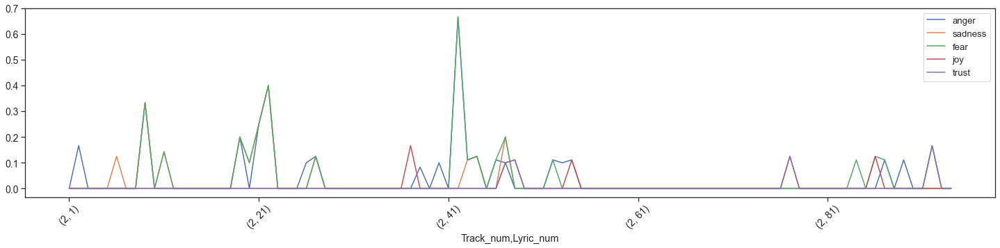

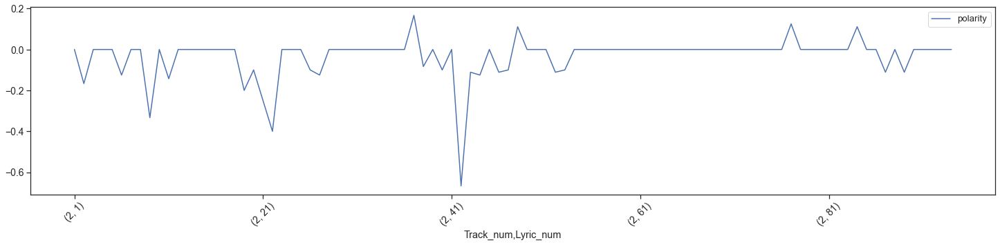

In [498]:
plot_sentiments(legend_has_it, ['anger','sadness','fear','joy','trust'])
plot_sentiments(legend_has_it, ['polarity'])

"Legend Has It" appears to have the most spikes associated with words registering as "fear".  At lyric 42, negative sentiments "anger", "disgust", and "fear" register as 0.667, for a mean polarity as -0.667.  We see that this is the lyric "villainous treacherous things", suggesting that our negative score makes sense as 2/3 of those words are considered negative.

Otherwise, this song is mostly shown as neutral.  Perhaps this apparent lack of negative sentiment (in constrast to other Run the Jewels songs) is among the reasons for this song being more successful as a single (including achieving said RIAA certification).  Throughout the song, there are occassional minor spikes of positive or negative sentiment, but ntohing so extreme as the lyric "villainous treacherous things".

It's noted that are lyric 92, there is an apparent spike in "trust" but that the net polarity is 0.  This is because there coincides a "disgust" sentiment; the corresponding lyric, which cancels out to a neutral sentiment, is: "Warranty plus for fu\*\*\*n sh\*t up", where "warranty" has a +1 sentiment and "sh\*t" has a -1 sentiment.  It is recognized that the profane term "fu\*\*\*n" is not present in the sentiment table used and as such scores a 0.

In [499]:
legend_has_it.iloc[41]

anger           0.666667
anticipation    0.000000
disgust         0.666667
fear            0.666667
joy             0.000000
sadness         0.000000
surprise        0.000000
trust           0.000000
polarity       -0.666667
Name: (2, 42), dtype: float64

In [500]:
RTJ_cens.loc[(3,2,42),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          2          42           villainous treacherous things
Name: Lyrics, dtype: object

In [501]:
legend_has_it.iloc[91]

anger           0.166667
anticipation    0.000000
disgust         0.166667
fear            0.000000
joy             0.000000
sadness         0.000000
surprise        0.000000
trust           0.166667
polarity        0.000000
Name: (2, 92), dtype: float64

In [502]:
RTJ_cens.loc[(3,2,92),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          2          92           warranty plus for fu***n sh*t up
Name: Lyrics, dtype: object

### "Call Ticketron"

In [503]:
call_ticketron = TOKEN_rtj_3.query("Track_num == 3").groupby(OHCO_1a[1:3])[emo_cols].mean()

In [504]:
IFrame("https://www.youtube.com/embed/2YGd3UFSfKo", width=980, height=551)

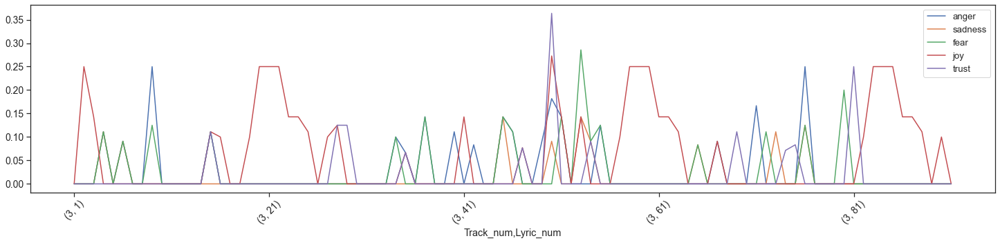

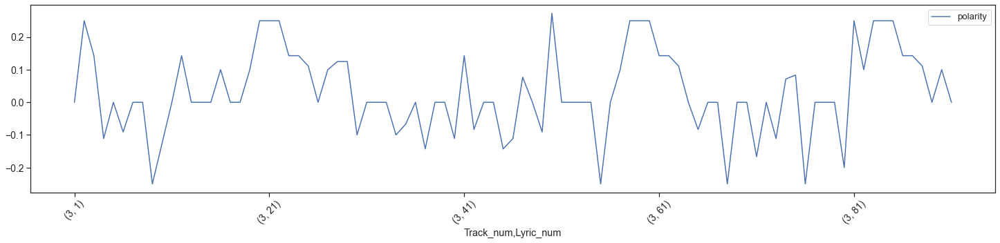

In [505]:
plot_sentiments(call_ticketron, ['anger','sadness','fear','joy','trust'])
plot_sentiments(call_ticketron, ['polarity'])

"Call Ticketron" appears to have a recurring sentiment of "joy" that occurs around lyrics 21, 61, and 81.  Those lyrics are found to be per the following.  Given the repeating pattern and relative spacing, we assume these lyrics represent the song's chorus.  It's observed that these lyrics occur at lyric numbers 20, 58, and 83, which is not an even spacing.

From this, we find that the pattern observed is the chorus.  The positive score is due to the word "garden" as observed in the sentiment CSV file.  It is recognized that this may be misleading, as the "garden" in this context is a reference to New York's Madison Square Garden and not an actual space devoted to the growth of plants, the latter of which is likely from where the positive sentiment derives.  It's interesting that per said CSV, the word "live" does not appear and is hence considered neutral sentiment-wise.

In [506]:
call_ticketron.iloc[20:25] # We want to focus on 20 through 25

anger  anticipation  disgust  fear       joy  sadness  \
Track_num Lyric_num                                                          
3         21           0.0           0.0      0.0   0.0  0.250000      0.0   
          22           0.0           0.0      0.0   0.0  0.250000      0.0   
          23           0.0           0.0      0.0   0.0  0.142857      0.0   
          24           0.0           0.0      0.0   0.0  0.142857      0.0   
          25           0.0           0.0      0.0   0.0  0.111111      0.0   

                     surprise  trust  polarity  
Track_num Lyric_num                             
3         21              0.0    0.0  0.250000  
          22              0.0    0.0  0.250000  
          23              0.0    0.0  0.142857  
          24              0.0    0.0  0.142857  
          25              0.0    0.0  0.111111

In [507]:
call_ticketron.iloc[58:63] # We want to focus on 58 through 63

anger  anticipation  disgust  fear       joy  sadness  \
Track_num Lyric_num                                                          
3         59           0.0           0.0      0.0   0.0  0.250000      0.0   
          60           0.0           0.0      0.0   0.0  0.250000      0.0   
          61           0.0           0.0      0.0   0.0  0.142857      0.0   
          62           0.0           0.0      0.0   0.0  0.142857      0.0   
          63           0.0           0.0      0.0   0.0  0.111111      0.0   

                     surprise  trust  polarity  
Track_num Lyric_num                             
3         59              0.0    0.0  0.250000  
          60              0.0    0.0  0.250000  
          61              0.0    0.0  0.142857  
          62              0.0    0.0  0.142857  
          63              0.0    0.0  0.111111

In [508]:
call_ticketron.iloc[83:88] # We want to focus on 83 through 88

anger  anticipation  disgust  fear       joy  sadness  \
Track_num Lyric_num                                                          
3         84           0.0           0.0      0.0   0.0  0.250000      0.0   
          85           0.0           0.0      0.0   0.0  0.250000      0.0   
          86           0.0           0.0      0.0   0.0  0.142857      0.0   
          87           0.0           0.0      0.0   0.0  0.142857      0.0   
          88           0.0           0.0      0.0   0.0  0.111111      0.0   

                     surprise  trust  polarity  
Track_num Lyric_num                             
3         84              0.0    0.0  0.250000  
          85              0.0    0.0  0.250000  
          86              0.0    0.0  0.142857  
          87              0.0    0.0  0.142857  
          88              0.0    0.0  0.111111

In [509]:
RTJ_cens.loc[(3,3,20),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          20           live from the garden
Name: Lyrics, dtype: object

In [510]:
RTJ_cens.loc[(3,3,21),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          21           live from the garden
Name: Lyrics, dtype: object

In [511]:
RTJ_cens.loc[(3,3,22),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          22           live from the garden
Name: Lyrics, dtype: object

In [512]:
RTJ_cens.loc[(3,3,23),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          23           run the jewels live at the garden
Name: Lyrics, dtype: object

In [513]:
RTJ_cens.loc[(3,3,24),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          24           run the jewels live from the garden
Name: Lyrics, dtype: object

In [514]:
RTJ_cens.loc[(3,3,25),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          25           run run run the jewels live from the garden
Name: Lyrics, dtype: object

In [515]:
RTJ_cens.loc[(3,3,58),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          58           live from the garden
Name: Lyrics, dtype: object

In [516]:
RTJ_cens.loc[(3,3,59),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          59           live from the garden
Name: Lyrics, dtype: object

In [517]:
RTJ_cens.loc[(3,3,60),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          60           live from the garden
Name: Lyrics, dtype: object

In [518]:
RTJ_cens.loc[(3,3,61),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          61           run the jewels live at the garden
Name: Lyrics, dtype: object

In [519]:
RTJ_cens.loc[(3,3,62),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          62           run the jewels live from the garden
Name: Lyrics, dtype: object

In [520]:
RTJ_cens.loc[(3,3,63),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          63           run run run the jewels live from the garden
Name: Lyrics, dtype: object

In [521]:
RTJ_cens.loc[(3,3,83),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          83           live from the garden
Name: Lyrics, dtype: object

In [522]:
RTJ_cens.loc[(3,3,84),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          84           live from the garden
Name: Lyrics, dtype: object

In [523]:
RTJ_cens.loc[(3,3,85),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          85           live from the garden
Name: Lyrics, dtype: object

In [524]:
RTJ_cens.loc[(3,3,86),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          86           run the jewels live at the garden
Name: Lyrics, dtype: object

In [525]:
RTJ_cens.loc[(3,3,87),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          87           run the jewels live from the garden
Name: Lyrics, dtype: object

In [526]:
RTJ_cens.loc[(3,3,88),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          3          88           run run run the jewels live from the garden
Name: Lyrics, dtype: object

### "2100"

In [527]:
twentyone = TOKEN_rtj_3.query("Track_num == 8").groupby(OHCO_1a[1:3])[emo_cols].mean()

In [528]:
IFrame("https://www.youtube.com/embed/J-FPb-Mcpjw", width=980, height=551)

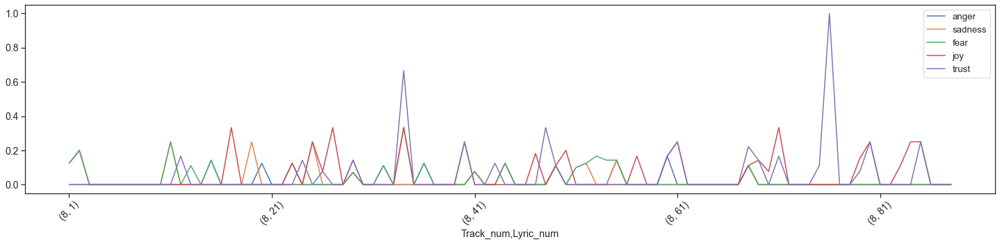

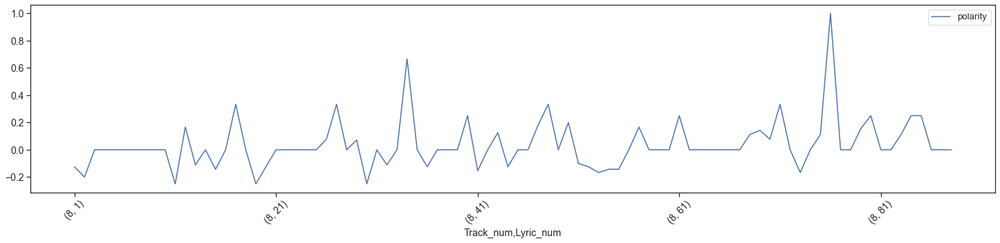

In [529]:
plot_sentiments(twentyone, ['anger','sadness','fear','joy','trust'])
plot_sentiments(twentyone, ['polarity'])

As can be seen, "2100" does not feature many negative dips in polarity, let lone any severe dips.  It does have two relatively high positive spikes, the first such positive spike occurs at lyric 34 (which combines joy and trust, but also has a negative sentiment of fear to give a net sentiment of 0.667) while the second occurs at lyric 76 (which has a sentiment of 1.00, entirely of trust).  The summary of these lyrics can be observed below, including the repitious use of the positive word "worthy" in lyric 76.  Such a display may evoke to the listener the repitition of the word "holy" in Allen Ginsberg's acclaimed poem "Howl", for example.  Overall, this song gives a hopeful message but does not shy away from some of the signature Run the Jewels themes and more obscene lyrics.

In [530]:
twentyone.iloc[33]

anger           0.000000
anticipation    0.333333
disgust         0.000000
fear            0.333333
joy             0.333333
sadness         0.000000
surprise        0.000000
trust           0.666667
polarity        0.666667
Name: (8, 34), dtype: float64

In [531]:
twentyone.iloc[75]

anger           0.0
anticipation    0.0
disgust         0.0
fear            0.0
joy             0.0
sadness         0.0
surprise        0.0
trust           1.0
polarity        1.0
Name: (8, 76), dtype: float64

In [532]:
RTJ_cens.loc[(3,8,34),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          8          34           swear to god
Name: Lyrics, dtype: object

In [533]:
RTJ_cens.loc[(3,8,76),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          8          76           worthy worthy worthy worthy worthy
Name: Lyrics, dtype: object

### "A Report to the Shareholders / Kill Your Masters"

In [534]:
a_report = TOKEN_rtj_3.query("Track_num == 13").groupby(OHCO_1a[1:3])[emo_cols].mean()

In [535]:
IFrame("https://www.youtube.com/embed/pg0byaqVaXo", width=980, height=551)

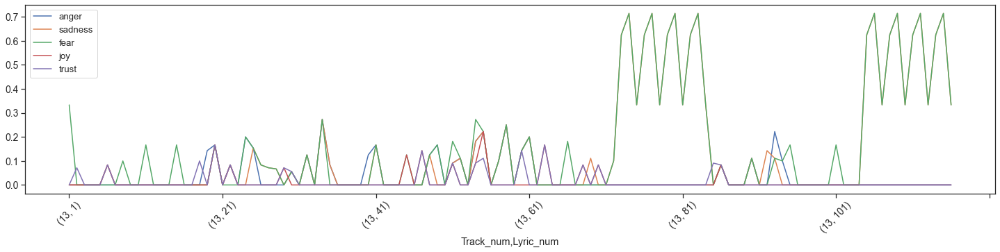

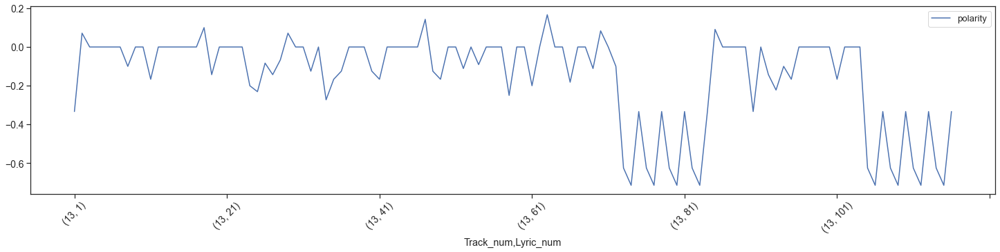

In [536]:
plot_sentiments(a_report, ['anger','sadness','fear','joy','trust'])
plot_sentiments(a_report, ['polarity'])

"A Report to the Shareholders / Kill Your Masters" is overwhelmingly the most negative track in the entire Run the Jewels discrography from the perspective of calculated sentiment.  The two raised "fear" regions, which occur from lyrics 74 to 84 and again from 106 to 116, have repeat forms (see above) and scoring (see below).

These lyrics repeat the idea to "kill your masters" by repeating the word "kill" (having a negative sentiment).  Indeed, we can calculate the number of times "kill" is used in this song and find and this word occurs an astonishing <b>93 times!</b>

The idea to "kill" one's "masters" is also found in lyric 38 from the song "Angel Duster" off the *Run the Jewels 2* album.  Racial, economic, and social inequality are among the themes in the Run the Jewels discography, and as Killer Mike points out below, the idea to "kill" one's "masters" is "the principle that we share the same master class" which is driven by money and greed --- the face of which may be institutions like politicians or corporations or any such entity that may exploit the working class (regardless of ethnicity, although the lyrical choice is deliberate as it brutally evokes the oppressive images of the antebellum period in US history); here, he is encouraging his listeners to be aware of such a "master class" and act to rage against such institutions.  Rather than continue to paraphrase, it is recommended to simply watch said video, a 2020 excerpt from *Skip and Shannon: Undisputed*.

In [537]:
IFrame("https://www.youtube.com/embed/_76T9kKh4Lc?start=949", width=980, height=551)

In [538]:
RTJ_cens.loc[(3,13),"Token"].str.count("kill").sum() # Count of the token "kill" in the above-referenced track

96

In [539]:
a_report.iloc[73:84]

anger  anticipation  disgust      fear  joy   sadness  \
Track_num Lyric_num                                                          
13        74           0.0           0.0      0.0  0.714286  0.0  0.714286   
          75           0.0           0.0      0.0  0.333333  0.0  0.333333   
          76           0.0           0.0      0.0  0.625000  0.0  0.625000   
          77           0.0           0.0      0.0  0.714286  0.0  0.714286   
          78           0.0           0.0      0.0  0.333333  0.0  0.333333   
          79           0.0           0.0      0.0  0.625000  0.0  0.625000   
          80           0.0           0.0      0.0  0.714286  0.0  0.714286   
          81           0.0           0.0      0.0  0.333333  0.0  0.333333   
          82           0.0           0.0      0.0  0.625000  0.0  0.625000   
          83           0.0           0.0      0.0  0.714286  0.0  0.714286   
          84           0.0           0.0      0.0  0.333333  0.0  0.333333   

                     surprise  trust  polarity  
Track_num Lyric_num                             
13        74              0.0    0.0 -0.714286  
          75              0.0    0.0 -0.333333  
          76              0.0    0.0 -0.625000  
          77              0.0    0.0 -0.714286  
          78              0.0    0.0 -0.333333  
          79              0.0    0.0 -0.625000  
          80              0.0    0.0 -0.714286  
          81              0.0    0.0 -0.333333  
          82              0.0    0.0 -0.625000  
          83              0.0    0.0 -0.714286  
          84              0.0    0.0 -0.333333

In [540]:
a_report.iloc[105:]

anger  anticipation  disgust      fear  joy   sadness  \
Track_num Lyric_num                                                          
13        106          0.0           0.0      0.0  0.714286  0.0  0.714286   
          107          0.0           0.0      0.0  0.333333  0.0  0.333333   
          108          0.0           0.0      0.0  0.625000  0.0  0.625000   
          109          0.0           0.0      0.0  0.714286  0.0  0.714286   
          110          0.0           0.0      0.0  0.333333  0.0  0.333333   
          111          0.0           0.0      0.0  0.625000  0.0  0.625000   
          112          0.0           0.0      0.0  0.714286  0.0  0.714286   
          113          0.0           0.0      0.0  0.333333  0.0  0.333333   
          114          0.0           0.0      0.0  0.625000  0.0  0.625000   
          115          0.0           0.0      0.0  0.714286  0.0  0.714286   
          116          0.0           0.0      0.0  0.333333  0.0  0.333333   

                     surprise  trust  polarity  
Track_num Lyric_num                             
13        106             0.0    0.0 -0.714286  
          107             0.0    0.0 -0.333333  
          108             0.0    0.0 -0.625000  
          109             0.0    0.0 -0.714286  
          110             0.0    0.0 -0.333333  
          111             0.0    0.0 -0.625000  
          112             0.0    0.0 -0.714286  
          113             0.0    0.0 -0.333333  
          114             0.0    0.0 -0.625000  
          115             0.0    0.0 -0.714286  
          116             0.0    0.0 -0.333333

In [541]:
RTJ_cens.loc[(3,13,74),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          13         74           kill your kill kill kill your kill
Name: Lyrics, dtype: object

In [542]:
RTJ_cens.loc[(3,13,75),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          13         75           kill your masters
Name: Lyrics, dtype: object

In [543]:
RTJ_cens.loc[(3,13,76),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          13         76           kill your kill kill your kill your kill
Name: Lyrics, dtype: object

In [544]:
RTJ_cens.loc[(3,13,77),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          13         77           kill your kill kill kill your kill
Name: Lyrics, dtype: object

In [545]:
RTJ_cens.loc[(3,13,78),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          13         78           kill your masters kill your masters
Name: Lyrics, dtype: object

In [546]:
RTJ_cens.loc[(3,13,79),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          13         79           kill your kill kill your kill your kill
Name: Lyrics, dtype: object

In [547]:
RTJ_cens.loc[(3,13,80),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          13         80           kill your kill kill kill your kill
Name: Lyrics, dtype: object

In [548]:
RTJ_cens.loc[(3,13,81),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          13         81           kill your masters
Name: Lyrics, dtype: object

In [549]:
RTJ_cens.loc[(3,13,82),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          13         82           kill your kill kill your kill your kill
Name: Lyrics, dtype: object

In [550]:
RTJ_cens.loc[(3,13,83),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          13         83           kill your kill kill kill your kill
Name: Lyrics, dtype: object

In [551]:
RTJ_cens.loc[(3,13,84),"Lyrics"].head(1)

Album_num  Track_num  Lyric_num
3          13         84           kill your masters kill your masters
Name: Lyrics, dtype: object

## Create Unigram Model

In [552]:
n_tokens = VOCAB.n.sum()
VOCAB['log_p'] = np.log2(VOCAB['p'])
VOCAB_cens['log_p'] = VOCAB['log_p']

In [553]:
smooth = VOCAB['p'].min()

In [554]:
VOCAB_cens.sort_values('p', ascending = False).head(10)

,term_rank,term_str,n,stop,p_stem,pos_max,p,term_rank2,zipf_k,zipf_k2,zipf_k3,p2,h,df_1,idf_1,df_2,idf_2,tfidf_sum_1,tfidf_sum_2,log_p
term_id,,,,,,,,,,,,,,,,,,,,
4274,1,the,1695,1,the,DT,0.350279,1,1695,1695,0.350279,0.051382,0.220049,57,0.000000,5,0.0,0.000000,0.0,-1.513424
19,2,a,999,1,a,DT,0.206448,2,1998,1998,0.412895,0.030284,0.152791,57,0.000000,5,0.0,0.000000,0.0,-2.276152
2079,3,i,830,1,i,NN,0.171523,3,2490,2490,0.514569,0.025161,0.133671,57,0.000000,5,0.0,0.000000,0.0,-2.543526
140,4,and,775,1,and,CC,0.160157,4,3100,3100,0.640628,0.023493,0.127137,57,0.000000,5,0.0,0.000000,0.0,-2.642441
4815,5,you,669,1,you,PRP,0.138252,5,3345,3345,0.691259,0.020280,0.114051,57,0.000000,5,0.0,0.000000,0.0,-2.854631
4359,6,to,539,1,to,TO,0.111387,6,3234,3234,0.668320,0.016339,0.096982,57,0.000000,5,0.0,0.000000,0.0,-3.166352
2113,7,in,473,1,in,IN,0.097747,7,3311,3311,0.684232,0.014339,0.087809,57,0.000000,5,0.0,0.000000,0.0,-3.354797
2883,8,of,433,1,of,IN,0.089481,8,3464,3464,0.715850,0.013126,0.082056,57,0.000000,5,0.0,0.000000,0.0,-3.482270
2769,9,my,419,1,my,PRP$,0.086588,9,3771,3771,0.779293,0.012702,0.080005,56,0.007687,5,0.0,0.005541,0.0,-3.529687


In [555]:
predict_lyrics("Killer Mike for President")
predict_lyrics("Run the Jewels")
predict_lyrics("Twinkle Twinkle Little Star")
predict_lyrics("I want to hold your hand")
predict_lyrics("When We All Fall Asleep, Where Do We Go?")
predict_lyrics("Lie Cheat Steal Win")
predict_lyrics("kill kill meow kill")

--------------------------------------------------
p('Killer Mike for President') = 3.9525420920751335e-10; log2: -31.236500122417816
--------------------------------------------------
    term_str    n         p      log_p
0     killer   12  0.002480  -8.655531
1       mike   35  0.007233  -7.111210
2        for  258  0.053317  -4.229266
3  president    2  0.000413 -11.240493
--------------------------------------------------
--------------------------------------------------
p('Run the Jewels') = 0.000394334447820495; log2: -11.30829263428501
--------------------------------------------------
  term_str     n         p     log_p
0      run   261  0.053937 -4.212587
1      the  1695  0.350279 -1.513424
2   jewels   101  0.020872 -5.582282
--------------------------------------------------
--------------------------------------------------
p('Twinkle Twinkle Little Star') = 1.8238012606474407e-13; log2: -42.31811670573247
--------------------------------------------------
  term_str   

In [556]:
n_gram = TOKEN.copy()

In [557]:
n_gram = n_gram.set_index(['Token_num'], append=True)

In [558]:
n_gram = n_gram.drop(["Album","Title","Lyrics","POS_Tagged","POS","surprise","anger","anticipation",\
                     "disgust","fear","joy","negative","positive","sadness","trust","polarity","html"],axis=1)

In [559]:
n_gram = n_gram.rename(columns={"Token": "token_str"})

In [560]:
OHCO_3 = ["Album_num","Track_num","Lyric_num","Token_num"]

In [561]:
n_gram

token_str  term_id
Album_num Track_num Lyric_num Token_num                   
1         0         1         0               run     3591
                              1               run     3591
                              2               run     3591
                              3               run     3591
                              4               run     3591
...                                           ...      ...
5         8         72        4                in     2113
                              5              love     2465
                              6             again       78
                              7              love     2465
                              8             again       78

[32988 rows x 2 columns]

In [562]:
m1, m2, m3 = get_ngrams(n_gram, n=3)

In [563]:
m1.sort_values('n', ascending=False).head(5)

,n
w0,
the,1695
a,999
i,830
and,775
you,669


In [564]:
m2.sort_values('n', ascending=False).head(5)

,,n
w0,w1,
in,the,143
run,them,125
to,the,105
of,the,91
for,the,90


In [565]:
m3.sort_values('n', ascending=False).head(15)

,,,n
w0,w1,w2,
run,them,run,82
them,run,them,82
it,<s>,<s>,77
you,<s>,<s>,53
go,go,go,51
sh*t,<s>,<s>,50
me,<s>,<s>,44
run,the,jewels,43
bi**h,<s>,<s>,40


In [566]:
m1['p'] = m1['n'] / m1['n'].sum()
m2['p'] = m2['n'] / m2['n'].sum()
m3['p'] = m3['n'] / m3['n'].sum()

In [567]:
m1.sort_values('p', ascending=False).head()

,n,p
w0,,
the,1695,0.051382
a,999,0.030284
i,830,0.025161
and,775,0.023493
you,669,0.020280


In [568]:
m2.sort_values('p', ascending=False).head()

,,n,p
w0,w1,,
in,the,143,0.004335
run,them,125,0.003789
to,the,105,0.003183
of,the,91,0.002759
for,the,90,0.002728


In [569]:
m3.sort_values('p', ascending=False).head(15)

,,,n,p
w0,w1,w2,,
run,them,run,82,0.002486
them,run,them,82,0.002486
it,<s>,<s>,77,0.002334
you,<s>,<s>,53,0.001607
go,go,go,51,0.001546
sh*t,<s>,<s>,50,0.001516
me,<s>,<s>,44,0.001334
run,the,jewels,43,0.001304
bi**h,<s>,<s>,40,0.001213


In [570]:
m2m = m2.n.unstack().fillna(0).apply(lambda x: x / x.sum(), 1)

In [571]:
m2m

w1,03,1,2,22,2pac,3,36,45,5th,6,...,zags,zapruder,zebra,zig,zip,zombies,zone,zoning,zoomin,zulu
w0,,,,,,,,,,,,,,,,,,,,,
03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zombies,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
zone,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
zoning,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [572]:
m3m = m3.n.unstack().fillna(0).apply(lambda x: x / x.sum(), 1)

In [573]:
m3m

w2                 03    1    2   22  2pac    3   36   45  5th    6  ...  \
w0      w1                                                           ...   
03      but       0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  ...   
1       <s>       0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  ...   
        and       0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  ...   
        ba****d   0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  ...   
2       <s>       0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  ...   
...               ...  ...  ...  ...   ...  ...  ...  ...  ...  ...  ...   
zombies folded    0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  ...   
zone    hope      0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  ...   
zoning  district  0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  ...   
zoomin  <s>       0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  ...   
zulu    mansa     0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  ...   

w2                zags  zapruder  zebra  zig  zip  zombies  zone  zoning  \
w0      w1                                                                 
03      but        0.0       0.0    0.0  0.0  0.0      0.0   0.0     0.0   
1       <s>        0.0       0.0    0.0  0.0  0.0      0.0   0.0     0.0   
        and        0.0       0.0    0.0  0.0  0.0      0.0   0.0     0.0   
        ba****d    0.0       0.0    0.0  0.0  0.0      0.0   0.0     0.0   
2       <s>        0.0       0.0    0.0  0.0  0.0      0.0   0.0     0.0   
...                ...       ...    ...  ...  ...      ...   ...     ...   
zombies folded     0.0       0.0    0.0  0.0  0.0      0.0   0.0     0.0   
zone    hope       0.0       0.0    0.0  0.0  0.0      0.0   0.0     0.0   
zoning  district   0.0       0.0    0.0  0.0  0.0      0.0   0.0     0.0   
zoomin  <s>        0.0       0.0    0.0  0.0  0.0      0.0   0.0     0.0   
zulu    mansa      0.0       0.0    0.0  0.0  0.0      0.0   0.0     0.0   

w2                zoomin  zulu  
w0      w1                      
03      but          0.0   0.0  
1       <s>          0.0   0.0  
        and          0.0   0.0  
        ba****d      0.0   0.0  
2       <s>          0.0   0.0  
...                  ...   ...  
zombies folded       0.0   0.0  
zone    hope         0.0   0.0  
zoning  district     0.0   0.0  
zoomin  <s>          0.0   0.0  
zulu    mansa        0.0   0.0  

[17543 rows x 4343 columns]

## Randomly Generated Lines Based on Run the Jewels Lyrics and Weights

Here, n-gram models are used to generate randomly lyrics based on the Run the Jewels language along with probabilities of those n-grams.  Each time these functions are called a new set of lyrics will be generated, the content of which will only appear cohesive by chance.

In [574]:
generate_text()

bk air in the truck
 shyne po a ho pow catch me a couple good drinks in the hosiery
 ones whose body hung from a little shop of horrors that i got
 me to redeem her in jesus name left her shakin and squirtin
 our glasses and watch your rotten demise
 go
 on crippy while readin inscriptions
 plan miscarriages
 a kid in my nizzikes
 day yeah hoe
 i seen
 the better buy for the dogooders that the beat of the worldll make all your saneness go
 big
 i kill a mic with killer mike roll els outta ps wit elp
 to he*l and meditate
 cause i done had to shop right
 hey i might be necessary
 help i assist him follow
 the people man
 living right
 this way feeling this feeling this early
 my name
 pliers guys to the terms we can do
 a rumor
 went to vegas jumped the broom



In [575]:
generate_text()

drying
 make a meal of her
 never look back never stare at a ghost conversing with a sly wink and a foul tongue
 ill see you now
 dont sleep
 pair better highly unlikely
 had wished they were nothing to lose a step up then everythings for the fame
 at
 like a perm or a knife
 made a po*n tape that ni**a is a fraud a church is a worse time than the last temptation of mike but im taking all of your teeth
 gold gold its gold
 after hes eaten
 one time for theone oneoneone
 heard it here
 of staples
 have been suffering through mine
 it properly
 dont stumble young fellow
 crook look
 it is
 a pegasus thats no embellishment
 the miserables ill make the trip
 lit by the side of the anger home of the killers of the worldll make all your false idols are just pretenders
 preventin conjugal visits
 you 


In [576]:
generate_text()

coming soon on a thursday and its cold as fu*k
 the top are likely rapists
 im really not sublime
 michael the benevolent
 drop em drop em drop em drop em drop em
 my professor emeritus
 we rode the waves of your favorite rapper aint sh*t fly but the pair we got scars for hearts
 i thinks going on
 like the life that seemed to be right means to be nothin nothin
 position
 yo dollar get it im dirt mo*********r i cant believe this
 black spot on a world conquest tearing your bone apart
 my realness
 dont die waiting
 out
 go****n er er er er er er er er er er er er er er er er er
 say hello to the ground
 the reefer man
 wanted
 meow meow meow
 yall
 i would give another chance i would rather be in catholic confessions professing depression
 this
 want maximum stupid i am in the bottom we dipping


In [577]:
generate_text()

went on a new world it is ash and you aint ji**a or puff you doing time
 i can feel it too
 the money like its true
 they momma to say
 absurd
 your fort lil ni**a
 me up take me up
 thats the law deal done by the stench in the glass hit
 ol south
 get out
 you say what happened
 soul to its options
 oui ah
 hear the tunes admit that they
 line
 a nut punch wizard
 professor emeritus
 the tooth
 waves and its hungry as fu*k
 opera singer
 for the light beam of the light
 embedded in my ear
 gold
 a g here see talk to me that dap
 and the matches to flare it up
 a chinese sweatshop
 tusslin
 me
 got a michelin star im on par with the words to the flames
 weapon and swore to them what i


## PCA

In this section, Principal Component Analysis (PCA) will be performed on the Run the Jewels album level and again at the song level. 

In [578]:
TFIDF_2 =TFIDF_2.apply(lambda x: x/norm(x),1)
TFIDF_1 = TFIDF_1.apply(lambda x: x/norm(x),1)

In [579]:
TFIDF_1.head()

term_id,0,1,2,3,4,5,6,7,8,9,...,4829,4830,4831,4832,4833,4834,4835,4836,4837,4838
Title,,,,,,,,,,,,,,,,,,,,,
2100,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
"36"" Chain",0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.061151,0.147608,0.0,...,0.0,0.0,0.0,0.0,0.0,0.073804,0.0,0.0,0.0,0.0
A Christmas Fu****g Miracle,0.0,0.058211,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
A Report to the Shareholders / Kill Your Masters,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
All Due Respect,0.0,0.000000,0.0,0.0,0.0,0.0,0.063022,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0


In [580]:
TFIDF_2.head()

term_id,0,1,2,3,4,5,6,7,8,9,...,4829,4830,4831,4832,4833,4834,4835,4836,4837,4838
Album,,,,,,,,,,,,,,,,,,,,,
Meow the Jewels,0.000000,0.000000,0.016962,0.000000,0.000000,0.000000,0.016962,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.004131,0.000000,0.000000,0.000000,0.000000,0.016962
RTJ4,0.000000,0.000000,0.000000,0.013893,0.013893,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.013893,0.000000,0.000000,0.000000,0.000000,0.013893,0.013893,0.013893,0.000000
Run the Jewels,0.024321,0.013847,0.000000,0.000000,0.000000,0.000000,0.000000,0.072963,0.048642,0.024321,...,0.024321,0.000000,0.024321,0.024321,0.003372,0.024321,0.000000,0.000000,0.000000,0.000000
Run the Jewels 2,0.000000,0.000000,0.037604,0.000000,0.000000,0.000000,0.018802,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.004579,0.000000,0.000000,0.000000,0.000000,0.018802
Run the Jewels 3,0.000000,0.019548,0.000000,0.000000,0.000000,0.017168,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.002380,0.000000,0.000000,0.000000,0.000000,0.000000


In [581]:
COV_album = TFIDF_2.cov()
COV_track = TFIDF_1.cov()

In [582]:
COV_track.head()

term_id,0,1,2,3,4,5,6,7,8,9,...,4829,4830,4831,4832,4833,4834,4835,4836,4837,4838
term_id,,,,,,,,,,,,,,,,,,,,,
0,1.034992e-04,-0.000004,-0.000004,-1.040466e-06,-8.053324e-07,-1.473101e-06,-0.000003,-0.000004,-0.000004,-1.846558e-06,...,-1.140661e-06,-1.040466e-06,-1.260587e-06,-1.140661e-06,-0.000005,-1.775918e-06,-1.705845e-06,-1.308515e-06,-1.040466e-06,-0.000004
1,-3.967747e-06,0.000154,-0.000008,-2.233690e-06,-1.728902e-06,-3.162479e-06,-0.000007,-0.000009,-0.000008,-3.964223e-06,...,-2.448791e-06,-2.233690e-06,-2.706250e-06,-2.448791e-06,-0.000010,-3.812572e-06,-3.662138e-06,-2.809143e-06,-2.233690e-06,-0.000008
2,-3.591777e-06,-0.000008,0.000130,-2.022034e-06,-1.565077e-06,-2.862813e-06,-0.000006,-0.000008,-0.000007,-3.588586e-06,...,-2.216751e-06,-2.022034e-06,-2.449815e-06,-2.216751e-06,0.000050,-3.451306e-06,-3.315126e-06,-2.542958e-06,-2.022034e-06,-0.000007
3,-1.040466e-06,-0.000002,-0.000002,3.280159e-05,-4.533714e-07,-8.292997e-07,-0.000002,-0.000002,-0.000002,-1.039542e-06,...,-6.421486e-07,3.280159e-05,-7.096623e-07,-6.421486e-07,-0.000003,-9.997743e-07,-9.603259e-07,-7.366440e-07,3.280159e-05,-0.000002
4,-8.053324e-07,-0.000002,-0.000002,-4.533714e-07,1.965122e-05,-6.418873e-07,-0.000001,-0.000002,-0.000002,-8.046170e-07,...,-4.970302e-07,-4.533714e-07,-5.492866e-07,-4.970302e-07,-0.000002,-7.738365e-07,-7.433030e-07,-5.701708e-07,-4.533714e-07,-0.000002


In [583]:
COV_album.head()

term_id,0,1,2,3,4,5,6,7,8,9,...,4829,4830,4831,4832,4833,4834,4835,4836,4837,4838
term_id,,,,,,,,,,,,,,,,,,,,,
0,0.000118,0.000044,-0.000066,-0.000017,-0.000017,-0.000021,-0.000043,0.000355,0.000237,0.000118,...,0.000118,-0.000017,0.000118,0.000118,2.916575e-06,0.000118,-0.000017,-0.000017,-0.000017,-0.000043
1,0.000044,0.000088,-0.000091,-0.000023,-0.000023,0.000055,-0.000060,0.000131,0.000087,0.000044,...,0.000044,-0.000023,0.000044,0.000044,-8.422683e-07,0.000044,-0.000023,-0.000023,-0.000023,-0.000060
2,-0.000066,-0.000091,0.000277,-0.000038,-0.000038,-0.000047,0.000151,-0.000199,-0.000133,-0.000066,...,-0.000066,-0.000038,-0.000066,-0.000066,2.110535e-05,-0.000066,-0.000038,-0.000038,-0.000038,0.000151
3,-0.000017,-0.000023,-0.000038,0.000039,0.000039,-0.000012,-0.000025,-0.000051,-0.000034,-0.000017,...,-0.000017,0.000039,-0.000017,-0.000017,-1.004608e-05,-0.000017,0.000039,0.000039,0.000039,-0.000025
4,-0.000017,-0.000023,-0.000038,0.000039,0.000039,-0.000012,-0.000025,-0.000051,-0.000034,-0.000017,...,-0.000017,0.000039,-0.000017,-0.000017,-1.004608e-05,-0.000017,0.000039,0.000039,0.000039,-0.000025


In [584]:
COV_album.iloc[:5,:10].style.background_gradient()

term_id,0,1,2,3,4,5,6,7,8,9
term_id,,,,,,,,,,
0,0.000118,0.000044,-0.000066,-0.000017,-0.000017,-0.000021,-0.000043,0.000355,0.000237,0.000118
1,0.000044,0.000088,-0.000091,-0.000023,-0.000023,0.000055,-0.000060,0.000131,0.000087,0.000044
2,-0.000066,-0.000091,0.000277,-0.000038,-0.000038,-0.000047,0.000151,-0.000199,-0.000133,-0.000066
3,-0.000017,-0.000023,-0.000038,0.000039,0.000039,-0.000012,-0.000025,-0.000051,-0.000034,-0.000017
4,-0.000017,-0.000023,-0.000038,0.000039,0.000039,-0.000012,-0.000025,-0.000051,-0.000034,-0.000017


In [585]:
COV_track.iloc[:5,:10].style.background_gradient()

term_id,0,1,2,3,4,5,6,7,8,9
term_id,,,,,,,,,,
0,0.000103,-0.000004,-0.000004,-0.000001,-0.000001,-0.000001,-0.000003,-0.000004,-0.000004,-0.000002
1,-0.000004,0.000154,-0.000008,-0.000002,-0.000002,-0.000003,-0.000007,-0.000009,-0.000008,-0.000004
2,-0.000004,-0.000008,0.000130,-0.000002,-0.000002,-0.000003,-0.000006,-0.000008,-0.000007,-0.000004
3,-0.000001,-0.000002,-0.000002,0.000033,-0.000000,-0.000001,-0.000002,-0.000002,-0.000002,-0.000001
4,-0.000001,-0.000002,-0.000002,-0.000000,0.000020,-0.000001,-0.000001,-0.000002,-0.000002,-0.000001


In [586]:
eig_vals_album, eig_vec_album = eig(COV_album)
eig_vals_track, eig_vec_track = eig(COV_track)

In [587]:
TERM_IDX = COV_track.index

In [588]:
TERM_IDX

Int64Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,
            ...
            4829, 4830, 4831, 4832, 4833, 4834, 4835, 4836, 4837, 4838],
           dtype='int64', name='term_id', length=4839)

In [589]:
EIG_VEC_album = pd.DataFrame(eig_vec_album, index=TERM_IDX, columns=TERM_IDX)
EIG_VEC_track = pd.DataFrame(eig_vec_track, index=TERM_IDX, columns=TERM_IDX)

In [590]:
EIG_VAL_album = pd.DataFrame(eig_vals_album, index=TERM_IDX, columns=['eig_val'])
EIG_VAL_album.index.name = 'term_id'

EIG_VAL_track = pd.DataFrame(eig_vals_track, index=TERM_IDX, columns=['eig_val'])
EIG_VAL_track.index.name = 'term_id'

In [591]:
EIG_VEC_album.iloc[:5, :10].style.background_gradient()

term_id,0,1,2,3,4,5,6,7,8,9
term_id,,,,,,,,,,
0,0.001690,0.015248,0.005713,0.004181,0.011303,0.003935,0.000000,-0.007423,-0.004817,0.014667
1,-0.091335,-0.671081,-0.138187,-0.030240,-0.101093,-0.032592,-0.018711,0.045373,-0.053281,0.019484
2,-0.654994,-0.007393,0.047727,0.029084,0.075448,-0.007380,0.087716,0.021968,0.022116,-0.003937
3,0.058664,-0.125911,0.163518,0.363713,-0.062371,0.305752,0.009727,-0.037653,0.050435,0.030404
4,-0.091559,0.145431,-0.267499,0.313221,-0.131875,-0.053908,0.277358,0.166058,-0.112088,-0.105742


In [592]:
EIG_VAL_album.iloc[:5]

,eig_val
term_id,
0,-1.002030e-15
1,-6.225302e-16
2,-4.012809e-16
3,-3.028452e-16
4,-2.774125e-16


In [593]:
EIG_VEC_track.iloc[:5, :10].style.background_gradient()

term_id,0,1,2,3,4,5,6,7,8,9
term_id,,,,,,,,,,
0,0.000139,-0.002957,-0.003087,-0.007278,-0.007765,0.004804,-0.003872,-0.003611,0.004951,-0.004925
1,-0.029914,-0.040208,-0.063274,-0.061461,-0.073476,0.070521,-0.022155,-0.060568,0.080327,-0.080343
2,-0.149555,0.084943,0.302516,0.155512,0.520271,-0.167380,0.135621,0.002802,-0.124020,0.018008
3,0.450347,0.228081,-0.281294,0.253054,0.162411,0.141734,0.055045,0.020911,-0.078210,-0.164228
4,0.275815,-0.441408,0.150992,0.418081,-0.095366,-0.085538,0.003816,0.045301,0.128299,0.076740


In [594]:
EIG_VAL_track.iloc[:5]

,eig_val
term_id,
0,-4.122456e-17
1,-3.708570e-17
2,-3.519390e-17
3,-3.258146e-17
4,-2.819311e-17


In [595]:
EIG_PAIRS_album = EIG_VAL_album.join(EIG_VEC_album.T)
EIG_PAIRS_track = EIG_VAL_track.join(EIG_VEC_track.T)

In [596]:
EIG_PAIRS_album.head()

,eig_val,0,1,2,3,4,5,6,7,8,...,4829,4830,4831,4832,4833,4834,4835,4836,4837,4838
term_id,,,,,,,,,,,,,,,,,,,,,
0,-1.002030e-15,0.001690,-0.091335,-0.654994,0.058664,-0.091559,-0.020519,0.043209,-0.055970,-0.110332,...,0.000167,-0.008796,0.000167,-0.000252,0.000717,-0.000252,-0.008960,-0.009403,-0.009337,-0.001415
1,-6.225302e-16,0.015248,-0.671081,-0.007393,-0.125911,0.145431,0.013196,-0.096745,-0.079614,0.155007,...,0.006466,-0.001105,0.006466,0.006370,-0.000823,0.006370,-0.000994,0.000041,0.000813,-0.004701
2,-4.012809e-16,0.005713,-0.138187,0.047727,0.163518,-0.267499,-0.035233,-0.149040,-0.281697,-0.353648,...,0.008092,0.006441,0.008092,0.008218,0.000683,0.008218,0.006652,0.002169,0.001705,-0.004531
3,-3.028452e-16,0.004181,-0.030240,0.029084,0.363713,0.313221,-0.048791,0.207681,-0.002291,-0.003860,...,-0.004683,-0.021374,-0.004683,-0.004924,0.000020,-0.004924,-0.021110,-0.016372,-0.016485,-0.006599
4,-2.774125e-16,0.011303,-0.101093,0.075448,-0.062371,-0.131875,0.012578,0.574854,0.024899,-0.303616,...,0.004922,0.003541,0.004922,0.005234,-0.000446,0.005234,0.003646,0.002050,0.002392,-0.002310


In [597]:
EIG_PAIRS_track.head()

,eig_val,0,1,2,3,4,5,6,7,8,...,4829,4830,4831,4832,4833,4834,4835,4836,4837,4838
term_id,,,,,,,,,,,,,,,,,,,,,
0,-4.122456e-17,0.000139,-0.029914,-0.149555,0.450347,0.275815,0.370982,0.116641,0.079251,0.024232,...,0.001791,-0.003767,0.000172,0.002354,-0.003037,-0.001261,-0.002192,0.000025,-0.003228,-0.004567
1,-3.708570e-17,-0.002957,-0.040208,0.084943,0.228081,-0.441408,-0.071136,-0.055622,0.218913,0.010146,...,0.001973,-0.002092,0.000559,0.001551,0.005568,-0.002568,0.003836,-0.001993,-0.002055,-0.007349
2,-3.519390e-17,-0.003087,-0.063274,0.302516,-0.281294,0.150992,0.166662,-0.134612,-0.014330,0.011784,...,-0.001475,-0.000476,0.001007,-0.001332,-0.003465,-0.000212,0.000989,-0.000262,0.000922,0.015845
3,-3.258146e-17,-0.007278,-0.061461,0.155512,0.253054,0.418081,-0.279285,-0.203974,0.031492,-0.044482,...,0.007410,-0.002684,0.000402,0.007442,-0.016671,0.001217,-0.002762,0.004355,-0.002936,-0.010307
4,-2.819311e-17,-0.007765,-0.073476,0.520271,0.162411,-0.095366,-0.127112,0.185520,-0.146213,-0.014535,...,0.005358,-0.005434,-0.000466,0.006063,0.008749,0.001056,0.000958,0.002944,-0.004503,-0.004476


In [598]:
EIG_PAIRS_album['exp_var'] = np.round((EIG_PAIRS_album.eig_val / EIG_PAIRS_album.eig_val.sum()) * 100, 2)
EIG_PAIRS_track['exp_var'] = np.round((EIG_PAIRS_track.eig_val / EIG_PAIRS_track.eig_val.sum()) * 100, 2)

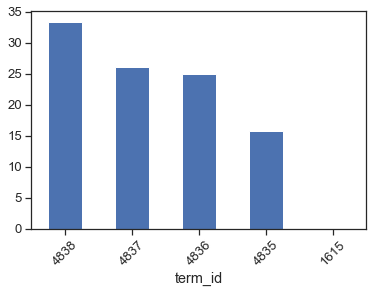

In [599]:
EIG_PAIRS_album.exp_var.sort_values(ascending=False).head().plot.bar(rot=45)

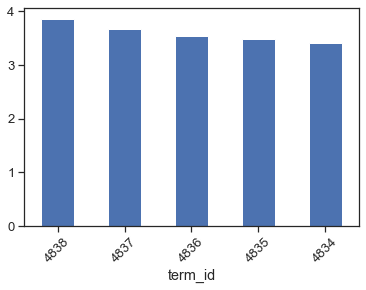

In [600]:
EIG_PAIRS_track.exp_var.sort_values(ascending=False).head().plot.bar(rot=45)

In [601]:
TOPS_album = EIG_PAIRS_album.sort_values('exp_var', ascending=False).head(10).reset_index(drop=True)
TOPS_album.index.name = 'comp_id'
TOPS_album.index = ["PC{}".format(i) for i in TOPS_album.index.tolist()]

In [602]:
TOPS_album

,eig_val,0,1,2,3,4,5,6,7,8,...,4830,4831,4832,4833,4834,4835,4836,4837,4838,exp_var
PC0,3.070443e-01,0.008018,1.080633e-02,-0.026635,0.004711,0.004711,0.005482,-0.017640,0.024053,0.016035,...,0.004711,0.008018,0.008018,-0.002424,0.008018,0.004711,0.004711,0.004711,-0.017640,33.36
PC1,2.392029e-01,0.014592,1.244256e-02,-0.000090,-0.011116,-0.011116,0.003632,-0.000184,0.043775,0.029183,...,-0.011116,0.014592,0.014592,0.002482,0.014592,-0.011116,-0.011116,-0.011116,-0.000184,25.99
PC2,2.296458e-01,-0.014402,8.002670e-03,0.000020,-0.003117,-0.003117,0.014229,-0.000189,-0.043206,-0.028804,...,-0.003117,-0.014402,-0.014402,-0.000070,-0.014402,-0.003117,-0.003117,-0.003117,-0.000189,24.95
PC3,1.445061e-01,0.000138,8.588631e-04,-0.020161,-0.000136,-0.000136,0.000685,-0.002350,0.000414,0.000276,...,-0.000136,0.000138,0.000138,-0.000458,0.000138,-0.000136,-0.000136,-0.000136,-0.002350,15.70
PC4,1.084064e-21,0.000000,1.626037e-05,-0.000004,-0.000023,-0.000033,0.000252,-0.000040,0.000338,0.000120,...,0.017733,-0.022473,-0.009153,0.007351,-0.008743,-0.016268,0.036610,-0.020057,0.001031,0.00
PC5,1.102753e-21,0.000000,1.974526e-06,0.000004,-0.000029,0.000015,-0.000234,0.000058,0.000260,0.000151,...,-0.031868,0.000897,0.002913,0.028585,0.002609,-0.032626,0.013260,0.024001,-0.014420,0.00
PC6,1.100292e-21,0.000000,9.419162e-07,-0.000007,0.000052,0.000019,0.000081,0.000035,0.000075,0.000028,...,0.008995,-0.000198,0.005986,0.015458,0.007399,0.011874,-0.032081,0.017992,-0.001946,0.00
PC7,1.098387e-21,0.000000,-4.577076e-06,0.000016,0.000018,0.000022,-0.000162,-0.000032,-0.000071,0.000011,...,-0.004339,0.014211,-0.006740,0.068503,-0.008838,-0.015714,0.021615,-0.033085,0.003280,0.00
PC8,1.094276e-21,0.000000,-1.526469e-05,-0.000003,-0.000009,0.000006,-0.000020,-0.000063,0.000060,0.000023,...,-0.018061,0.022357,0.001507,-0.000109,0.002101,0.004118,0.001199,-0.002611,0.005665,0.00
PC9,1.092200e-21,0.000000,-8.690928e-06,-0.000006,0.000013,-0.000049,-0.000019,-0.000044,-0.000113,-0.000049,...,-0.016856,0.007186,-0.009238,0.000783,-0.011962,0.004734,0.009393,-0.029447,-0.002457,0.00


In [603]:
TOPS_track = EIG_PAIRS_track.sort_values('exp_var', ascending=False).head(10).reset_index(drop=True)
TOPS_track.index.name = 'comp_id'
TOPS_track.index = ["PC{}".format(i) for i in TOPS_track.index.tolist()]

In [604]:
TOPS_track

,eig_val,0,1,2,3,4,5,6,7,8,...,4830,4831,4832,4833,4834,4835,4836,4837,4838,exp_var
PC0,0.037003,0.001363,0.000108,-0.005576,0.000947,-0.000124,-0.000989,0.003435,-0.000745,-0.001043,...,0.000947,0.001105,0.001712,0.008737,-0.000522,0.000291,0.002738,0.000947,0.015254,3.86
PC1,0.035176,-0.001053,-0.001482,-0.020218,-0.000241,0.000208,-0.000321,-0.042442,-0.003460,-0.001489,...,-0.000241,0.000512,0.000795,-0.012574,-0.000745,0.000282,0.001146,-0.000241,0.012176,3.67
PC2,0.033876,0.000932,-0.000553,-0.013338,-0.000783,0.000395,0.000355,-0.002823,0.000174,0.000702,...,-0.000783,-0.000311,-0.000753,-0.012861,0.000351,0.000286,-0.001602,-0.000783,0.052763,3.53
PC3,0.033515,0.001751,-0.000048,0.001105,0.000582,0.000311,-0.000549,-0.003677,0.000590,0.001145,...,0.000582,0.000243,0.000588,-0.007174,0.000573,0.000159,0.000264,0.000582,0.045479,3.49
PC4,0.032707,0.001815,0.001204,-0.013569,-0.000618,-0.000389,-0.001147,0.028962,0.003009,0.003449,...,-0.000618,-0.000101,-0.000108,0.005198,0.001725,0.000010,-0.000468,-0.000618,0.005987,3.41
PC5,0.031743,0.000595,-0.001848,-0.031962,0.000766,0.000346,0.000600,0.030568,0.004611,0.000616,...,0.000766,0.000177,-0.000401,-0.043899,0.000308,-0.000096,0.001136,0.000766,-0.007510,3.31
PC6,0.030701,-0.000488,-0.000959,-0.022768,-0.000410,0.000250,-0.000642,0.010801,-0.001022,0.000162,...,-0.000410,-0.000738,0.000557,0.020482,0.000081,0.000475,-0.001025,-0.000410,0.004948,3.20
PC7,0.029579,-0.004512,-0.010105,0.024954,-0.003475,-0.002845,-0.004961,0.020244,-0.009087,-0.007840,...,-0.003475,-0.003674,-0.001996,0.010050,-0.003920,-0.005872,-0.002667,-0.003475,0.034440,3.08
PC8,0.023628,-0.001122,-0.002819,0.002939,-0.002003,-0.002640,-0.004069,0.003584,-0.008526,-0.005327,...,-0.002003,-0.001397,-0.000273,-0.005294,-0.002664,-0.001055,-0.003101,-0.002003,-0.004569,2.46
PC9,0.021142,0.012615,-0.000799,0.001067,-0.000429,-0.005371,-0.007366,-0.002193,-0.011281,-0.002393,...,-0.000429,-0.000612,0.005206,0.012973,-0.001197,-0.004754,0.000604,-0.000429,-0.003682,2.20


In [605]:
LOADINGS_album = TOPS_album[TERM_IDX].T
LOADINGS_album.index.name = 'term_id'

In [606]:
LOADINGS_album.head().style.background_gradient()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
term_id,,,,,,,,,,
0,0.008018,0.014592,-0.014402,0.000138,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.010806,0.012443,0.008003,0.000859,0.000016,0.000002,0.000001,-0.000005,-0.000015,-0.000009
2,-0.026635,-0.000090,0.000020,-0.020161,-0.000004,0.000004,-0.000007,0.000016,-0.000003,-0.000006
3,0.004711,-0.011116,-0.003117,-0.000136,-0.000023,-0.000029,0.000052,0.000018,-0.000009,0.000013
4,0.004711,-0.011116,-0.003117,-0.000136,-0.000033,0.000015,0.000019,0.000022,0.000006,-0.000049


In [607]:
LOADINGS_album['term_str'] = LOADINGS_album.apply(lambda x: VOCAB.loc[int(x.name)].term_str, 1)

In [608]:
lb0_pos_album = LOADINGS_album.sort_values('PC0', ascending=True).head(10).term_str.str.cat(sep=' ')
lb0_neg_album = LOADINGS_album.sort_values('PC0', ascending=False).head(10).term_str.str.cat(sep=' ')
lb1_pos_album = LOADINGS_album.sort_values('PC1', ascending=True).head(10).term_str.str.cat(sep=' ')
lb1_neg_album = LOADINGS_album.sort_values('PC1', ascending=False).head(10).term_str.str.cat(sep=' ')

In [609]:
print('Albums PC0+', lb0_pos_album)
print('Albums PC0-', lb0_neg_album)
print('Albums PC1+', lb1_pos_album)
print('Albums PC1-', lb1_neg_album)

Albums PC0+ meow fast crown steal cheat shorty highway shame bully feeling
Albums PC0- oui garden ay ayy ooh captured sea legs brave cold
Albums PC1+ oui ayy ooh brave uh cold ah la charlatans ol
Albums PC1- ay legs sea garden idols trying stayed er own captured


In [610]:
DCM_track = TFIDF_1.dot(TOPS_track[TERM_IDX].T)
DCM_album = TFIDF_2.dot(TOPS_album[TERM_IDX].T)

In [611]:
DCM_album["label"] =  DCM_album.index
DCM_album["artist"] = "Run the Jewels" 

In [612]:
DCM_track["label"] =  DCM_track.index 

In [613]:
DCM_track["title"] =  DCM_track.index 

In [614]:
library = library.rename(columns={"Title" : "title"})
# https://stackoverflow.com/questions/34408700/pandas-create-new-column-in-one-dataframe-with-values-based-on-matching-key-fro

In [615]:
library_red = library.drop(["Album_num","Track_num","Lyrics","Lyric_num"],axis=1)

In [616]:
DCM_track = DCM_track.merge(library_red, how = "right" , on="title").set_index("title").drop_duplicates() 
DCM_track = DCM_track.rename(columns={"Album" : "album"})

In [617]:
DCM_track = DCM_track.rename(columns={"album" : "Label"})
DCM_track = DCM_track.rename(columns={"label" : "title"})
DCM_track = DCM_track.rename(columns={"Label" : "label"})

In [618]:
DCM_track.sample(8).style.background_gradient()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,title,label
title,,,,,,,,,,,,
Jeopardy,0.005813,0.031044,0.057532,-0.009359,0.015221,-0.038321,0.013324,-0.084233,0.753820,-0.041896,Jeopardy,Run the Jewels 2
Stay Gold,-0.005147,-0.055666,-0.003980,-0.008835,0.065085,0.048831,0.004487,-0.027975,-0.014854,0.115187,Stay Gold,Run the Jewels 3
Panther Like a Panther (Miracle Mix),0.006489,-0.014181,0.038885,-0.037072,-0.015143,-0.032547,-0.055727,-0.009381,0.013051,-0.021675,Panther Like a Panther (Miracle Mix),Run the Jewels 3
a few words for the firing squad (radiation),-0.016350,-0.001293,0.005580,0.012047,-0.024010,0.011634,0.015690,-0.096531,-0.103180,-0.206196,a few words for the firing squad (radiation),RTJ4
out of sight,0.017820,-0.027473,-0.019408,-0.006975,0.008506,0.019393,-0.022753,-0.113384,-0.052157,-0.258706,out of sight,RTJ4
2100,-0.022967,-0.007676,-0.009334,-0.006478,-0.023199,0.017749,0.028260,-0.093405,-0.022661,-0.074688,2100,Run the Jewels 3
Run the Jewels,0.066165,0.019494,-0.046941,0.017883,-0.006887,-0.021767,0.023042,-0.025472,-0.006413,0.113819,Run the Jewels,Run the Jewels
Crown,0.008212,0.009419,0.018966,-0.018430,-0.029406,-0.010853,-0.019039,-0.064613,-0.024654,0.051965,Crown,Run the Jewels 2


In [619]:
DCM_album.head().style.background_gradient()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,label,artist
Album,,,,,,,,,,,,
Meow the Jewels,-0.690605,-0.009743,-0.014763,0.513346,0.003495,0.002324,0.001330,0.001387,0.001453,-0.001092,Meow the Jewels,Run the Jewels
RTJ4,0.351748,-0.759576,-0.199299,-0.019206,0.003495,0.002324,0.001330,0.001387,0.001453,-0.001092,RTJ4,Run the Jewels
Run the Jewels,0.340167,0.580007,-0.537163,-0.010260,0.003495,0.002324,0.001330,0.001387,0.001453,-0.001092,Run the Jewels,Run the Jewels
Run the Jewels 2,-0.652315,0.010738,0.017002,-0.561117,0.003495,0.002324,0.001330,0.001387,0.001453,-0.001092,Run the Jewels 2,Run the Jewels
Run the Jewels 3,0.327451,0.208362,0.768142,0.009530,0.003495,0.002324,0.001330,0.001387,0.001453,-0.001092,Run the Jewels 3,Run the Jewels


In [620]:
DCM_track.head().style.background_gradient()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,title,label
title,,,,,,,,,,,,
2100,-0.022967,-0.007676,-0.009334,-0.006478,-0.023199,0.017749,0.028260,-0.093405,-0.022661,-0.074688,2100,Run the Jewels 3
"36"" Chain",-0.023303,-0.033419,-0.007792,0.009176,0.040098,0.000697,0.004746,-0.043712,-0.046560,-0.035387,"36"" Chain",Run the Jewels
A Christmas Fu****g Miracle,-0.025161,-0.050026,-0.013630,-0.016809,0.008598,-0.018443,-0.024067,-0.040922,-0.005482,-0.074064,A Christmas Fu****g Miracle,Run the Jewels
A Report to the Shareholders / Kill Your Masters,0.027183,-0.012970,0.001244,-0.086506,-0.063877,-0.072435,0.034782,-0.030644,-0.021527,0.062594,A Report to the Shareholders / Kill Your Masters,Run the Jewels 3
All Due Respect,0.045623,-0.668114,-0.059474,-0.058823,0.412225,0.420539,0.150532,0.306523,0.038429,-0.036990,All Due Respect,Run the Jewels 2


In [621]:
vis_pcs(DCM_album, 0, 1)

In [622]:
vis_pcs(DCM_album, 1, 2)

In [623]:
vis_pcs(DCM_album, 2, 3)

In [624]:
vis_pcs_s(DCM_track, 0, 1)

In [625]:
vis_pcs_s(DCM_track, 1, 2)

In [626]:
vis_pcs_s(DCM_track, 2, 3)

Above are three principal component plots, showing the similarity of the Run the Jewels discography with most songs centered near the origin on each of the three plots.

# !!! Save CSV Files for Use in Next Notebook !!!

In [627]:
TOKEN_cens = df_clean(TOKEN_cens.copy(deep=True))
TOKEN_rtj_cens = df_clean(TOKEN_rtj_cens.copy(deep=True))
TOKEN_rtj_2_cens =df_clean(TOKEN_rtj_2_cens.copy(deep=True))
TOKEN_rtj_3_cens=df_clean(TOKEN_rtj_3_cens.copy(deep=True))
TOKEN_rtj_4_cens=df_clean(TOKEN_rtj_4_cens.copy(deep=True))
TOKEN_meow_cens =df_clean(TOKEN_meow_cens.copy(deep=True))
TOKEN = (TOKEN.copy(deep=True)).replace("nan", "nann").replace("[('nan', 'NN')]","[('nann', 'NN')]")\
.replace("<span class='sent0'>nan</span>","<span class='sent0'>nann</span>")
VOCAB = (VOCAB.copy(deep=True)).replace("nan", "nann")
VOCAB_cens = (VOCAB_cens.copy(deep=True)).replace("nan", "nann")
TOKEN_rtj = (TOKEN_rtj.copy(deep=True)).replace("nan", "nann").replace("[('nan', 'NN')]","[('nann', 'NN')]")\
.replace("<span class='sent0'>nan</span>","<span class='sent0'>nann</span>")
TOKEN_rtj_2 = (TOKEN_rtj_2.copy(deep=True)).replace("nan", "nann").replace("[('nan', 'NN')]","[('nann', 'NN')]")\
.replace("<span class='sent0'>nan</span>","<span class='sent0'>nann</span>")
TOKEN_rtj_3 = (TOKEN_rtj_3.copy(deep=True)).replace("nan", "nann").replace("[('nan', 'NN')]","[('nann', 'NN')]")\
.replace("<span class='sent0'>nan</span>","<span class='sent0'>nann</span>")
TOKEN_rtj_4 = (TOKEN_rtj_4.copy(deep=True)).replace("nan", "nann").replace("[('nan', 'NN')]","[('nann', 'NN')]")\
.replace("<span class='sent0'>nan</span>","<span class='sent0'>nann</span>")
TOKEN_meow = (TOKEN_meow.copy(deep=True)).replace("nan", "nann").replace("[('nan', 'NN')]","[('nann', 'NN')]")\
.replace("<span class='sent0'>nan</span>","<span class='sent0'>nann</span>")

In [1275]:
library.to_csv('LIBRARY_Proj.csv')
TOKEN.to_csv('TOKEN_Proj.csv')
VOCAB.to_csv('VOCAB_Proj.csv')
TFIDF_1.to_csv('TFIDF_1_Proj.csv')
TFIDF_2.to_csv('TFIDF_2_Proj.csv')
TOKEN_cens.to_csv('TOKEN_cens_Proj.csv')
VOCAB_cens.to_csv("VOCAB_cens_Proj.csv")
TOKEN_rtj.to_csv('TOKEN_rtj_Proj.csv')
TOKEN_rtj_2.to_csv('TOKEN_rtj_2_Proj.csv')
TOKEN_rtj_3.to_csv('TOKEN_rtj_3_Proj.csv')
TOKEN_rtj_4.to_csv('TOKEN_rtj_4_Proj.csv')
TOKEN_meow.to_csv('TOKEN_meow_Proj.csv')
TOKEN_rtj_cens.to_csv('TOKEN_rtj_cens_Proj.csv')
TOKEN_rtj_2_cens.to_csv('TOKEN_rtj_2_cens_Proj.csv')
TOKEN_rtj_3_cens.to_csv('TOKEN_rtj_3_cens_Proj.csv')
TOKEN_rtj_4_cens.to_csv('TOKEN_rtj_4_cens_Proj.csv')
TOKEN_meow_cens.to_csv('TOKEN_meow_cens_Proj.csv')